# addsrcs run on 2FHL data set across the Galactic plane

### Add description of what I did for running addSrcs on the Gal plane

In [1]:
%matplotlib inline
import astropy.io.fits as pyfits
from astropy import units as u
from astropy import constants as c
from astropy.coordinates import SkyCoord
from astropy.coordinates import Angle
from astropy.table import Table
import yaml
import pandas as pd
pd.options.display.mpl_style = 'default'
import numpy as np
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt
import os, sys, re
from collections import defaultdict
import cPickle as pickle
import fnmatch
import aplpy
import pyregion as pyr
from collections import defaultdict
from pyJam.utilities.sortNumStrings import *
from pyJam.fermi.SNR_MC.distNsep import *
from scipy.spatial.distance import pdist,cdist,squareform
import pyJam.utilities.diskGauss_68_99 as dgr68
from pyJam.utilities.shiftCmap import * 
import prettyplotlib as ppl
#from PIL import Image as pimage #this doens't work right on OS X?
from prettyplotlib import brewer2mpl
from IPython.display import display, Image
from glob import glob

/Users/elunejava/anaconda/lib/python2.7/site-packages/IPython/kernel/__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)


In [2]:
def chkSep(cat1,cat2,minSep = 0.2,n = 1):
    """Don't want any sources too close to each other
       astropy.coordinates.match_coordinates_sky employs a kd_tree to check for neareast neighbor in 2 catalogs
       cat1/2: must be astopy SkyCorr
       minSep: min allowable separation between any two sources
       n: nth neighbor. 1 for different catalogs, 2 for comparing the same catalog
       return: indMin: index array of # of sources that are overlapping still
    """

    indSep,sep,_ = cat1 .match_to_catalog_sky(cat2,nthneighbor=n) #2 to not check source against itself. indSep is an array with indices for closest neighbor, indSep[1] = 138 means source 1's closest neighbor is source 138 (and vive versa)
    indMin = np.where(sep.degree < minSep)

    return indMin, indSep, sep

In [3]:
#write reg file
def writeReg(DF,outdir):
    """
    DF: data frame with l,b, sigma columns
    """
    f = open(outdir,'w')
    f.write("# Region file format: DS9 version 4.0 global \n")
    #f.write("GALACTIC  \n")
    for name in DF.index:
        try:
            l = DF.loc[name].l
            b = DF.loc[name].b
        except Exception, e:
            l = DF.loc[name].GLON
            b = DF.loc[name].GLAT
        try:
            sigma = DF.loc[name].Sigma
        except Exception, e:
            sigma = np.nan
        #sigma = DF.loc[name].Sigma
        if np.isnan(sigma) or isinstance(sigma,float):
            #f.write( "galactic; point("+str(l)+","+str(b)+") # point=cross text={"+name+"} color=green \n")
            f.write("GALACTIC; point("+str(l)+","+str(b)+") # point=cross text={"+name+"} color=green \n")
        elif isinstance(sigma,float):
            f.write("GALACTIC;circle("+str(l)+","+str(b)+","+str(sigma)+")  # text={"+name+"} color=green \n")
        else:
            f.write("GALACTIC;circle("+str(l)+","+str(b)+","+str(sigma[0])+")  # text={"+name+"} color=green \n")
    f.close()
    return

#write reg file for primary (regarding NN plots)
def writeRegPrim(DF,outdir):
    """
    DF: data frame with l,b, sigma columns
    """
    f = open(outdir,'w')
    f.write("# Region file format: DS9 version 4.0 global \n")
    #f.write("GALACTIC  \n")
    for name in DF.index:
        l = DF.loc[name].Primary_l
        b = DF.loc[name].Primary_b
        sigma = DF.loc[name].Primary_Sigma
        if np.isnan(sigma):
            #f.write( "galactic; point("+str(l)+","+str(b)+") # point=cross text={"+name+"} color=green \n")
            f.write("GALACTIC; point("+str(l)+","+str(b)+") # point=cross text={"+name+"} color=green \n")
        elif isinstance(sigma,float):
            f.write("GALACTIC;circle("+str(l)+","+str(b)+","+str(sigma)+")  # text={"+name+"} color=green \n")
        else:
            f.write("GALACTIC;circle("+str(l)+","+str(b)+","+str(sigma[0])+")  # text={"+name+"} color=green \n")
    f.close()
    return

### Results from addSrcs on 2FHL data

In [4]:
#read in final TSgt16.yaml as well as yaml with all source params before removing TS < 16 sources
#make dicts of {Region Name: yaml Path}
#galPlaneDir = "/Users/jmcohen/Dropbox/CurrentWork/2FHL/galPlane/"
#galPlaneDir = "/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm_5degAdd/"
#galPlaneDir = "/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/"
#galPlaneDir = "/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad/"
galPlaneDir = "/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree/"
#galPlaneDir = "/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm_maxSig6/"
#galPlaneDir = "/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree_freeGalInd/"
#galPlaneDir = "/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree_maxNorm15/"

##for > 10gev. Is there anything else I should change?
#galPlaneDir = "/Users/jmcohen/Desktop/cur/gt10gevRuns/10gev/"
os.chdir(galPlaneDir)
regResDictsFin = {[p for p in os.path.abspath(dirpath).split('/') if p.startswith('Region')][0]:os.path.join(dirpath, f) for dirpath, dirnames, files in os.walk(galPlaneDir) for f in fnmatch.filter(files, 'results_TSgt16_.yaml' %locals())} #this only works if I'm in 2FHL dir
regResDictsAll = {[p for p in os.path.abspath(dirpath).split('/') if p.startswith('Region')][0]:os.path.join(dirpath, f) for dirpath, dirnames, files in os.walk(galPlaneDir) for f in fnmatch.filter(files, 'results_.yaml' %locals())} #this only works if I'm in 2FHL dir

In [5]:
#these are the regions that don't have a final yaml file
set(regResDictsAll.keys()).difference(set(regResDictsFin.keys()))

{'Region_l0.0_b0.0'}

In [6]:
#make a pandas dataPanel with all the yaml info for easy access  
#How to merge the final TSgt16 yaml and the resultsYaml? do I really need to? Just make two separate ones?
#Just make TSgt16 panel for now

#dict with old name in roi and new name
oldNewDict = {} #this doesn't get set if I'm loading in pickled file, I should maybe save out 

if 'resPan' in locals():
    del resPan
if os.path.exists('./galPlane2FHLResPanelFin.dat'):
    print 'addSrcs panel already exists, load pickled file'
    resPan = pd.io.pickle.read_pickle('./galPlane2FHLResPanelFin.dat')
else:
    for reg, yam in regResDictsFin.items():
        resYaml = yaml.load(open(yam))
        PSind = 1
        ESind = 1
        glon,glat = os.path.basename(reg).strip('Region_l').replace('b','').split('_')
        regStr = 'l%s_b%s_' %(str(int(float(glon))), str(int(float(glat))))
        for i,j in resYaml.items():
            if type(j) is list:
                idx = ['it'+str(x) for x,_ in enumerate(j)]
                resYaml[i] = pd.Series(j,name = i,index = idx)
            if i.startswith('ES') and j.has_key('Sigma'):#resYaml.get(k).has_key('Sigma'):
                resYaml[regStr+'ES_'+str(ESind)] = resYaml.pop(i)
                oldNewDict[regStr+'ES_'+str(ESind)] = i
                ESind = ESind + 1
            elif i.startswith('ES') and not j.has_key('Sigma'):
                resYaml[regStr+'PS_'+str(PSind)] = resYaml.pop(i)
                oldNewDict[regStr+'PS_'+str(PSind)] = i
                PSind = PSind + 1
        df = pd.DataFrame(resYaml)
        #for the first source, I make a new panel, for every other, I concat the previous panel with the new
        #I need a name for the pane
        #print df
        if not 'resPan' in locals():
            resPan = pd.Panel.from_dict({reg: df})
        else:
            resPan = pd.concat([resPan,pd.Panel.from_dict({reg: df})]) #does this mean concat the resPan in memoery with the file? #if I want to save the panel so I don't have to re make it everything time 

    #print resPan
    resPan.to_pickle('./galPlane2FHLResPanelFin.dat') #save the panel in case I want to use it again.

    
#####add this above
#loop up here too
# PSind = 1
# ESind = 1
# reg,yam = regResDictsFin.items()[18]
# l,b = os.path.basename(reg).strip('Region_l').replace('b','').split('_')
# regStr = 'l%s_b%s_' %(str(int(float(l))), str(int(float(b))))
# resYaml = yaml.load(open(yam))
# for i,j in resYaml.items():
#     if i.startswith('ES') and j.has_key('Sigma'):#resYaml.get(k).has_key('Sigma'):
#         resYaml[regStr+'ES_'+str(PSind)] = resYaml.pop(i)
#         ESind = ESind + 1
#     elif i.startswith('ES') and not j.has_key('Sigma'):
#         resYaml[regStr+'PS_'+str(PSind)] = resYaml.pop(i)
#         PSind = PSind + 1
# print resYaml.get('l5_b0_ES_1')

addSrcs panel already exists, load pickled file


In [ ]:
# ###DONT CALL THIS NORMALLY
# #COMMENTED OUT FOR NOW SINCE I RERAN THE FAILED 
# #AND THEY SEEM TO BE WORKING OUT
# # Same as above but for using all yamls (not fin)

# # are there other changes to make below?

# #make a pandas dataPanel with all the yaml info for easy access  

# #dict with old name in roi and new name
# oldNewDict = {} #this doesn't get set if I'm loading in pickled file, I should maybe save out 

# if 'resPan' in locals():
#     del resPan
# if os.path.exists('./galPlane2FHLResPanelAll.dat'):
#     print 'addSrcs panel already exists, load pickled file'
#     resPan = pd.io.pickle.read_pickle('./galPlane2FHLResPanelFin.dat')
# else:
#     for reg, yam in regResDictsFin.items():
#         resYaml = yaml.load(open(yam))
#         PSind = 1
#         ESind = 1
#         glon,glat = os.path.basename(reg).strip('Region_l').replace('b','').split('_')
#         regStr = 'l%s_b%s_' %(str(int(float(glon))), str(int(float(glat))))
#         for i,j in resYaml.items():
#             if type(j) is list:
#                 idx = ['it'+str(x) for x,_ in enumerate(j)]
#                 resYaml[i] = pd.Series(j,name = i,index = idx)
#             if i.startswith('ES') and j.has_key('Sigma'):#resYaml.get(k).has_key('Sigma'):
#                 resYaml[regStr+'ES_'+str(ESind)] = resYaml.pop(i)
#                 oldNewDict[regStr+'ES_'+str(ESind)] = i
#                 ESind = ESind + 1
#             elif i.startswith('ES') and not j.has_key('Sigma'):
#                 resYaml[regStr+'PS_'+str(PSind)] = resYaml.pop(i)
#                 oldNewDict[regStr+'PS_'+str(PSind)] = i
#                 PSind = PSind + 1
#         df = pd.DataFrame(resYaml)
#         #for the first source, I make a new panel, for every other, I concat the previous panel with the new
#         #I need a name for the pane
#         #print df
#         if not 'resPan' in locals():
#             resPan = pd.Panel.from_dict({reg: df})
#         else:
#             resPan = pd.concat([resPan,pd.Panel.from_dict({reg: df})]) #does this mean concat the resPan in memoery with the file? #if I want to save the panel so I don't have to re make it everything time 

#     #print resPan
#     resPan.to_pickle('./galPlane2FHLResPanelFin.dat') #save the panel in case I want to use it again.

    
# #####add this above
# #loop up here too
# # PSind = 1
# # ESind = 1
# # reg,yam = regResDictsFin.items()[18]
# # l,b = os.path.basename(reg).strip('Region_l').replace('b','').split('_')
# # regStr = 'l%s_b%s_' %(str(int(float(l))), str(int(float(b))))
# # resYaml = yaml.load(open(yam))
# # for i,j in resYaml.items():
# #     if i.startswith('ES') and j.has_key('Sigma'):#resYaml.get(k).has_key('Sigma'):
# #         resYaml[regStr+'ES_'+str(PSind)] = resYaml.pop(i)
# #         ESind = ESind + 1
# #     elif i.startswith('ES') and not j.has_key('Sigma'):
# #         resYaml[regStr+'PS_'+str(PSind)] = resYaml.pop(i)
# #         PSind = PSind + 1
# # print resYaml.get('l5_b0_ES_1')

In [9]:
#oldNewDict

In [10]:
# #####skip this normally
# #sources to send to Alberto
# for i in ['l315_b0_ES_3','l145_b0_ES_1','l335_b0_ES_3','l15_b0_ES_2','l290_b0_ES_1']:
#     print i,oldNewDict[i]
# #resPan['Region_l305.0_b0.0']['l305_b0_PS_5']#.transpose().dropna(how = 'all')

In [67]:
#change number rows displayed in notebook 
#print pd.options.display.max_rows, pd.options.display.max_columns
# find the max dimension between major, minor and itemsand use the max
maxl = max([len(resPan.items),len(resPan.major_axis),len(resPan.minor_axis)])
#print maxl
pd.set_option('display.max_columns', maxl)
pd.set_option('display.max_rows', maxl) #I will transpose the frame later
# print resPan.describe, '\n'
# print resPan.major_axis, '\n'
# print resPan.minor_axis, '\n'
# print resPan.items, '\n'
len(resPan)
#does only 60 for low_norm 5deg mean many failed?

71

In [93]:
#To choose a specifc region, print out all the params for that region

#maybe I want cols and indices transposed?
#resPan.major_axis #list all the column (source params) names in all panels. Same as resPan.axes[1]
#resPan.minor_axis # list all the indices (source names & lists addSrcs made keeping track of things like extension, TS_ext, properties of the RoI etc) for all panels. Same as #resPan.axes[0]. 
#resPan.items #gives name of each panel (i.e. region)
#regList = [r for r in resPan.items] #need this?

#columns labeled "it" are for lists in the yaml (e.g. likelihood) where I kept track of the param at each iteration
#Modeled counts here doesn't really keep track through iteration, it does in results_.yaml though

#this is a source coincident with W28 MC
#resPan['Region_l145.0_b0.0'].transpose().dropna(how = 'all').loc['l145_b0_ES_1'] #might be nicer to change the order of the columns? or maybe leave off cols I don't want to look at?
resPan['Region_l80.0_b0.0'].transpose().dropna(how = 'all').loc['l80_b0_ES_1'] #might be nicer to change the order of the columns? or maybe leave off cols I don't want to look at?
#resPan['Region_l300.0_b0.0'].transpose().dropna(how = 'all').loc['Galactic Diffuse (template_4years_P8_V2_scaled.fits)']
#l315_b0_ES_3



DEC                                   [40.468884204]
DECError                           [0.0357096979605]
Flux                                    2.366342e-10
FluxError                               3.599694e-11
Index                                [1.89800406832]
IndexError                          [0.210584260092]
ModCts                                      56.88719
Norm                             [6.23428018296e-16]
NormError                        [9.48342135056e-17]
Normalization                                    NaN
NormalizationError                               NaN
RA                                   [305.204716552]
RAError                            [0.0300197611306]
Sigma                               [0.560963456551]
SigmaError                         [0.0231298670985]
TS                                           116.913
TS_ext                [87.4237750714, 89.5751673193]
b                                           2.208474
dist                                        2.

In [8]:
#To get all values for an individual param for each source in each region. 
#Index as an example
#not sure this is useful right now.
#Maybe useful if I could get the PL index for all pgw sources inside an extended source?

#plIndexInd = resPan.major_axis.get_loc('Index')
# #drop cols that aren't for an ES source (gal and eg too since I don't fit them)
# dropList = [c for c in resPan.minor_axis if not c.startswith('l')]
keepList = [c for c in resPan.minor_axis if c.startswith('l')]
# allPlindices = resPan.major_xs(resPan.major_axis[plIndexInd]).T
# #I hope that deleting the these params here doesn't affect resPan
# for d in dropList:
#     del allPlindices[d]
# allPlindices

#terribly inefficient to have such a sparse table, can't I just pull out source as index and index as value


#resPan.major_xs('Index')

###come back to this later
indPan = resPan.ix[:, 'Index',keepList]
indPan

In [286]:
# #same but for extension
# #Easier to pick out RoI with extended sources
# extInd = resPan.major_axis.get_loc('Sigma')
# #drop cols that aren't for an ES source (gal and eg too since I don't fit them)
# dropList = [c for c in resPan.minor_axis if not c.startswith('ES')]
# allExtIndices = resPan.major_xs(resPan.major_axis[extInd]).T
# #I hope that deleting the these params here doesn't affect resPan
# for d in dropList:
#     del allExtIndices[d]
# allExtIndices.sort(columns = 'ES_1',ascending = False,na_position='last')


### Read in 2FHL results

In [20]:
#Read in 2FHL fits (old version?)
#put it into a DataFrame
#pg = pyfits.open('/Users/jmcohen/Dropbox/CurrentWork/2FHL/cat_v5_unbinned_noDoubles.fits')
#pg = pyfits.open('/Users/jmcohen/Dropbox/CurrentWork/2FHL/2FHL_catalog_v0.fits') #older version
#pg = pyfits.open('/Users/jmcohen/Dropbox/CurrentWork/2FHL/2FHL_catalog_v2.1.fits') #last used
#pg = pyfits.open('/Users/jmcohen/Dropbox/CurrentWork/2FHL/2FHL_catalog_v4.0.fits')
pg = pyfits.open('/Users/jmcohen/Dropbox/CurrentWork/2FHL/2FHL_catalog_v5.12.fits')
pgd = pg[1].data
pgdExt = pg[2].data
fhl2outDir = '/Users/jmcohen/Dropbox/CurrentWork/2FHL'
os.chdir(fhl2outDir)

In [39]:
# #get an error just trying to read the pyfits object into pandas
# #convert to dict of lists and then read that in

# #This is for the cat_v5 version of the catalog
# pgdict = {x:pgd.field(x) for x in pgd.names}
# for i in pgdict:
#     #if pgdict.get(i).dtype is 'S10':
#     pgdict[i] = list(pgdict.get(i))
        
# pgw = pd.DataFrame(pgdict)
# pgw.set_index('NickNAME',inplace = True)
# #pgw
# #print pgw.loc['pgw_00260']
pgwExt.columns

Index([u'DEJ2000', u'GLAT', u'GLON', u'Model_Form', u'Model_PosAng',
       u'Model_SemiMajor', u'Model_SemiMinor', u'RAJ2000',
       u'Spatial_Filename'],
      dtype='object')

In [21]:
#get an error just trying to read the pyfits object into pandas
#convert to dict of lists and then read that in

#This is for the 2FHL_catalog_v0.fits version of the catalog
pgdict = {x:pgd.field(x) for x in pgd.names}
for i in pgdict:
    #if pgdict.get(i).dtype is 'S10':
    pgdict[i] = list(pgdict.get(i))
        
pgw = pd.DataFrame(pgdict)
pgw.set_index('Source_Name',inplace = True)
#pgwdExt
pgdictExt = {x:pgdExt.field(x) for x in pgdExt.names}
for i in pgdictExt:
    #if pgdict.get(i).dtype is 'S10':
    pgdictExt[i] = list(pgdictExt.get(i))
        
pgwExt = pd.DataFrame(pgdictExt)
pgwExt.set_index('Source_Name',inplace = True)


In [11]:
pgwES = pgw[pgw.index.str.endswith('e')]
pgwES

,1FHL_Name,3FGL_Name,ASSOC,ASSOC_PROB_BAY,ASSOC_PROB_LR,CLASS,DEJ2000,Energy_Flux50,Flux171_585GeV,Flux50,...,Sqrt_TS50_171GeV,Sqrt_TS585_2000GeV,TS,TeVCat_Name,Unc_Energy_Flux50,Unc_Flux171_585GeV,Unc_Flux50,Unc_Flux50_171GeV,Unc_Flux585_2000GeV,Unc_Spectral_Index
Source_Name,,,,,,,,,,,,,,,,,,,,,
2FHL J0431.2+5553e,,,SNR G150.3+4.5,NaN,NaN,snr,55.889999,4.940000e-11,3.103479e-11,1.160000e-10,...,6.545028,4.347311,92.059998,,1.270000e-11,"[-9.0085e-12, 1.10338e-11]",2.050000e-11,"[-1.62894e-11, 1.82514e-11]","[-6.35811e-12, 8.57219e-12]",0.19
2FHL J0526.6-6825e,1FHL J0526.6-6825e,3FGL J0526.6-6825e,LMC,NaN,NaN,gal,-68.419998,3.300000e-11,3.325023e-11,1.180000e-10,...,6.076393,0.000000,49.799999,,1.060000e-11,"[-1.12469e-11, 1.34629e-11]",2.490000e-11,"[-1.96369e-11, 2.196e-11]","[nan, 6.35353e-12]",0.27
2FHL J0617.2+2234e,1FHL J0617.2+2234e,3FGL J0617.2+2234e,IC 443,NaN,NaN,snr,22.580000,4.970000e-11,2.493408e-11,2.700000e-10,...,18.802814,3.699250,398.640015,TeV J0616+2230,8.390000e-12,"[-8.29729e-12, 1.05299e-11]",3.210000e-11,"[-2.58071e-11, 2.79682e-11]","[-3.98377e-12, 6.37625e-12]",0.21
2FHL J0822.6-4250e,1FHL J0822.6-4250e,3FGL J0822.6-4250e,Puppis A,NaN,NaN,snr,-42.840000,8.090000e-12,1.329655e-16,6.870000e-11,...,8.091083,0.000000,63.869999,,2.270000e-12,"[nan, 5.86675e-12]",1.670000e-11,"[-9.62507e-12, 1.10407e-11]","[nan, 7.71695e-12]",0.84
2FHL J0833.1-4511e,1FHL J0833.1-4511e,3FGL J0833.1-4511e,Vela X,NaN,NaN,pwn,-45.189999,3.940000e-11,2.319323e-11,1.030000e-10,...,4.785518,3.243160,47.080002,TeV J0835-456,1.350000e-11,"[-8.98818e-12, 1.15856e-11]",2.400000e-11,"[-1.89506e-11, 2.15944e-11]","[-7.19208e-12, 1.00643e-11]",0.29
2FHL J0852.8-4631e,1FHL J0852.7-4631e,3FGL J0852.7-4631e,Vela Jr,NaN,NaN,snr,-46.520000,1.640000e-10,9.138833e-11,5.030000e-10,...,17.459883,7.616601,439.339996,TeV J0852-4622,2.330000e-11,"[-1.8215e-11, 2.06654e-11]",4.520000e-11,"[-3.76494e-11, 3.98911e-11]","[-1.3001e-11, 1.55561e-11]",0.11
2FHL J1112.1-6101e,1FHL J1112.5-6105,3FGL J1111.9-6058,PSR J1112-6103,NaN,NaN,pwn,-61.020000,3.210000e-11,1.314302e-11,1.220000e-10,...,8.210379,3.362761,83.309998,TeV J1119-614,9.460000e-12,"[-6.27555e-12, 8.49953e-12]",2.250000e-11,"[-1.85449e-11, 2.07521e-11]","[-6.01438e-12, 8.48403e-12]",0.28
2FHL J1303.4-6312e,,3FGL J1303.0-6312e,HESS J1303-631,NaN,NaN,pwn,-63.200001,2.780000e-11,2.665750e-11,9.100000e-11,...,5.872828,1.377876,55.869999,TeV J1303-6311,9.480000e-12,"[-9.38295e-12, 1.16844e-11]",2.030000e-11,"[-1.55346e-11, 1.78316e-11]","[-2.53417e-12, 4.89116e-12]",0.29
2FHL J1355.1-6420e,,,PSRJ1357-6429,NaN,NaN,pwn,-64.339996,3.830000e-11,3.258732e-11,8.330000e-11,...,5.807880,2.948018,88.769997,TeV J1356-6430,1.290000e-11,"[-9.52614e-12, 1.1659e-11]",1.730000e-11,"[-1.34458e-11, 1.34458e-11]","[-4.38871e-12, 6.9707e-12]",0.25


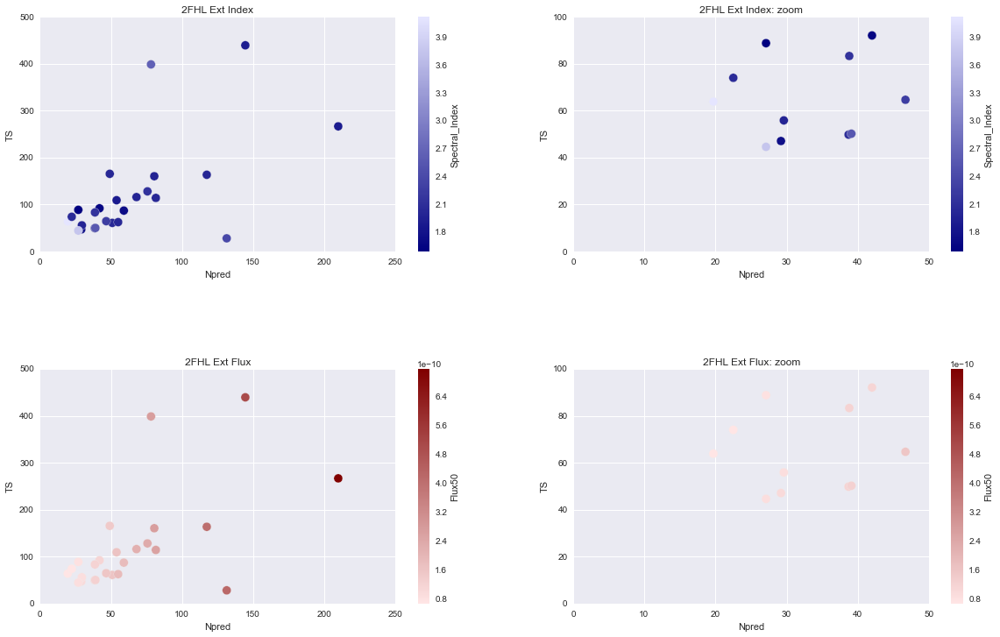

In [130]:
import seaborn as sns

fig, axes = plt.subplots(nrows=2, ncols=2,figsize =(20,12))
pgwES.plot('Npred','TS',kind = 'scatter',s=100,ax=axes[0,0],c = 'Spectral_Index',cmap =sns.light_palette("navy",reverse = True,as_cmap = True))
pgwES.plot('Npred','TS',kind = 'scatter',s=100,ax=axes[0,1],c = 'Spectral_Index',cmap =sns.light_palette("navy",reverse = True, as_cmap = True))
pgwES.plot('Npred','TS',kind = 'scatter',s=100,ax=axes[1,0],c = 'Flux50',cmap =sns.light_palette("maroon",as_cmap = True))
pgwES.plot('Npred','TS',kind = 'scatter',s=100,ax=axes[1,1],c = 'Flux50',cmap =sns.light_palette("maroon",as_cmap = True))
ax1 = axes[0,1]
ax1.set_xlim(0,50)
ax1.set_ylim(0,100)
ax1.set_title ('2FHL Ext Index: zoom')
ax2 = axes[1,1]
ax2.set_xlim(0,50)
ax2.set_ylim(0,100)
ax2.set_title ('2FHL Ext Flux: zoom')
ax3 = axes[0,0]
ax3.set_title('2FHL Ext Index')
ax4 = axes[1,0]
ax4.set_title('2FHL Ext Flux')
# plt.xlim(0,50)
# plt.ylim(0,100)
# plt.title('Zoom')
plt.savefig('/Users/jmcohen/Desktop/2FHL_TS_Npred_flux_index.png')


In [77]:
#a = sns.choose_colorbrewer_palette('sequential',as_cmap=True)


'interactive'

In [13]:
#RxJ1713 and neartby PS 
rxjSrcs = ['2FHL J1714.1-4012','2FHL J1713.5-3945e']
pgw.loc[rxjSrcs]

,DEJ2000,Energy_Flux50,Flux171_585GeV,Flux50,Flux50_171GeV,Flux585_2000GeV,GLAT,GLON,HEP,Nobs_ROI,Npred_ROI,Npred_seed,Pos_err_68,Prob,RAJ2000,ROI,Seed_Name,Spectral_Index,Sqrt_TS171_585GeV,Sqrt_TS50_171GeV,Sqrt_TS585_2000GeV,TS,Unc_Energy_Flux50,Unc_Flux171_585GeV,Unc_Flux50,Unc_Flux50_171GeV,Unc_Flux585_2000GeV,Unc_Spectral_Index
Source_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2FHL J1714.1-4012,-40.209900,1.690000e-11,1.518411e-11,3.810000e-11,2.525985e-11,1.326519e-15,-0.820071,347.031494,400.309998,3712,3711.800049,11.7,0.041456,0.96,258.524994,88,pgw_00111,1.63,3.518833,4.216359,0.000000,27.450001,9.040000e-12,"[7.22373e-12, 1.00356e-11]",1.440000e-11,"[1.05894e-11, 1.3536e-11]","[nan, 6.5746e-12]",0.38
2FHL J1713.5-3945e,-39.759998,4.840000e-11,2.865407e-11,1.640000e-10,1.282697e-10,7.431598e-12,-0.472729,347.335602,949.700012,3712,3711.800049,51.0,0.000000,0.85,258.390015,88,EXTRXJ1713.7-3946,2.03,3.467577,6.877309,1.632465,60.980000,1.330000e-11,"[1.21854e-11, 1.21854e-11]",3.150000e-11,"[2.55917e-11, 2.80859e-11]","[5.4146e-12, 8.41258e-12]",0.23


In [61]:
pgwExt.columns

Index([u'DEJ2000', u'GLAT', u'GLON', u'Model_Form', u'Model_PosAng',
       u'Model_SemiMajor', u'Model_SemiMinor', u'RAJ2000',
       u'Spatial_Filename'],
      dtype='object')

In [65]:
#pgw[pgw['Source_Name'] == 'pgw_00245']
#FHLsrcs = ['2FHL J1355.2-6430e', '2FHL J1443.2-6221e','2FHL J1419.3-6047','2FHL J1112.4-6059e','2FHL J0431.2+5553e']
#pgw.loc[FHLsrcs]
pgw[pgw.index.str.endswith('e')] #all extended


,1FHL_Name,3FGL_Name,ASSOC,ASSOC_PROB_BAY,ASSOC_PROB_LR,CLASS,DEJ2000,Energy_Flux50,Flux171_585GeV,Flux50,Flux50_171GeV,Flux585_2000GeV,GLAT,GLON,HEP_Energy,HEP_Prob,Npred,NuPeak_obs,Pos_err_68,RAJ2000,ROI,Redshift,Spectral_Index,Sqrt_TS171_585GeV,Sqrt_TS50_171GeV,Sqrt_TS585_2000GeV,TS,TeVCat_Name,Unc_Energy_Flux50,Unc_Flux171_585GeV,Unc_Flux50,Unc_Flux50_171GeV,Unc_Flux585_2000GeV,Unc_Spectral_Index
Source_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2FHL J0431.2+5553e,,,SNR G150.3+4.5,NaN,NaN,snr,55.889999,4.940000e-11,3.103479e-11,1.160000e-10,7.429022e-11,1.541850e-11,5.220582,150.387375,889.349976,0.95,42.000000,NaN,0,67.820000,16,NaN,1.66,5.838407,6.545028,4.347311,92.059998,,1.270000e-11,"[-9.0085e-12, 1.10338e-11]",2.050000e-11,"[-1.62894e-11, 1.82514e-11]","[-6.35811e-12, 8.57219e-12]",0.19
2FHL J0526.6-6825e,1FHL J0526.6-6825e,3FGL J0526.6-6825e,LMC,NaN,NaN,gal,-68.419998,3.300000e-11,3.325023e-11,1.180000e-10,8.540114e-11,5.114812e-16,-32.850349,278.843048,535.969971,0.88,38.700001,NaN,0,81.650002,22,NaN,2.09,4.240478,6.076393,0.000000,49.799999,,1.060000e-11,"[-1.12469e-11, 1.34629e-11]",2.490000e-11,"[-1.96369e-11, 2.196e-11]","[nan, 6.35353e-12]",0.27
2FHL J0617.2+2234e,1FHL J0617.2+2234e,3FGL J0617.2+2234e,IC 443,NaN,NaN,snr,22.580000,4.970000e-11,2.493408e-11,2.700000e-10,2.108978e-10,7.137261e-12,3.033463,189.047729,699.500000,0.98,78.199997,NaN,0,94.309998,23,NaN,2.66,6.618845,18.802814,3.699250,398.640015,TeV J0616+2230,8.390000e-12,"[-8.29729e-12, 1.05299e-11]",3.210000e-11,"[-2.58071e-11, 2.79682e-11]","[-3.98377e-12, 6.37625e-12]",0.21
2FHL J0822.6-4250e,1FHL J0822.6-4250e,3FGL J0822.6-4250e,Puppis A,NaN,NaN,snr,-42.840000,8.090000e-12,1.329655e-16,6.870000e-11,4.233326e-11,4.807527e-18,-3.276550,260.317261,115.389999,0.88,19.700001,NaN,0,125.660004,33,NaN,4.12,0.000000,8.091083,0.000000,63.869999,,2.270000e-12,"[nan, 5.86675e-12]",1.670000e-11,"[-9.62507e-12, 1.10407e-11]","[nan, 7.71695e-12]",0.84
2FHL J0833.1-4511e,1FHL J0833.1-4511e,3FGL J0833.1-4511e,Vela X,NaN,NaN,pwn,-45.189999,3.940000e-11,2.319323e-11,1.030000e-10,6.822153e-11,1.500216e-11,-3.104483,263.333252,767.070007,0.88,29.200001,NaN,0,128.289993,33,NaN,1.76,3.879371,4.785518,3.243160,47.080002,TeV J0835-456,1.350000e-11,"[-8.98818e-12, 1.15856e-11]",2.400000e-11,"[-1.89506e-11, 2.15944e-11]","[-7.19208e-12, 1.00643e-11]",0.29
2FHL J0852.8-4631e,1FHL J0852.7-4631e,3FGL J0852.7-4631e,Vela Jr,NaN,NaN,snr,-46.520000,1.640000e-10,9.138833e-11,5.030000e-10,3.674865e-10,4.658067e-11,-1.233237,266.490936,1452.949951,0.97,144.500000,NaN,0,133.199997,35,NaN,1.92,9.359208,17.459883,7.616601,439.339996,TeV J0852-4622,2.330000e-11,"[-1.8215e-11, 2.06654e-11]",4.520000e-11,"[-3.76494e-11, 3.98911e-11]","[-1.3001e-11, 1.55561e-11]",0.11
2FHL J1112.1-6101e,1FHL J1112.5-6105,3FGL J1111.9-6058,PSR J1112-6103,NaN,NaN,pwn,-61.020000,3.210000e-11,1.314302e-11,1.220000e-10,9.575253e-11,1.223719e-11,-0.430651,291.197205,904.830017,0.89,38.799999,NaN,0,168.039993,50,NaN,2.16,2.864026,8.210379,3.362761,83.309998,TeV J1119-614,9.460000e-12,"[-6.27555e-12, 8.49953e-12]",2.250000e-11,"[-1.85449e-11, 2.07521e-11]","[-6.01438e-12, 8.48403e-12]",0.28
2FHL J1303.4-6312e,,3FGL J1303.0-6312e,HESS J1303-631,NaN,NaN,pwn,-63.200001,2.780000e-11,2.665750e-11,9.100000e-11,6.130452e-11,3.008771e-12,-0.357588,304.234833,599.039978,0.87,29.600000,NaN,0,195.750000,62,NaN,1.99,4.537490,5.872828,1.377876,55.869999,TeV J1303-6311,9.480000e-12,"[-9.38295e-12, 1.16844e-11]",2.030000e-11,"[-1.55346e-11, 1.78316e-11]","[-2.53417e-12, 4.89116e-12]",0.29
2FHL J1355.1-6420e,,,PSRJ1357-6429,NaN,NaN,pwn,-64.339996,3.830000e-11,3.258732e-11,8.330000e-11,4.539353e-11,7.616246e-12,-2.315772,309.759399,711.619995,0.97,27.100000,NaN,0,208.779999,62,NaN,1.59,6.893732,5.807880,2.948018,88.769997,TeV J1356-6430,1.290000e-11,"[-9.52614e-12, 1.1659e-11]",1.730000e-11,"[-1.34458e-11, 1.34458e-11]","[-4.38871e-12, 6.9707e-12]",0.25


In [75]:
pgw[pgw.CLASS.str.startswith('psr')]

,1FHL_Name,3FGL_Name,ASSOC,ASSOC_PROB_BAY,ASSOC_PROB_LR,CLASS,DEJ2000,Energy_Flux50,Flux171_585GeV,Flux50,Flux50_171GeV,Flux585_2000GeV,GLAT,GLON,HEP_Energy,HEP_Prob,Npred,NuPeak_obs,Pos_err_68,RAJ2000,ROI,Redshift,Spectral_Index,Sqrt_TS171_585GeV,Sqrt_TS50_171GeV,Sqrt_TS585_2000GeV,TS,TeVCat_Name,Unc_Energy_Flux50,Unc_Flux171_585GeV,Unc_Flux50,Unc_Flux50_171GeV,Unc_Flux585_2000GeV,Unc_Spectral_Index
Source_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2FHL J0835.3-4511,1FHL J0835.3-4510,3FGL J0835.3-4510,PSR J0835-4510,0.977452,NaN,psr,-45.185902,2.940000e-12,2.303133e-16,2.740000e-11,1.265804e-11,7.202103e-16,-2.785702,263.565094,93.720001,0.99,8,NaN,0.037285,128.848999,33,NaN,4.92,0,6.232368,0,38.689999,TeV J0835-453,1.300000e-12,"[nan, 8.81215e-12]",1.060000e-11,"[-4.39643e-12, 5.62524e-12]","[nan, 5.73843e-12]",1.84


In [62]:
#Just looking at the extended extension
pgwExt

,DEJ2000,GLAT,GLON,Model_Form,Model_PosAng,Model_SemiMajor,Model_SemiMinor,RAJ2000,Spatial_Filename
Source_Name,,,,,,,,,
2FHL J0431.2+5553e,55.889999,5.220582,150.387375,Disk,90,1.270,1.27,67.820000,l150_b0_ES_1.fits
2FHL J0526.6-6825e,-68.419998,-32.850349,278.843048,2D Gaussian,90,1.870,1.87,81.650002,LMC.fits
2FHL J0617.2+2234e,22.580000,3.033463,189.047729,2D Gaussian,90,0.270,0.27,94.309998,IC443.fits
2FHL J0822.6-4250e,-42.840000,-3.276550,260.317261,Disk,90,0.370,0.37,125.660004,PuppisA.fits
2FHL J0833.1-4511e,-45.189999,-3.104483,263.333252,Disk,90,0.910,0.91,128.289993,VelaX.fits
2FHL J0852.8-4631e,-46.520000,-1.233237,266.490936,Disk,90,1.120,1.12,133.199997,VelaJr.fits
2FHL J1112.1-6101e,-61.020000,-0.430651,291.197205,Disk,90,0.240,0.24,168.039993,l290_b0_ES_1.fits
2FHL J1303.4-6312e,-63.200001,-0.357588,304.234833,2D Gaussian,90,0.240,0.24,195.750000,HESSJ1303-631.fits
2FHL J1355.1-6420e,-64.339996,-2.315772,309.759399,Disk,90,0.240,0.24,208.779999,l310_b0_ES_1.fits


In [22]:
os.chdir('/Users/jmcohen/Desktop/')
writeReg(pgw,'2FHL_catalog_v5.12.reg') #this doesn't make circles, why?

In [10]:
print os.getcwd()

/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree


In [131]:
###
#got this from elsewhere, don't need it though

# def read_fits_as_dataframe(filename, index_columns):
#     # This is the way to read the FITS data into a numpy structured array
#     # (using astropy.io.fits.getdata didn't work out of the box
#     # because it gives a FITSRec)
#     table = Table.read(filename)
#     data = table._data
#     # Fix byte order.
#     # See https://github.com/astropy/astropy/issues/1156
#     data = data.byteswap().newbyteorder()
#     df = pd.DataFrame.from_records(data)
#     # Strip whitespace for string columns that will become indices
#     for index_column in index_columns:
#         df[index_column] = df[index_column].map(str.strip)
#     df = df.set_index(index_columns)
#     return df

# Read 3FGL into DataFrame

In [68]:
#Read in 3FGL to DataFrame
#removes the uncertainties for nowsince the are 2D
#should just add a dict for upper and lower

#if I just want extended read in the extended extension (next cell)
fgl3 = pyfits.open('/Users/jmcohen/Dropbox/Catalogs/3FGL/gll_psc_v14.fit')
fgl3d =  fgl3[1].data
poplist = []
fgl3dict = {x:fgl3d.field(x) for x in fgl3d.names}
for i in fgl3dict:
    fgl3dict[i] = list(fgl3dict.get(i))
#     if fgl3dict.get(i).ndim > 1:
#         poplist.append(i)

# for i in poplist:
#     fgl3dict.pop(i)
fgl3DF = pd.DataFrame(fgl3dict)
fgl3DF.set_index('Source_Name',inplace = True)
ext3FGL = [i for i in fgl3DF.index if i.endswith('e')]
ext3FGLDF = fgl3DF.loc[ext3FGL]
#ext3FGLDF.Extended_Source_Name

In [69]:
#Just the 2FGL ExtendedSources extension
fgl3e = pyfits.open('/Users/jmcohen/Dropbox/Catalogs/3FGL/gll_psc_v14.fit')
fgl3de =  fgl3e['ExtendedSources'].data
fgl3dicte = {x:fgl3de.field(x) for x in fgl3de.names}
for i in fgl3dicte:
    fgl3dicte[i] = list(fgl3dicte.get(i))

fgl3DFe = pd.DataFrame(fgl3dicte)
fgl3DFe.set_index('Source_Name',inplace = True)
# ext3FGLe = [i for i in fgl3DFe.index if i.endswith('e')]
# ext3FGLDF = fgl3DF.loc[ext3FGL]
# ext3FGLDF.Extended_Source_Name

In [184]:
fgl3DFe.columns

Index([u'2FGL_Name', u'DEJ2000', u'GLAT', u'GLON', u'Model_Form', u'Model_PosAng', u'Model_SemiMajor', u'Model_SemiMinor', u'RAJ2000', u'Spatial_Filename'], dtype='object')

# Plot residual TS maps with 2FHL sources overlayed

In [12]:
mapsDir = os.path.join(galPlaneDir,'mapOverlays_2FHL')
if not os.path.exists(mapsDir) and not os.path.basename(os.getcwd()) == 'mapOverlays_2FHL': 
    os.mkdir(mapsDir)
os.chdir(mapsDir)
print os.getcwd()

/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree/mapOverlays_2FHL


In [8]:
#loop over the 2FHL dir with the fits files
#not sure how to get all the maps to show when doing them like this
singleReg = True
allSrcs = '/Users/jmcohen/Desktop/2FHLRuns/galPlane_lowNorm/2FHL_addSrcs_TSgt25.reg'
zoom = 2.5
fhlDir = '/Users/jmcohen/Dropbox/CurrentWork/2FHL/'
pgwReg = os.path.join(fhlDir,'2fhl_sources.reg')
for reg, regDir in regResDictsFin.items():
    print 'Working on %s' %(reg)
    galPlaneReg = os.path.join(os.path.dirname(regDir), 'TSgt16.reg') #use the last .reg, but initial resid TS map
    if singleReg:
        regFiles = [pgwReg,allSrcs]
    else:
        regFiles = [pgwReg, galPlaneReg]
    for maps in ['Resdiual TS Map','Counts Maps']:
        try:
            if maps == 'Resdiual TS Map':
                mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')
                cbarTitle = 'TS'
            elif maps == 'Counts Maps':
                cmap = reg + '_cmap.fits'
                mapPath = os.path.join(galPlaneDir,reg,'50gevTo3500gev', cmap)
                cbarTitle = 'Counts'
        except Exception, e:
            print "%s for %s doesn't exist. Err: %s" %(maps,reg,str(e))
            continue
        plt.clf()
        figTitle = reg + ' ' + maps
        f = aplpy.FITSFigure(mapPath)
        f.show_colorscale(vmin =0.0, pmax =100., cmap = 'hot', smooth = None) #do I need to playt with the pmin/max? values?
        f.show_grid()
        f.tick_labels.set_xformat('ddd.dd')
        f.tick_labels.set_yformat('ddd.dd')
        f.frame.set_color('black')
        f.frame.set_linewidth(2)
        f.add_colorbar()
        f.axis_labels.set_font(size='large',weight='bold')
        f.tick_labels.set_font(weight = 'bold')
        f.add_label(0.5, 1.1, text = figTitle, relative = True, weight = 'medium', size='large')
        f.colorbar.set_axis_label_text(cbarTitle)
        f.colorbar.set_font(size='large',weight = 'bold')
        f.colorbar.set_axis_label_font(size='large',weight='bold')
        f.colorbar.set_ticks(ticks = plt.MaxNLocator(integer = True))
        for r in regFiles:
            f.show_regions(r)
        for r in regFiles:
            f.show_regions(r)
        for r in regFiles:
            f.show_regions(r)
        if zoom:
            center = reg.strip('Region_l').replace('b','').split('_') #b is always 0, but get it anyway in case I do runs with different b
            center = SkyCoord(l= float(center[0]), b = float(center[1]), frame = 'galactic', unit=(u.degree, u.degree))
            f.recenter(center.l.degree, center.b.degree, zoom)
            sv = reg+maps.replace(' ','')+'_2FHLaddSrcsOverlay_zoom.png'
            f.save(sv)
        else:
            sv = reg+maps.replace(' ','')+'_2FHLaddSrcsOverlay.png'
            f.save(sv)
        #plt.savefig(sv,dpi = 100)
        f.close()
        del f

In [8]:
mapsDir = os.path.join(galPlaneDir,'mapOverlays_SNRs')
if not os.path.exists(mapsDir) and not os.path.basename(os.getcwd()) == 'mapOverlays_SNRs': 
    os.mkdir(mapsDir)
os.chdir(mapsDir)
print os.getcwd()

/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree/mapOverlays_SNRs


In [13]:
superFileYaml = '/Users/jmcohen/Desktop/cur/svn/jmcohen/snrcat1/trunk/superfile/snrdata.yaml'
snrSuperData  = yaml.load(open(superFileYaml))
# want name, coords, rad
radSNR = [snrSuperData[i].get('radius') for i in iter(sorted(snrSuperData))]
galSNR = [snrSuperData[i].get('gal') for i in iter(sorted(snrSuperData))]
#distSNR = [snrSuperData[i].get('dist') for i in iter(sorted(snrSuperData))]
nickSNR = [snrSuperData[i].get('nickname') for i in iter(sorted(snrSuperData))]
radInd = np.asarray([snrSuperData[i].get('radio').get('spectral_index',np.nan) if snrSuperData[i].get('radio') else np.nan for i in iter(sorted(snrSuperData))]) #there are a few SNRs in the superfile that have radio:index instaead od spectral index, so I'm missing those here
snrs = sorted(snrSuperData.keys())
distAll = np.asarray([snrSuperData[i].get('dist').get('kpc',np.nan) if snrSuperData[i].get('dist') else np.nan for i in iter(sorted(snrSuperData))]) #118
snrCatDist = dict(zip(snrs,distAll))
ageAll = np.asarray([float(snrSuperData[i].get('info').get('age',np.nan)) if snrSuperData[i].get('info') else np.nan for i in iter(sorted(snrSuperData))]) #71

gal = [snrSuperData[i].get('gal') for i in iter(sorted(snrSuperData))] #to keep the order of the SNRs
l,b = zip(zip(*gal)) #makes a tuple of tuple of length 1
l = Angle(np.asarray(l),u.degree)
b = Angle(np.asarray(b),u.degree)
#crds is l,b,distance [kpc]
#crds = SkyCoord(l= l, b = b, distance=distAll*u.kpc, frame = 'galactic', unit=(u.degree, u.degree)) #preserves order in sorted(snrSuperData)
crds = SkyCoord(l= l, b = b, frame = 'galactic', unit=(u.degree, u.degree)) #preserves order in sorted(snrSuperData)

#can I add the distance to crds easily?

In [69]:
radIndDF = pd.DataFrame(data = {'RadioSpectralIndex':radInd,'Age':ageAll,'Distance':distAll},index = snrs)

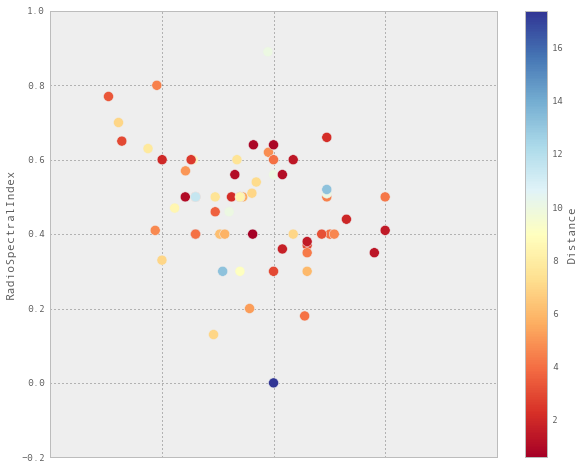

In [71]:
#maybe only plot ones that have a dist?
radIndDF.plot('Age','RadioSpectralIndex', logx= True,c = 'Distance',s=100, colormap='RdYlBu',kind = 'scatter',figsize = [10,8])
#plt.xlabel('log(Age) [yr]')

In [72]:
tevSNRShells = ["SNR266.2-01.2","SNR315.4-02.3","SNR347.3-00.5","SNR353.6-00.7","SNR327.6+14.6"]
radIndDF.loc[tevSNRShells]

,Age,Distance,RadioSpectralIndex
SNR266.2-01.2,2000,0.75,0.4
SNR315.4-02.3,1825,2.50,0.6
SNR347.3-00.5,1618,1.00,0.5
SNR353.6-00.7,27000,3.20,0.4
SNR327.6+14.6,1004,2.00,0.6


## Same as above but overlay SNRs and just on TS maps

In [12]:
#aplpy doesn't read regions files with circles correctly??? That can't be true, it reads in the Region regs. something must be wrong with the format of the allSNRs reg file I got from Jack?
#read in superfile and get radius from there instead
singleReg = True#False
#allSrcs = '/Users/jmcohen/Desktop/2FHLRuns/galPlane_lowNorm/2FHL_addSrcs_TSgt25.reg'
allSrcs = os.path.join(galPlaneDir, 'prunedTSlt25Srcs.reg')
zoom = 2.5
snrRegDir = '/Users/jmcohen/Dropbox/CurrentWork/region_files/'
snrReg = os.path.join(snrRegDir,'snrradtext_updated.reg')
for reg, regDir in regResDictsFin.items():
    print 'Working on %s' %(reg)
    circX = []
    circY = []
    circR = []
    labText = []
    galPlaneReg = os.path.join(os.path.dirname(regDir), 'TSgt16.reg') #us the last .reg, but initial resid TS map
    if singleReg:
        regFiles = [allSrcs]
    else:
        regFiles = [galPlaneReg]
    for maps in ['Resdiual TS Map']:
        try:
            if os.path.exists(os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')):
                mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')
            else:
                mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_aftDelTSlt9_' +reg+ '_tsmap.fits')
            cbarTitle = 'TS'
#             elif maps == 'Counts Maps':
#                 cmap = reg + '_cmap.fits'
#                 mapPath = os.path.join(galPlaneDir,reg,'50gevTo3500gev', cmap)
#                 cbarTitle = 'Counts'
        except Exception, e:
            print "%s for %s doesn't exist. Err: %s" %(maps,reg,str(e))
            continue
        plt.clf()
        figTitle = reg + ' ' + maps
        f = aplpy.FITSFigure(mapPath)
        f.show_colorscale(vmin =0.0, pmax =100., cmap = 'hot', smooth = None) #do I need to playt with the pmin/max? values?
        f.show_grid()
        f.tick_labels.set_xformat('ddd.dd')
        f.tick_labels.set_yformat('ddd.dd')
        f.frame.set_color('black')
        f.frame.set_linewidth(2)
        f.add_colorbar()
        f.axis_labels.set_font(size='large',weight='bold')
        f.tick_labels.set_font(weight = 'bold')
        f.add_label(0.5, 1.1, text = figTitle, relative = True, weight = 'medium', size='large')
        f.colorbar.set_axis_label_text(cbarTitle)
        f.colorbar.set_font(size='large',weight = 'bold')
        f.colorbar.set_axis_label_font(size='large',weight='bold')
        f.colorbar.set_ticks(ticks = plt.MaxNLocator(integer = True))
        center = reg.strip('Region_l').replace('b','').split('_') #b is always 0, but get it anyway in case I do runs with different b
        center = SkyCoord(l= float(center[0]), b = float(center[1]), frame = 'galactic', unit=(u.degree, u.degree))
        dist = crds.separation(center).degree[0]
        for i,d in enumerate(dist):
            if d <= 10.:
                circX.append(galSNR[i][0])
                circY.append(galSNR[i][1])
                circR.append(radSNR[i])
                labText.append(snrs[i])
        if circX:
            f.show_circles(circX,circY,circR,edgecolor = 'w', lw=2)
            for i in range(len(labText)):
                f.add_label(circX[i],circY[i]+circR[i]+0.1,labText[i],size = 'medium', color = 'w') 
        
        for r in regFiles:
            f.show_regions(r)
        for r in regFiles:
            f.show_regions(r)
        for r in regFiles:
            f.show_regions(r)
        if zoom:
            center = reg.strip('Region_l').replace('b','').split('_') #b is always 0, but get it anyway in case I do runs with different b
            center = SkyCoord(l= float(center[0]), b = float(center[1]), frame = 'galactic', unit=(u.degree, u.degree))
            f.recenter(center.l.degree, center.b.degree, zoom)
            sv = reg+maps.replace(' ','')+'_SNRsaddSrcsOverlay_zoom.png'
            f.save(sv)
        else:
            sv = reg+maps.replace(' ','')+'SNRsaddSrcsOverlay.png'
        f.save(sv)
        f.close()
        del f

Working on Region_l275.0_b0.0
ERROR! Session/line number was not unique in database. History logging moved to new session 1409
INFO

INFO:astropy:Auto-setting vmax to  1.323e+01


: Auto-setting vmax to  1.323e+01 [aplpy.core]
Working on Region_l20.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.778e+01


: Auto-setting vmax to  4.778e+01 [aplpy.core]
Working on Region_l300.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.042e+01


: Auto-setting vmax to  3.042e+01 [aplpy.core]
Working on Region_l70.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.030e+01


: Auto-setting vmax to  2.030e+01 [aplpy.core]
Working on Region_l130.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.082e+02


: Auto-setting vmax to  1.082e+02 [aplpy.core]
Working on Region_l85.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.195e+01


: Auto-setting vmax to  5.195e+01 [aplpy.core]
Working on Region_l145.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.651e+01


: Auto-setting vmax to  2.651e+01 [aplpy.core]
Working on Region_l40.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  7.109e+01


: Auto-setting vmax to  7.109e+01 [aplpy.core]
Working on Region_l80.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.064e+01


: Auto-setting vmax to  3.064e+01 [aplpy.core]
Working on Region_l10.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.351e+01


: Auto-setting vmax to  4.351e+01 [aplpy.core]
Working on Region_l355.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.224e+01


: Auto-setting vmax to  4.224e+01 [aplpy.core]
Working on Region_l350.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.753e+01


: Auto-setting vmax to  3.753e+01 [aplpy.core]
Working on Region_l50.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.220e+02


: Auto-setting vmax to  1.220e+02 [aplpy.core]
Working on Region_l280.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.724e+01


: Auto-setting vmax to  3.724e+01 [aplpy.core]
Working on Region_l295.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.992e+01


: Auto-setting vmax to  1.992e+01 [aplpy.core]
Working on Region_l195.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.139e+02


: Auto-setting vmax to  2.139e+02 [aplpy.core]
Working on Region_l185.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.987e+03


: Auto-setting vmax to  3.987e+03 [aplpy.core]
Working on Region_l335.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.312e+01


: Auto-setting vmax to  8.312e+01 [aplpy.core]
Working on Region_l160.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.548e+01


: Auto-setting vmax to  3.548e+01 [aplpy.core]
Working on Region_l190.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.854e+03


: Auto-setting vmax to  3.854e+03 [aplpy.core]
Working on Region_l60.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.769e+01


: Auto-setting vmax to  2.769e+01 [aplpy.core]
Working on Region_l285.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.952e+01


: Auto-setting vmax to  4.952e+01 [aplpy.core]
Working on Region_l15.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.507e+01


: Auto-setting vmax to  4.507e+01 [aplpy.core]
Working on Region_l230.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.375e+01


: Auto-setting vmax to  2.375e+01 [aplpy.core]
Working on Region_l165.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.906e+01


: Auto-setting vmax to  1.906e+01 [aplpy.core]
Working on Region_l260.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.281e+01


: Auto-setting vmax to  6.281e+01 [aplpy.core]
Working on Region_l270.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.376e+01


: Auto-setting vmax to  6.376e+01 [aplpy.core]
Working on Region_l330.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.358e+01


: Auto-setting vmax to  8.358e+01 [aplpy.core]
Working on Region_l225.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.443e+01


: Auto-setting vmax to  2.443e+01 [aplpy.core]
Working on Region_l5.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.039e+01


: Auto-setting vmax to  5.039e+01 [aplpy.core]
Working on Region_l240.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.726e+01


: Auto-setting vmax to  1.726e+01 [aplpy.core]
Working on Region_l135.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.765e+01


: Auto-setting vmax to  4.765e+01 [aplpy.core]
Working on Region_l305.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.532e+01


: Auto-setting vmax to  3.532e+01 [aplpy.core]
Working on Region_l320.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.891e+01


: Auto-setting vmax to  9.891e+01 [aplpy.core]
Working on Region_l265.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.268e+01


: Auto-setting vmax to  6.268e+01 [aplpy.core]
Working on Region_l45.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.257e+02


: Auto-setting vmax to  1.257e+02 [aplpy.core]
Working on Region_l30.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.280e+01


: Auto-setting vmax to  5.280e+01 [aplpy.core]
Working on Region_l290.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.128e+01


: Auto-setting vmax to  5.128e+01 [aplpy.core]
Working on Region_l105.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.518e+02


: Auto-setting vmax to  1.518e+02 [aplpy.core]
Working on Region_l340.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.662e+01


: Auto-setting vmax to  5.662e+01 [aplpy.core]
Working on Region_l150.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.083e+01


: Auto-setting vmax to  3.083e+01 [aplpy.core]
Working on Region_l175.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.799e+01


: Auto-setting vmax to  1.799e+01 [aplpy.core]
Working on Region_l220.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.806e+01


: Auto-setting vmax to  1.806e+01 [aplpy.core]
Working on Region_l315.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.224e+01


: Auto-setting vmax to  9.224e+01 [aplpy.core]
Working on Region_l325.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.003e+02


: Auto-setting vmax to  1.003e+02 [aplpy.core]
Working on Region_l65.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.487e+01


: Auto-setting vmax to  1.487e+01 [aplpy.core]
Working on Region_l155.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.376e+01


: Auto-setting vmax to  3.376e+01 [aplpy.core]
Working on Region_l125.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.361e+02


: Auto-setting vmax to  3.361e+02 [aplpy.core]
Working on Region_l35.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.077e+01


: Auto-setting vmax to  2.077e+01 [aplpy.core]
Working on Region_l205.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.232e+02


: Auto-setting vmax to  1.232e+02 [aplpy.core]
Working on Region_l95.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.390e+01


: Auto-setting vmax to  6.390e+01 [aplpy.core]
Working on Region_l170.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.600e+01


: Auto-setting vmax to  1.600e+01 [aplpy.core]
Working on Region_l115.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.473e+02


: Auto-setting vmax to  3.473e+02 [aplpy.core]
Working on Region_l55.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.094e+02


: Auto-setting vmax to  1.094e+02 [aplpy.core]
Working on Region_l120.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.454e+02


: Auto-setting vmax to  3.454e+02 [aplpy.core]
Working on Region_l90.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.887e+01


: Auto-setting vmax to  5.887e+01 [aplpy.core]
Working on Region_l215.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.770e+01


: Auto-setting vmax to  1.770e+01 [aplpy.core]
Working on Region_l245.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.977e+01


: Auto-setting vmax to  1.977e+01 [aplpy.core]
Working on Region_l110.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.534e+02


: Auto-setting vmax to  1.534e+02 [aplpy.core]
Working on Region_l180.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.929e+03


: Auto-setting vmax to  3.929e+03 [aplpy.core]
Working on Region_l255.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.749e+01


: Auto-setting vmax to  2.749e+01 [aplpy.core]
Working on Region_l250.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.158e+01


: Auto-setting vmax to  2.158e+01 [aplpy.core]
Working on Region_l200.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.272e+02


: Auto-setting vmax to  1.272e+02 [aplpy.core]
Working on Region_l140.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.825e+01


: Auto-setting vmax to  4.825e+01 [aplpy.core]
Working on Region_l235.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.355e+01


: Auto-setting vmax to  2.355e+01 [aplpy.core]
Working on Region_l100.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.842e+01


: Auto-setting vmax to  1.842e+01 [aplpy.core]
Working on Region_l345.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.526e+01


: Auto-setting vmax to  5.526e+01 [aplpy.core]
Working on Region_l210.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.859e+01


: Auto-setting vmax to  1.859e+01 [aplpy.core]
Working on Region_l75.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.027e+01


: Auto-setting vmax to  3.027e+01 [aplpy.core]
Working on Region_l25.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.802e+01


: Auto-setting vmax to  4.802e+01 [aplpy.core]
Working on Region_l310.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.616e+01


: Auto-setting vmax to  4.616e+01 [aplpy.core]


## Overlay every .reg on every RoI, only the overlapping will show up


In [8]:
mapsDir = os.path.join(galPlaneDir,'mapOverlays_neighbors')
if not os.path.exists(mapsDir) and not os.path.basename(os.getcwd()) == 'mapOverlays_neighbors': 
    os.mkdir(mapsDir)
os.chdir(mapsDir)
print os.getcwd()

/Users/jmcohen/Desktop/cur/gt10gevRuns/10gev/mapOverlays_neighbors


In [10]:
# this just tells me which source overlap, but doesn't give them colors right?
# this works, not shure how useful it is
singleReg = False
# allSrcs = '/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/2FHL_addSrcs_TSgt25.reg'
if singleReg:
    regFiles = [allSrcs]
else:
    regFiles = [os.path.join(os.path.dirname(regDir), 'TSgt16.reg') for  regDir in regResDictsFin.values()] #all regions files as a list
for reg, regDir in regResDictsFin.items():
    print 'Working on %s' %(reg)
    galPlaneReg = os.path.join(os.path.dirname(regDir), 'TSgt16.reg') #us the last .reg, but initial resid TS map
    regR = galPlaneReg
    if os.path.exists(regR): #for noGrad run, there are 2 missing reg files
        pyRegR = pyr.open(regR)
        for i in pyRegR: #make the sources in this specific region white
            i.attr[1]['color'] = 'white'
    for maps in ['Resdiual TS Map']:
        try:
            if maps == 'Resdiual TS Map':
                if os.path.exists(os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')):
                    mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')
                else:
                    mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_aftDelTSlt9_' +reg+ '_tsmap.fits')
                cbarTitle = 'TS'
            elif maps == 'Counts Maps':
                cmap = reg + '_cmap.fits'
                mapPath = os.path.join(galPlaneDir,reg,'50gevTo3500gev', cmap)
                cbarTitle = 'Counts'
        except Exception, e:
            print "%s for %s doesn't exist. Err: %s" %(maps,reg,str(e))
            continue
        if not os.path.exists(reg+maps.replace(' ','')+'Neighbor_saddSrcsOverlay.png'):
            plt.clf()
            figTitle = reg + ' ' + maps
            f = aplpy.FITSFigure(mapPath)
            f.show_colorscale(vmin =0.0, pmax =100., cmap = 'hot', smooth = None) #do I need to playt with the pmin/max? values?
            f.show_grid()
            f.tick_labels.set_xformat('ddd.dd')
            f.tick_labels.set_yformat('ddd.dd')
            f.frame.set_color('black')
            f.frame.set_linewidth(2)
            f.add_colorbar()
            f.axis_labels.set_font(size='large',weight='bold')
            f.tick_labels.set_font(weight = 'bold')
            f.add_label(0.5, 1.1, text = figTitle, relative = True, weight = 'medium', size='large')
            f.colorbar.set_axis_label_text(cbarTitle)
            f.colorbar.set_font(size='large',weight = 'bold')
            f.colorbar.set_axis_label_font(size='large',weight='bold')
            f.colorbar.set_ticks(ticks = plt.MaxNLocator(integer = True))
            center = reg.strip('Region_l').replace('b','').split('_') #b is always 0, but get it anyway in case I do runs with different b
            center = SkyCoord(l= float(center[0]), b = float(center[1]), frame = 'galactic', unit=(u.degree, u.degree))        
            for r in regFiles:
                if os.path.exists(r):
                    f.show_regions(r)
            if 'pyRegR' in locals():
                f.show_regions(pyRegR)
            sv = reg+maps.replace(' ','')+'Neighbor_saddSrcsOverlay.png'
            f.save(sv)
            f.close()
            del f
        else:
            print '%s map already exists' %(reg)

Working on Region_l275.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.392e+01
        Use the `.cards` attribute instead. [astropy.utils.decorators]
        Use the `.cards` attribute instead.
        Use the `.cards` attribute instead. [astropy.utils.decorators]
        Use the `.cards` attribute instead.


: Auto-setting vmax to  8.392e+01 [aplpy.core]
Working on Region_l20.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.472e+01


: Auto-setting vmax to  9.472e+01 [aplpy.core]
Working on Region_l300.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.353e+02


: Auto-setting vmax to  1.353e+02 [aplpy.core]
Working on Region_l70.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.188e+01


: Auto-setting vmax to  5.188e+01 [aplpy.core]
Working on Region_l130.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.604e+02


: Auto-setting vmax to  4.604e+02 [aplpy.core]
Working on Region_l85.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.932e+02


: Auto-setting vmax to  3.932e+02 [aplpy.core]
Working on Region_l145.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.234e+01


: Auto-setting vmax to  5.234e+01 [aplpy.core]
Working on Region_l40.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.558e+02


: Auto-setting vmax to  6.558e+02 [aplpy.core]
Working on Region_l80.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.289e+02


: Auto-setting vmax to  4.289e+02 [aplpy.core]
Working on Region_l10.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.074e+02


: Auto-setting vmax to  2.074e+02 [aplpy.core]
Working on Region_l355.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.399e+02


: Auto-setting vmax to  8.399e+02 [aplpy.core]
Working on Region_l350.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.491e+02


: Auto-setting vmax to  1.491e+02 [aplpy.core]
Working on Region_l50.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  7.079e+02


: Auto-setting vmax to  7.079e+02 [aplpy.core]
Working on Region_l280.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.314e+01


: Auto-setting vmax to  8.314e+01 [aplpy.core]
Working on Region_l295.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.861e+02


: Auto-setting vmax to  1.861e+02 [aplpy.core]
Working on Region_l195.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.995e+03


: Auto-setting vmax to  2.995e+03 [aplpy.core]
Working on Region_l185.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.612e+03


: Auto-setting vmax to  5.612e+03 [aplpy.core]
Working on Region_l335.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.059e+02


: Auto-setting vmax to  8.059e+02 [aplpy.core]
Working on Region_l160.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.617e+02


: Auto-setting vmax to  4.617e+02 [aplpy.core]
Working on Region_l190.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.213e+03


: Auto-setting vmax to  5.213e+03 [aplpy.core]
Working on Region_l60.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.012e+02


: Auto-setting vmax to  1.012e+02 [aplpy.core]
Working on Region_l285.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.642e+02


: Auto-setting vmax to  1.642e+02 [aplpy.core]
Working on Region_l15.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.016e+02


: Auto-setting vmax to  2.016e+02 [aplpy.core]
Working on Region_l230.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.141e+02


: Auto-setting vmax to  6.141e+02 [aplpy.core]
Working on Region_l165.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.742e+02


: Auto-setting vmax to  4.742e+02 [aplpy.core]
Working on Region_l260.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.811e+02


: Auto-setting vmax to  2.811e+02 [aplpy.core]
Working on Region_l270.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.830e+01


: Auto-setting vmax to  9.830e+01 [aplpy.core]
Working on Region_l330.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.078e+02


: Auto-setting vmax to  8.078e+02 [aplpy.core]
Working on Region_l225.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.239e+02


: Auto-setting vmax to  6.239e+02 [aplpy.core]
Working on Region_l5.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.413e+02


: Auto-setting vmax to  8.413e+02 [aplpy.core]
Working on Region_l240.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.690e+01


: Auto-setting vmax to  4.690e+01 [aplpy.core]
Working on Region_l135.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.892e+02


: Auto-setting vmax to  2.892e+02 [aplpy.core]
Working on Region_l305.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.552e+02


: Auto-setting vmax to  1.552e+02 [aplpy.core]
Working on Region_l320.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.762e+02


: Auto-setting vmax to  2.762e+02 [aplpy.core]
Working on Region_l265.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.899e+02


: Auto-setting vmax to  1.899e+02 [aplpy.core]
Working on Region_l45.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  7.209e+02


: Auto-setting vmax to  7.209e+02 [aplpy.core]
Working on Region_l30.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.608e+01


: Auto-setting vmax to  9.608e+01 [aplpy.core]
Working on Region_l290.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.821e+02


: Auto-setting vmax to  1.821e+02 [aplpy.core]
Working on Region_l105.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.040e+02


: Auto-setting vmax to  9.040e+02 [aplpy.core]
Working on Region_l340.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.458e+02


: Auto-setting vmax to  1.458e+02 [aplpy.core]
Working on Region_l150.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.052e+02


: Auto-setting vmax to  1.052e+02 [aplpy.core]
Working on Region_l175.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.483e+01


: Auto-setting vmax to  4.483e+01 [aplpy.core]
Working on Region_l220.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.781e+01


: Auto-setting vmax to  9.781e+01 [aplpy.core]
Working on Region_l315.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.376e+02


: Auto-setting vmax to  2.376e+02 [aplpy.core]
Working on Region_l325.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.655e+02


: Auto-setting vmax to  3.655e+02 [aplpy.core]
Working on Region_l65.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.554e+01


: Auto-setting vmax to  5.554e+01 [aplpy.core]
Working on Region_l155.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.389e+02


: Auto-setting vmax to  4.389e+02 [aplpy.core]
Working on Region_l125.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.156e+03


: Auto-setting vmax to  1.156e+03 [aplpy.core]
Working on Region_l35.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.567e+01


: Auto-setting vmax to  6.567e+01 [aplpy.core]
Working on Region_l205.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.771e+02


: Auto-setting vmax to  3.771e+02 [aplpy.core]
Working on Region_l95.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.157e+02


: Auto-setting vmax to  3.157e+02 [aplpy.core]
Working on Region_l170.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.787e+01


: Auto-setting vmax to  3.787e+01 [aplpy.core]
Working on Region_l115.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.199e+03


: Auto-setting vmax to  1.199e+03 [aplpy.core]
Working on Region_l55.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.489e+02


: Auto-setting vmax to  6.489e+02 [aplpy.core]
Working on Region_l120.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.192e+03


: Auto-setting vmax to  1.192e+03 [aplpy.core]
Working on Region_l90.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.996e+02


: Auto-setting vmax to  2.996e+02 [aplpy.core]
Working on Region_l215.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.838e+01


: Auto-setting vmax to  9.838e+01 [aplpy.core]
Working on Region_l245.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  7.091e+01


: Auto-setting vmax to  7.091e+01 [aplpy.core]
Working on Region_l110.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.048e+02


: Auto-setting vmax to  9.048e+02 [aplpy.core]
Working on Region_l180.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.416e+03


: Auto-setting vmax to  5.416e+03 [aplpy.core]
Working on Region_l255.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.887e+02


: Auto-setting vmax to  2.887e+02 [aplpy.core]
Working on Region_l250.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.952e+02


: Auto-setting vmax to  2.952e+02 [aplpy.core]
Working on Region_l200.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.855e+02


: Auto-setting vmax to  3.855e+02 [aplpy.core]
Working on Region_l140.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.481e+02


: Auto-setting vmax to  1.481e+02 [aplpy.core]
Working on Region_l235.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.502e+01


: Auto-setting vmax to  8.502e+01 [aplpy.core]
Working on Region_l100.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.438e+01


: Auto-setting vmax to  6.438e+01 [aplpy.core]
Working on Region_l345.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.464e+02


: Auto-setting vmax to  1.464e+02 [aplpy.core]
Working on Region_l210.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.319e+01


: Auto-setting vmax to  2.319e+01 [aplpy.core]
Working on Region_l75.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.260e+02


: Auto-setting vmax to  4.260e+02 [aplpy.core]
Working on Region_l25.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.170e+01


: Auto-setting vmax to  9.170e+01 [aplpy.core]
Working on Region_l310.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.601e+02


: Auto-setting vmax to  1.601e+02 [aplpy.core]


#Mainly for > 10 GeV. Overlay all 2FHL sources. Use 2FHL TS >= 16

In [12]:
mapsDir = os.path.join(galPlaneDir,'mapOverlays_w2FHL')
if not os.path.exists(mapsDir) and not os.path.basename(os.getcwd()) == 'mapOverlays_w2FHL': 
    os.mkdir(mapsDir)
os.chdir(mapsDir)
print os.getcwd()

/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/mapOverlays_w2FHL


In [19]:
#loop over the 2FHL dir with the fits files
#not sure how to get all the maps to show when doing them like this
singleReg = False
zoom = False #2.5
pgwReg = '/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree/allSrcs.reg'
for reg, regDir in regResDictsFin.items():
    print 'Working on %s' %(reg)
    galPlaneReg = os.path.join(os.path.dirname(regDir), 'TSgt16.reg') #use the last .reg, but initial resid TS map
    if singleReg:
        regFiles = [pgwReg, allSrcs]
    else:
        regFiles = [pgwReg, galPlaneReg]
    for maps in ['Resdiual TS Map']:#,'Counts Maps']:
        try:
            if maps == 'Resdiual TS Map':
                if os.path.exists(os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')):
                    mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')
                else:
                    mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_aftDelTSlt9_' +reg+ '_tsmap.fits')
                cbarTitle = 'TS'
            elif maps == 'Counts Maps':
                cmap = reg + '_cmap.fits'
                mapPath = os.path.join(galPlaneDir,reg,'50gevTo3500gev', cmap)
                cbarTitle = 'Counts'
        except Exception, e:
            print "%s for %s doesn't exist. Err: %s" %(maps,reg,str(e))
            continue
        plt.clf()
        figTitle = reg + ' ' + maps
        f = aplpy.FITSFigure(mapPath)
        f.show_colorscale(vmin =0.0, pmax =100., cmap = 'hot', smooth = None) #do I need to playt with the pmin/max? values?
        f.show_grid()
        f.tick_labels.set_xformat('ddd.dd')
        f.tick_labels.set_yformat('ddd.dd')
        f.frame.set_color('black')
        f.frame.set_linewidth(2)
        f.add_colorbar()
        f.axis_labels.set_font(size='large',weight='bold')
        f.tick_labels.set_font(weight = 'bold')
        f.add_label(0.5, 1.1, text = figTitle, relative = True, weight = 'medium', size='large')
        f.colorbar.set_axis_label_text(cbarTitle)
        f.colorbar.set_font(size='large',weight = 'bold')
        f.colorbar.set_axis_label_font(size='large',weight='bold')
        f.colorbar.set_ticks(ticks = plt.MaxNLocator(integer = True))
        for r in regFiles:
            f.show_regions(r)
        for r in regFiles:
            f.show_regions(r)
        for r in regFiles:
            f.show_regions(r)
        if zoom:
            center = reg.strip('Region_l').replace('b','').split('_') #b is always 0, but get it anyway in case I do runs with different b
            center = SkyCoord(l= float(center[0]), b = float(center[1]), frame = 'galactic', unit=(u.degree, u.degree))
            f.recenter(center.l.degree, center.b.degree, zoom)
            sv = reg+maps.replace(' ','')+'_2FHL_10gevOverlay_zoom.png'
            f.save(sv)
        else:
            sv = reg+maps.replace(' ','')+'_2FHL_10gevOverlay.png'
            f.save(sv)
        #plt.savefig(sv,dpi = 100)
        f.close()
        del f

#Same 10gev as above, but overlay Mar 2FHL

In [47]:
mapsDir = os.path.join(galPlaneDir,'mapOverlays_w2FHL_mar')
if not os.path.exists(mapsDir) and not os.path.basename(os.getcwd()) == 'mapOverlays_w2FHL_mar': 
    os.mkdir(mapsDir)
os.chdir(mapsDir)
print os.getcwd()

/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree/mapOverlays_w2FHL_mar


In [48]:
#loop over the 2FHL dir with the fits files
#not sure how to get all the maps to show when doing them like this
#CHANGED THIS TO USE THE PRUNED FILE FOR 2FHL freeGalNorm
singleReg = True
allSrcs = '/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree/prunedTSlt25Srcs.reg'
zoom = False #2.5
pgwReg = '/Users/jmcohen/Dropbox/CurrentWork/2FHL/finalregion3_2FHL_3bds_50000.0_3500000.0may7.reg'
for reg, regDir in regResDictsFin.items():
    print 'Working on %s' %(reg)
    galPlaneReg = os.path.join(os.path.dirname(regDir), 'TSgt16.reg') #use the last .reg, but initial resid TS map
    if singleReg:
        regFiles = [pgwReg, allSrcs]
    else:
        regFiles = [pgwReg, galPlaneReg]
    for maps in ['Resdiual TS Map']:#,'Counts Maps']:
        try:
            if maps == 'Resdiual TS Map':
                if os.path.exists(os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')):
                    mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')
                else:
                    mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_aftDelTSlt9_' +reg+ '_tsmap.fits')
                cbarTitle = 'TS'
            elif maps == 'Counts Maps':
                cmap = reg + '_cmap.fits'
                mapPath = os.path.join(galPlaneDir,reg,'50gevTo3500gev', cmap)
                cbarTitle = 'Counts'
        except Exception, e:
            print "%s for %s doesn't exist. Err: %s" %(maps,reg,str(e))
            continue
        plt.clf()
        figTitle = reg + ' ' + maps
        f = aplpy.FITSFigure(mapPath)
        f.show_colorscale(vmin =0.0, pmax =100., cmap = 'hot', smooth = None) #do I need to playt with the pmin/max? values?
        f.show_grid()
        f.tick_labels.set_xformat('ddd.dd')
        f.tick_labels.set_yformat('ddd.dd')
        f.frame.set_color('black')
        f.frame.set_linewidth(2)
        f.add_colorbar()
        f.axis_labels.set_font(size='large',weight='bold')
        f.tick_labels.set_font(weight = 'bold')
        f.add_label(0.5, 1.1, text = figTitle, relative = True, weight = 'medium', size='large')
        f.colorbar.set_axis_label_text(cbarTitle)
        f.colorbar.set_font(size='large',weight = 'bold')
        f.colorbar.set_axis_label_font(size='large',weight='bold')
        f.colorbar.set_ticks(ticks = plt.MaxNLocator(integer = True))
        for r in regFiles:
            if os.path.exists(r):
                f.show_regions(r)
            else: print "%s doesn't exist" %(r)
        for r in regFiles:
            if os.path.exists(r):
                f.show_regions(r)
            else: print "%s doesn't exist" %(r)
        for r in regFiles:
            if os.path.exists(r):
                f.show_regions(r)
            else: print "%s doesn't exist" %(r)
        if zoom:
            center = reg.strip('Region_l').replace('b','').split('_') #b is always 0, but get it anyway in case I do runs with different b
            center = SkyCoord(l= float(center[0]), b = float(center[1]), frame = 'galactic', unit=(u.degree, u.degree))
            f.recenter(center.l.degree, center.b.degree, zoom)
            sv = reg+maps.replace(' ','')+'_2FHL_10gevOverlay_zoom.png'
            f.save(sv)
        else:
            sv = reg+maps.replace(' ','')+'_2FHL_10gevOverlay.png'
            f.save(sv)
        #plt.savefig(sv,dpi = 100)
        f.close()
        del f

ERROR! Session/line number was not unique in database. History logging moved to new session 1403
Working on Region_l275.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.323e+01


: Auto-setting vmax to  1.323e+01 [aplpy.core]
Working on Region_l20.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.778e+01


: Auto-setting vmax to  4.778e+01 [aplpy.core]
Working on Region_l300.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.042e+01


: Auto-setting vmax to  3.042e+01 [aplpy.core]
Working on Region_l70.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.030e+01


: Auto-setting vmax to  2.030e+01 [aplpy.core]
Working on Region_l130.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.082e+02


: Auto-setting vmax to  1.082e+02 [aplpy.core]
Working on Region_l85.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.195e+01


: Auto-setting vmax to  5.195e+01 [aplpy.core]
Working on Region_l145.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.651e+01


: Auto-setting vmax to  2.651e+01 [aplpy.core]
Working on Region_l40.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  7.109e+01


: Auto-setting vmax to  7.109e+01 [aplpy.core]
Working on Region_l80.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.064e+01


: Auto-setting vmax to  3.064e+01 [aplpy.core]
Working on Region_l10.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.351e+01


: Auto-setting vmax to  4.351e+01 [aplpy.core]
Working on Region_l355.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.224e+01


: Auto-setting vmax to  4.224e+01 [aplpy.core]
Working on Region_l350.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.753e+01


: Auto-setting vmax to  3.753e+01 [aplpy.core]
Working on Region_l50.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.220e+02


: Auto-setting vmax to  1.220e+02 [aplpy.core]
Working on Region_l280.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.724e+01


: Auto-setting vmax to  3.724e+01 [aplpy.core]
Working on Region_l295.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.992e+01


: Auto-setting vmax to  1.992e+01 [aplpy.core]
Working on Region_l195.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.139e+02


: Auto-setting vmax to  2.139e+02 [aplpy.core]
Working on Region_l185.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.987e+03


: Auto-setting vmax to  3.987e+03 [aplpy.core]
Working on Region_l335.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.312e+01


: Auto-setting vmax to  8.312e+01 [aplpy.core]
Working on Region_l160.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.548e+01


: Auto-setting vmax to  3.548e+01 [aplpy.core]
Working on Region_l190.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.854e+03


: Auto-setting vmax to  3.854e+03 [aplpy.core]
Working on Region_l60.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.769e+01


: Auto-setting vmax to  2.769e+01 [aplpy.core]
Working on Region_l285.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.952e+01


: Auto-setting vmax to  4.952e+01 [aplpy.core]
Working on Region_l15.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.507e+01


: Auto-setting vmax to  4.507e+01 [aplpy.core]
Working on Region_l230.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.375e+01


: Auto-setting vmax to  2.375e+01 [aplpy.core]
Working on Region_l165.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.906e+01


: Auto-setting vmax to  1.906e+01 [aplpy.core]
Working on Region_l260.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.281e+01


: Auto-setting vmax to  6.281e+01 [aplpy.core]
Working on Region_l270.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.376e+01


: Auto-setting vmax to  6.376e+01 [aplpy.core]
Working on Region_l330.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  8.358e+01


: Auto-setting vmax to  8.358e+01 [aplpy.core]
Working on Region_l225.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.443e+01


: Auto-setting vmax to  2.443e+01 [aplpy.core]
Working on Region_l5.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.039e+01


: Auto-setting vmax to  5.039e+01 [aplpy.core]
Working on Region_l240.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.726e+01


: Auto-setting vmax to  1.726e+01 [aplpy.core]
Working on Region_l135.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.765e+01


: Auto-setting vmax to  4.765e+01 [aplpy.core]
Working on Region_l305.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.532e+01


: Auto-setting vmax to  3.532e+01 [aplpy.core]
Working on Region_l320.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.891e+01


: Auto-setting vmax to  9.891e+01 [aplpy.core]
Working on Region_l265.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.268e+01


: Auto-setting vmax to  6.268e+01 [aplpy.core]
Working on Region_l45.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.257e+02


: Auto-setting vmax to  1.257e+02 [aplpy.core]
Working on Region_l30.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.280e+01


: Auto-setting vmax to  5.280e+01 [aplpy.core]
Working on Region_l290.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.128e+01


: Auto-setting vmax to  5.128e+01 [aplpy.core]
Working on Region_l105.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.518e+02


: Auto-setting vmax to  1.518e+02 [aplpy.core]
Working on Region_l340.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.662e+01


: Auto-setting vmax to  5.662e+01 [aplpy.core]
Working on Region_l150.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.083e+01


: Auto-setting vmax to  3.083e+01 [aplpy.core]
Working on Region_l175.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.799e+01


: Auto-setting vmax to  1.799e+01 [aplpy.core]
Working on Region_l220.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.806e+01


: Auto-setting vmax to  1.806e+01 [aplpy.core]
Working on Region_l315.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.224e+01


: Auto-setting vmax to  9.224e+01 [aplpy.core]
Working on Region_l325.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.003e+02


: Auto-setting vmax to  1.003e+02 [aplpy.core]
Working on Region_l65.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.487e+01


: Auto-setting vmax to  1.487e+01 [aplpy.core]
Working on Region_l155.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.376e+01


: Auto-setting vmax to  3.376e+01 [aplpy.core]
Working on Region_l125.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.361e+02


: Auto-setting vmax to  3.361e+02 [aplpy.core]
Working on Region_l35.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.077e+01


: Auto-setting vmax to  2.077e+01 [aplpy.core]
Working on Region_l205.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.232e+02


: Auto-setting vmax to  1.232e+02 [aplpy.core]
Working on Region_l95.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.390e+01


: Auto-setting vmax to  6.390e+01 [aplpy.core]
Working on Region_l170.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.600e+01


: Auto-setting vmax to  1.600e+01 [aplpy.core]
Working on Region_l115.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.473e+02


: Auto-setting vmax to  3.473e+02 [aplpy.core]
Working on Region_l55.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.094e+02


: Auto-setting vmax to  1.094e+02 [aplpy.core]
Working on Region_l120.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.454e+02


: Auto-setting vmax to  3.454e+02 [aplpy.core]
Working on Region_l90.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.887e+01


: Auto-setting vmax to  5.887e+01 [aplpy.core]
Working on Region_l215.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.770e+01


: Auto-setting vmax to  1.770e+01 [aplpy.core]
Working on Region_l245.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.977e+01


: Auto-setting vmax to  1.977e+01 [aplpy.core]
Working on Region_l110.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.534e+02


: Auto-setting vmax to  1.534e+02 [aplpy.core]
Working on Region_l180.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.929e+03


: Auto-setting vmax to  3.929e+03 [aplpy.core]
Working on Region_l255.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.749e+01


: Auto-setting vmax to  2.749e+01 [aplpy.core]
Working on Region_l250.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.158e+01


: Auto-setting vmax to  2.158e+01 [aplpy.core]
Working on Region_l200.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.272e+02


: Auto-setting vmax to  1.272e+02 [aplpy.core]
Working on Region_l140.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.825e+01


: Auto-setting vmax to  4.825e+01 [aplpy.core]
Working on Region_l235.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.355e+01


: Auto-setting vmax to  2.355e+01 [aplpy.core]
Working on Region_l100.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.842e+01


: Auto-setting vmax to  1.842e+01 [aplpy.core]
Working on Region_l345.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.526e+01


: Auto-setting vmax to  5.526e+01 [aplpy.core]
Working on Region_l210.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.859e+01


: Auto-setting vmax to  1.859e+01 [aplpy.core]
Working on Region_l75.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.027e+01


: Auto-setting vmax to  3.027e+01 [aplpy.core]
Working on Region_l25.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.802e+01


: Auto-setting vmax to  4.802e+01 [aplpy.core]
Working on Region_l310.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.616e+01


: Auto-setting vmax to  4.616e+01 [aplpy.core]


## TS maps for 2FHL using 2FHL.reg

In [5]:
mapsDir = os.path.join(galPlaneDir,'2FHLpaper')
if not os.path.exists(mapsDir) and not os.path.basename(os.getcwd()) == '2FHLpaper': 
    os.mkdir(mapsDir)
os.chdir(mapsDir)
print os.getcwd()

/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/2FHLpaper


In [131]:
#I should take this all out and put it in pyForget maybe?
#How do I set the midpoint?
#using MidpointNormalize http://stackoverflow.com/questions/7404116/defining-the-midpoint-of-a-colormap-in-matplotlib
#http://stackoverflow.com/questions/20144529/shifted-colorbar-matplotlib
norm = MidpointNormalize(midpoint=mp) #I don't know where to put this norm in aplpy 

#using MidPointNorm, same problem as abobe I think, where do I put norm?
#using shiftedColorMap
#1 - vmax/(vmax + abs(vmin)) = 1 - 5/(5 + 15)) or 0.75 
#I don't get why vmax < vmin. and if I just want to use the full range from 0-x?
#vmin - vmax...
#(90 - 0 )*frac = 25
#90 to 0 
#(vmin-vmax)/x = 0.75
vmax = 81.820175170898438 #(how to actually get this? pyfits? can I get it in aplpy from f.
vmin = 25
mp = 25/(vmax-vmin)
cm_shift = shiftedColorMap(mpl.cm.RdGy_r, midpoint=mp, name='shifted') #set midpoint to detection signif threshold
#'RdYlBu'

#prettyplotlib does it? Nope, the problem is that I'd have to put center into a ppl object 
spec = brewer2mpl.get_map('BuPu', 'Sequential', 9,reverse = True).mpl_colormap

#didn't use this https://sites.google.com/site/theodoregoetz/notes/matplotlib_colormapadjust

In [135]:
#try these colors 
from colormath.color_objects import sRGBColor, LCHabColor
from colormath.color_conversions import convert_color
l_ramp = np.linspace(20, 90, 256)
c_ramp = np.linspace(30, 50, 256)
h_ramp = np.linspace(240, 450, 256) % 360
rgb_colors = []
for i in xrange(256):
    lch = LCHabColor(l_ramp[i], c_ramp[i], h_ramp[i])
    rgb = convert_color(lch, sRGBColor)
    rgb_colors.append((rgb.clamped_rgb_r, rgb.clamped_rgb_g, rgb.clamped_rgb_b))
cmapTry = mpl.colors.LinearSegmentedColormap.from_list("hcl_colormap", rgb_colors)

In [132]:
# chkMap = pyfits.open(mapPath) #updated
# md = chkMap[0].data
# md.max()
norm.midpoint


0.43998456401810315

In [17]:
#Make 14x14 map of regions, overlay final sources only if TS > 25
#I should use the 2FHL_addSrcs_TSgt25.reg
#do for all sources?
#no fig titles?
#no source names, doI have to make a different reg file to do this?
#save as .eps
#idk how to get rid of the grid lines! update aplpy?
#try shifting midpoint of colormap

plt.clf()
singleReg = True
pgwES = '/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/2FHL_addSrcs_TSgt25_justES_2FHL_noLab.reg'
pgw = '/Users/jmcohen/Dropbox/CurrentWork/2FHL/2FHL_v2.3_noLab.reg'
#regFiles = [pgwES,pgw]
regFiles = [pgw] #addSrcs ES are included in the 2FHL reg
for reg, regDir in regResDictsFin.items():
    if reg in ['Region_l315.0_b0.0','Region_l150.0_b0.0','Region_l25.0_b0.0','Region_l290.0_b0.0']:
        continue
    print 'Working on %s' %(reg)
    galPlaneReg = os.path.join(os.path.dirname(regDir), 'TSgt16.reg') #us the last .reg, but initial resid TS map
    regR = galPlaneReg
    pyRegR = pyr.open(regR)
    for i in pyRegR: #make the sources in this specific region white
        i.attr[1]['color'] = 'white'
    for maps in ['Resdiual TS Map']:
        try:
            if maps == 'Resdiual TS Map':
                mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')
                cbarTitle = 'TS'
            elif maps == 'Counts Maps':
                cmap = reg + '_cmap.fits'
                mapPath = os.path.join(galPlaneDir,reg,'50gevTo3500gev', cmap)
                cbarTitle = 'Counts'
        except Exception, e:
            print "%s for %s doesn't exist. Err: %s" %(maps,reg,str(e))
            continue

        f = aplpy.FITSFigure(mapPath)
        f.show_colorscale(vmin = 0, pmax =100.,cmap = 'hot', smooth = None,) #do I need to playt with the pmin/max? values?
        f.set_tick_color('white')
        f.show_grid()
        f.set_system_latex(usetex = True)
        # f.set_tick_labels_style('latex')
        # f.set_labels_latex(True)
        f.tick_labels.set_xformat('ddd.dd')
        f.tick_labels.set_yformat('ddd.dd')
        #f.frame.set_color('black')
        f.frame.set_linewidth(2)
        f.add_colorbar()
#         cbf = mpl.colorbar.ColorbarBase(axisf3, cmap=mpl.cm.jet,
#                             norm=normf3, orientation='vertical')
        #cbf = mpl.colorbar.ColorbarBase(plt.gca(),norm=norm, orientation='vertical')
        f.axis_labels.set_font(size=18,weight='bold')
        f.tick_labels.set_font(weight = 'bold')        
        f.colorbar.set_axis_label_text(cbarTitle)
        f.colorbar.set_font(size='large',weight = 'bold')
        f.colorbar.set_axis_label_font(size='large',weight='bold')
        #f.colorbar.solids.set_edgecolor("face") #not sure this works?
        #f.colorbar.set_ticks(ticks = plt.MaxNLocator(integer = True))          
        for r in regFiles:
            f.show_regions(r)
        for r in regFiles:
            f.show_regions(r)
        for r in regFiles:
            f.show_regions(r)
        #f.show_regions(allSrcs)
        # f.add_grid()
        # f.hide_grid()
        # aplpy.grid.Grid(f).hide()
        #break
        sv = reg+maps.replace(' ','')+'_residTSmap.eps'
        #sv = reg+maps.replace(' ','')+'_residTSmap.png'
        f.save(sv)
        f.close()
        del f
    #break

Working on Region_l25.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  7.426e+01


: Auto-setting vmax to  7.426e+01 [aplpy.core]
INFO

INFO:astropy:Auto-setting resolution to 20.0717 dpi


: Auto-setting resolution to 20.0717 dpi [aplpy.core]


# The images that made it into the 2FHL paper

In [25]:
os.chdir('/Users/jmcohen/Desktop/')

In [43]:
###Zoom in of the 6 2FHL sources, fix axis labels to be larger
###don't for all sources in RoI, could do for all ES though?
#albSrc = {'l145_b0_ES_1':'Region_l150.0_b0.0', 'l290_b0_ES_1':'Region_l290.0_b0.0', 'l315_b0_ES_3':'Region_l315.0_b0.0', 'l30_b0_ES_2':'Region_l25.0_b0.0', 'l315_b0_ES_4':'Region_l315.0_b0.0', 'l315_b0_ES_1':'Region_l315.0_b0.0'}
albSrc = {'l145_b0_ES_1':'Region_l150.0_b0.0'}
srcFromReg = {'l145_b0_ES_1':'Region_l145.0_b0.0', 'l290_b0_ES_1':'Region_l290.0_b0.0', 'l315_b0_ES_3':'Region_l315.0_b0.0', 'l30_b0_ES_2':'Region_l30.0_b0.0', 'l315_b0_ES_4':'Region_l315.0_b0.0', 'l315_b0_ES_1':'Region_l315.0_b0.0'}
#I want to have different params for vmax and zoom for each source
#make two dicts with the params to enter by hand
vmaxD = {'l145_b0_ES_1':30,'l290_b0_ES_1':40, 'l315_b0_ES_3':55, 'l30_b0_ES_2':40, 'l315_b0_ES_4':65, 'l315_b0_ES_1':45}
zoomD = {'l145_b0_ES_1':3, 'l290_b0_ES_1':2.5, 'l315_b0_ES_3':2, 'l30_b0_ES_2':1.5, 'l315_b0_ES_4':2, 'l315_b0_ES_1':2}
#zoom = 3.0
plt.clf()
singleReg = True
pgwES = '/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/2FHL_addSrcs_TSgt25_justES.reg' # cur/2FHLRuns/galPlane_lowNorm/2FHL_addSrcs_TSgt25_justES_2FHL_noLab.reg'
#pgw = '/Users/jmcohen/Dropbox/CurrentWork/2FHL/2FHL_v2.3_noLab.reg'
pgw = '/Users/jmcohen/Dropbox/CurrentWork/2FHL/2FHL_catalog_v4.0.reg_noLab.reg' #used for G150
#regFiles = [pgwES,pgw]
regFiles = [pgw] #addSrcs ES are included in the 2FHL reg
for srcReg,reg in albSrc.items():
    regDir = regResDictsFin.get(reg)
#     if not reg in 'Region_l290.0_b0.0':#'Region_l150.0_b0.0': #reg in ['Region_l315.0_b0.0','Region_l150.0_b0.0','Region_l25.0_b0.0','Region_l290.0_b0.0']:
#         continue
    print 'Working on %s' %(srcReg)
    for maps in ['Resdiual TS Map']:
        try:
            if maps == 'Resdiual TS Map':
                mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')
                cbarTitle = 'TS'
            elif maps == 'Counts Maps':
                cmap = reg + '_cmap.fits'
                mapPath = os.path.join(galPlaneDir,reg,'50gevTo3500gev', cmap)
                cbarTitle = 'Counts'
        except Exception, e:
            print "%s for %s doesn't exist. Err: %s" %(maps,reg,str(e))
            continue
        f = aplpy.FITSFigure(mapPath)
        f.show_colorscale(vmin = 0, vmax =vmaxD.get(srcReg),cmap = 'hot', smooth = None,) #do I need to playt with the pmin/max? values?
        f.set_tick_color('white')
        f.show_grid()
        f.add_label(x = 150.4,y=3.3,text = '2FHL J0431.2+5553e',family = 'Helvetica', relative =False, weight = 2, size =28, color = 'cyan')
        f.add_label
        f.set_system_latex(usetex = False)
        # f.set_tick_labels_style('latex')
        # f.set_labels_latex(True)
        f.tick_labels.set_xformat('ddd.dd')
        f.tick_labels.set_yformat('ddd.dd')
        ax = plt.gca()
        ax.xaxis.label.set_color('k')
        ax.yaxis.label.set_color('k')
        [i.set_color("k") for i in plt.gca().get_xticklabels()]
        [i.set_color("k") for i in plt.gca().get_yticklabels()]
        cbar = plt.colorbar
        f.frame.set_color('black')
        f.frame.set_linewidth(2)
        f.add_colorbar()
        f.axis_labels.set_font(size='28',weight='bold')
        f.tick_labels.set_font(size ='20',weight = 'bold')
        f.colorbar.set_axis_label_text(cbarTitle)
        ###
        c = f.image.colorbar
        c.ax.yaxis.label.set_color('k')
        [i.set_color("k") for i in c.ax.get_yticklabels()]
        #color_bar = plt.colorbar(f.image.colorbar())                            #this one is a little bit
        #cbytick_obj = plt.getp(color_bar.ax.axes, 'yticklabels')                #tricky
        #plt.setp(cbytick_obj, color='r')
        ###
        #c.set_tick_color('k')
        #f.colorbar.set_color
        f.colorbar.set_font(size='20',weight = 'bold')
        f.colorbar.set_axis_label_font(size='28',weight='bold')
        #f.colorbar.solids.set_edgecolor("face") #not sure this works?
        #f.colorbar.set_ticks(ticks = plt.MaxNLocator(integer = True))
        #Region_l150.0_b0.0 l145_b0_ES_1
        #resPan['Region_l30.0_b0.0'].transpose().dropna(how = 'all').loc['l30_b0_ES_2']
        reg = srcFromReg.get(srcReg)
        l = resPan[reg].transpose().dropna(how = 'all').loc[srcReg].l
        if srcReg in 'l315_b0_ES_1':
            l = l + 0.5
        b = resPan[reg].transpose().dropna(how = 'all').loc[srcReg].b
        if srcReg in 'l145_b0_ES_1':
            b = b-1.5
        f.recenter(l, b, zoomD.get(srcReg))
        for r in regFiles:
            f.show_regions(r)
#         for r in regFiles:
#             f.show_regions(r)
#         for r in regFiles:
#             f.show_regions(r)
        #break
        #f.show_regions(allSrcs)
        # f.add_grid()
        # f.hide_grid()
        # aplpy.grid.Grid(f).hide()
        #break
        sv = srcReg+maps.replace(' ','')+'_residTSmap_2FHL_zoom.eps'
        f.save(sv)
        #sv = srcReg+maps.replace(' ','')+'_residTSmap_2FHL_zoom.png'
        #f.save(sv)
        f.close()
        del f
    #break

Working on l145_b0_ES_1
INFO

INFO:astropy:Auto-setting resolution to 8.60215 dpi


: Auto-setting resolution to 8.60215 dpi [aplpy.core]


# Over plot a single slice of the gal diffuse on 2FHL TS maps with regions

In [94]:
####
mapsDir = os.path.join(galPlaneDir,'galDiffCont')
if not os.path.exists(mapsDir) and not os.path.basename(os.getcwd()) == 'galDiffCont': 
    os.mkdir(mapsDir)
os.chdir(mapsDir)
print os.getcwd()

/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/galDiffCont


In [7]:
#to get the energy slice
#I should just read in the header to do this
# 50 MeV > E < 600 GeV
crval = 58.4731330871582
val = 5.e4 #50gev
cdel = 0.135972685320041
engSlc = np.round((np.log10(val)-np.log10(crval))/cdel)
print engSlc

22.0


In [99]:
#lev = f.show_contour(c, convention='wells', overlap = True, returnlevels = True, colors = colors[i], **kwargs)# What is wells?
#Make 14x14 map of regions, overlay final sources only if TS > 25
#I should use the 2FHL_addSrcs_TSgt25.reg
#do for all sources?
#no fig titles?
#no source names, doI have to make a different reg file to do this?
#save as .eps
#idk how to get rid of the grid lines! update aplpy?
#try shifting midpoint of colormap

plt.clf()
singleReg = True
#norm=matplotlib.colors.LogNorm()
#pgwES = '/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/2FHL_addSrcs_TSgt25_justES_2FHL_noLab.reg'
#pgw = '/Users/jmcohen/Dropbox/CurrentWork/2FHL/2FHL_v2.3_noLab.reg'
#regFiles = [pgwES,pgw]
allSrcs = '/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/2FHL_addSrcs_TSgt25.reg' #should I do this with no labels?
regFiles = [allSrcs] #addSrcs ES are included in the 2FHL reg
cont = '/Users/jmcohen/Desktop/template_4years_P8_V2_scaled.fits'
for reg, regDir in regResDictsFin.items():
#     if not reg == 'Region_l25.0_b0.0' : #in ['Region_l315.0_b0.0','Region_l150.0_b0.0','Region_l25.0_b0.0','Region_l290.0_b0.0']:
#         continue
    print 'Working on %s' %(reg)
    galPlaneReg = os.path.join(os.path.dirname(regDir), 'TSgt16.reg') #us the last .reg, but initial resid TS map
    regR = galPlaneReg
    pyRegR = pyr.open(regR)
    for i in pyRegR: #make the sources in this specific region white
        i.attr[1]['color'] = 'white'
    for maps in ['Resdiual TS Map']:
        try:
            if maps == 'Resdiual TS Map':
                mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')
                cbarTitle = 'TS'
            elif maps == 'Counts Maps':
                cmap = reg + '_cmap.fits'
                mapPath = os.path.join(galPlaneDir,reg,'50gevTo3500gev', cmap)
                cbarTitle = 'Counts'
        except Exception, e:
            print "%s for %s doesn't exist. Err: %s" %(maps,reg,str(e))
            continue

        f = aplpy.FITSFigure(mapPath)
        f.show_colorscale(vmin = 0, pmax =100.,cmap = 'hot', smooth = None,) #do I need to playt with the pmin/max? values?
        f.set_tick_color('white')
        f.show_grid()
        f.set_system_latex(usetex = False)
        # f.set_tick_labels_style('latex')
        # f.set_labels_latex(True)
        f.tick_labels.set_xformat('ddd.dd')
        f.tick_labels.set_yformat('ddd.dd')
        f.tick_labels.set_font(size = 'large', weight = 'bold')
        #f.frame.set_color('black')
        f.frame.set_linewidth(2)
        f.add_colorbar()
#         cbf = mpl.colorbar.ColorbarBase(axisf3, cmap=mpl.cm.jet,
#                             norm=normf3, orientation='vertical')
        #cbf = mpl.colorbar.ColorbarBase(plt.gca(),norm=norm, orientation='vertical')
        f.axis_labels.set_font(size=18,weight='bold')
        f.tick_labels.set_font(weight = 'bold')        
        f.colorbar.set_axis_label_text(cbarTitle)
        f.colorbar.set_font(size='large',weight = 'bold')
        f.colorbar.set_axis_label_font(size=18,weight='bold')
#         ax = plt.gca()
#         cbCont = mpl.colorbar.ColorbarBase(ax, cmap=m,
#                             norm=normf3, orientation='vertical')
#         cbCont.set_label('$Intensity$')
        lev = f.show_contour(cont, convention='wells', overlap = True, returnlevels = True, levels = 9, slices = [engSlc], filled = False, cmap = 'gray', smooth = None)# What is wells?
        print reg, 'contour levels are:',  lev
        #break
        #plt.clabel
        #plt.clabel(lev, fmt = '%2.1f', colors = 'w', fontsize=14)
        #f.colorbar.solids.set_edgecolor("face") #not sure this works?
        #f.colorbar.set_ticks(ticks = plt.MaxNLocator(integer = True))          
        for r in regFiles:
            f.show_regions(r)
        for r in regFiles:
            f.show_regions(r)
        for r in regFiles:
            f.show_regions(r)
        #f.show_regions(allSrcs)
        # f.add_grid()
        # f.hide_grid()
        # aplpy.grid.Grid(f).hide()
        #break
        #sv = reg+maps.replace(' ','')+'_residTSmap.eps'
        sv = reg+maps.replace(' ','')+'.png'
        f.save(sv)
        f.close()
        del f
    #break


Working on Region_l275.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.667e+01


: Auto-setting vmax to  1.667e+01 [aplpy.core]
Region_l275.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l20.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  7.372e+01


: Auto-setting vmax to  7.372e+01 [aplpy.core]
Region_l20.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l300.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.494e+01


: Auto-setting vmax to  4.494e+01 [aplpy.core]
Region_l300.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l70.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.659e+01


: Auto-setting vmax to  2.659e+01 [aplpy.core]
Region_l70.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l130.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.190e+02


: Auto-setting vmax to  1.190e+02 [aplpy.core]
Region_l130.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l290.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.919e+01


: Auto-setting vmax to  6.919e+01 [aplpy.core]
Region_l290.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l85.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.020e+01


: Auto-setting vmax to  6.020e+01 [aplpy.core]
Region_l85.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l145.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.793e+01


: Auto-setting vmax to  2.793e+01 [aplpy.core]
Region_l145.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l40.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  7.487e+01


: Auto-setting vmax to  7.487e+01 [aplpy.core]
Region_l40.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l80.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.503e+01


: Auto-setting vmax to  4.503e+01 [aplpy.core]
Region_l80.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l10.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.176e+01


: Auto-setting vmax to  6.176e+01 [aplpy.core]
Region_l10.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l355.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.235e+01


: Auto-setting vmax to  5.235e+01 [aplpy.core]
Region_l355.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l350.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.878e+01


: Auto-setting vmax to  4.878e+01 [aplpy.core]
Region_l350.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l50.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.269e+02


: Auto-setting vmax to  1.269e+02 [aplpy.core]
Region_l50.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l280.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.551e+01


: Auto-setting vmax to  5.551e+01 [aplpy.core]
Region_l280.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l295.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.615e+01


: Auto-setting vmax to  3.615e+01 [aplpy.core]
Region_l295.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l195.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.486e+02


: Auto-setting vmax to  2.486e+02 [aplpy.core]
Region_l195.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l335.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.403e+01


: Auto-setting vmax to  9.403e+01 [aplpy.core]
Region_l335.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l160.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.499e+01


: Auto-setting vmax to  3.499e+01 [aplpy.core]
Region_l160.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l190.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.314e+03


: Auto-setting vmax to  4.314e+03 [aplpy.core]
Region_l190.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l60.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.006e+01


: Auto-setting vmax to  3.006e+01 [aplpy.core]
Region_l60.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l225.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.525e+01


: Auto-setting vmax to  2.525e+01 [aplpy.core]
Region_l225.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l15.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.679e+01


: Auto-setting vmax to  6.679e+01 [aplpy.core]
Region_l15.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l230.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.436e+01


: Auto-setting vmax to  2.436e+01 [aplpy.core]
Region_l230.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l165.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.876e+01


: Auto-setting vmax to  1.876e+01 [aplpy.core]
Region_l165.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l260.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.217e+01


: Auto-setting vmax to  9.217e+01 [aplpy.core]
Region_l260.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l270.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.000e+01


: Auto-setting vmax to  9.000e+01 [aplpy.core]
Region_l270.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l150.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.079e+01


: Auto-setting vmax to  3.079e+01 [aplpy.core]
Region_l150.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l5.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.178e+01


: Auto-setting vmax to  6.178e+01 [aplpy.core]
Region_l5.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l240.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.988e+01


: Auto-setting vmax to  1.988e+01 [aplpy.core]
Region_l240.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l135.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.303e+01


: Auto-setting vmax to  5.303e+01 [aplpy.core]
Region_l135.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l305.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.495e+01


: Auto-setting vmax to  4.495e+01 [aplpy.core]
Region_l305.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l265.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  9.059e+01


: Auto-setting vmax to  9.059e+01 [aplpy.core]
Region_l265.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l45.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.311e+02


: Auto-setting vmax to  1.311e+02 [aplpy.core]
Region_l45.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l30.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  7.366e+01


: Auto-setting vmax to  7.366e+01 [aplpy.core]
Region_l30.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l285.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.910e+01


: Auto-setting vmax to  6.910e+01 [aplpy.core]
Region_l285.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l105.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.624e+02


: Auto-setting vmax to  1.624e+02 [aplpy.core]
Region_l105.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l0.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.252e+01


: Auto-setting vmax to  5.252e+01 [aplpy.core]
Region_l0.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l175.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.798e+01


: Auto-setting vmax to  1.798e+01 [aplpy.core]
Region_l175.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l220.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.857e+01


: Auto-setting vmax to  1.857e+01 [aplpy.core]
Region_l220.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l315.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.188e+02


: Auto-setting vmax to  1.188e+02 [aplpy.core]
Region_l315.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l325.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.201e+02


: Auto-setting vmax to  1.201e+02 [aplpy.core]
Region_l325.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l65.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.776e+01


: Auto-setting vmax to  1.776e+01 [aplpy.core]
Region_l65.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l155.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.413e+01


: Auto-setting vmax to  3.413e+01 [aplpy.core]
Region_l155.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l125.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.540e+02


: Auto-setting vmax to  3.540e+02 [aplpy.core]
Region_l125.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l35.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.828e+01


: Auto-setting vmax to  2.828e+01 [aplpy.core]
Region_l35.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l205.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.260e+02


: Auto-setting vmax to  1.260e+02 [aplpy.core]
Region_l205.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l95.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.754e+01


: Auto-setting vmax to  6.754e+01 [aplpy.core]
Region_l95.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l170.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.579e+01


: Auto-setting vmax to  1.579e+01 [aplpy.core]
Region_l170.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l115.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.627e+02


: Auto-setting vmax to  3.627e+02 [aplpy.core]
Region_l115.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l55.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.136e+02


: Auto-setting vmax to  1.136e+02 [aplpy.core]
Region_l55.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l120.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.615e+02


: Auto-setting vmax to  3.615e+02 [aplpy.core]
Region_l120.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l90.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  6.391e+01


: Auto-setting vmax to  6.391e+01 [aplpy.core]
Region_l90.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l215.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.816e+01


: Auto-setting vmax to  1.816e+01 [aplpy.core]
Region_l215.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l245.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.233e+01


: Auto-setting vmax to  2.233e+01 [aplpy.core]
Region_l245.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l110.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.623e+02


: Auto-setting vmax to  1.623e+02 [aplpy.core]
Region_l110.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l180.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.383e+03


: Auto-setting vmax to  4.383e+03 [aplpy.core]
Region_l180.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l255.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  3.733e+01


: Auto-setting vmax to  3.733e+01 [aplpy.core]
Region_l255.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l250.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.410e+01


: Auto-setting vmax to  2.410e+01 [aplpy.core]
Region_l250.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l200.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.308e+02


: Auto-setting vmax to  1.308e+02 [aplpy.core]
Region_l200.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l140.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  5.199e+01


: Auto-setting vmax to  5.199e+01 [aplpy.core]
Region_l140.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l235.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  2.545e+01


: Auto-setting vmax to  2.545e+01 [aplpy.core]
Region_l235.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l100.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.971e+01


: Auto-setting vmax to  1.971e+01 [aplpy.core]
Region_l100.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l210.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.884e+01


: Auto-setting vmax to  1.884e+01 [aplpy.core]
Region_l210.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l75.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  4.552e+01


: Auto-setting vmax to  4.552e+01 [aplpy.core]
Region_l75.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l25.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  7.426e+01


: Auto-setting vmax to  7.426e+01 [aplpy.core]
Region_l25.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]
Working on Region_l320.0_b0.0
INFO

INFO:astropy:Auto-setting vmax to  1.193e+02


: Auto-setting vmax to  1.193e+02 [aplpy.core]
Region_l320.0_b0.0 contour levels are: [  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
   1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
   3.44134510e-12]


In [174]:
mapsDir = os.path.join(galPlaneDir,'galDiffTScont')
if not os.path.exists(mapsDir) and not os.path.basename(os.getcwd()) == 'galDiffTScont': 
    os.mkdir(mapsDir)
os.chdir(mapsDir)
print os.getcwd()

/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/galDiffTScont


### Similar to above but use diffuse as bkg and TS map for contours

In [181]:
#lev = f.show_contour(c, convention='wells', overlap = True, returnlevels = True, colors = colors[i], **kwargs)# What is wells?
#Make 14x14 map of regions, overlay final sources only if TS > 25
#I should use the 2FHL_addSrcs_TSgt25.reg
#do for all sources?
#no fig titles?
#no source names, doI have to make a different reg file to do this?
#save as .eps
#idk how to get rid of the grid lines! update aplpy?
plt.clf()
rad = 7
#pgwES = '/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/2FHL_addSrcs_TSgt25_justES_2FHL_noLab.reg'
#pgw = '/Users/jmcohen/Dropbox/CurrentWork/2FHL/2FHL_v2.3_noLab.reg'
#regFiles = [pgwES,pgw]
#regFiles = [pgw]
allSrcs = '/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/2FHL_addSrcs_TSgt25noLab.reg' #should I do this with no labels?
regFiles = [allSrcs] #addSrcs ES are included in the 2FHL reg
#trouble with overplotting regions that wasn't occuring above
#try using pyrgion
#regFiles = [pyr.open(allSrcs)]
cont = '/Users/jmcohen/Desktop/template_4years_P8_V2_scaled.fits'
tscont = pyfits.open(cont)
tscontd = tscont[0].data
tscontd = tscontd.T
tscontd[:,:,22]
tscontd[:,:,22] = np.log10(tscontd[:,:,22])
for reg, regDir in regResDictsFin.items():
#     if not reg == 'Region_l265.0_b0.0' : #in ['Region_l315.0_b0.0','Region_l150.0_b0.0','Region_l25.0_b0.0','Region_l290.0_b0.0']:
#         continue
    l,b = os.path.basename(reg).strip('Region_l').replace('b','').split('_')
    print 'Working on %s' %(reg)
    #galPlaneReg = os.path.join(os.path.dirname(regDir), 'TSgt16.reg') #us the last .reg, but initial resid TS map
    #regR = galPlaneReg
    #pyRegR = pyr.open(regR)
    for i in pyRegR: #make the sources in this specific region white
        i.attr[1]['color'] = 'green'
    for maps in ['Resdiual TS Map']:
        try:
            if maps == 'Resdiual TS Map':
                mapPath = os.path.join(os.path.dirname(os.path.dirname(regDir)),'Initial_fit_' +reg+ '_tsmap.fits')
                cbarTitle = 'Log (Differential Intensity) [photons s$^{-1}$ sr$^{-1}$ cm$^2$ MeV$^{-1}$]'
        except Exception, e:
            print "%s for %s doesn't exist. Err: %s" %(maps,reg,str(e))
            continue
        #make contours in steps of nsigma from 16 up to sqrt(maxTS)+1
        d = pyfits.getdata(mapPath)
        tsmax = d.max()
        numLevs = np.ceil(np.sqrt(tsmax))
        levels = [x**2 for x in np.arange(numLevs+1)][2:]

        f = aplpy.FITSFigure(tscont, slices = [engSlc])
        f.show_colorscale(pmin = 0, pmax =100.,cmap = 'hot', smooth = None) #do I need to playt with the pmin/max? values?
        f._ax1.invert_xaxis()
        f.recenter(float(l),float(b),rad)
        f.set_tick_color('white')
        #f.show_grid()
        f.set_system_latex(usetex = False)
        # f.set_tick_labels_style('latex')
        # f.set_labels_latex(True)
        f.tick_labels.set_xformat('ddd.dd')
        f.tick_labels.set_yformat('ddd.dd')
        #f.frame.set_color('black')
        f.frame.set_linewidth(2)
        f.add_colorbar()
        f.axis_labels.set_font(size=18,weight='bold')
        f.tick_labels.set_font(weight = 'bold')        
        f.colorbar.set_axis_label_text(cbarTitle)
        f.colorbar.set_font(size='large',weight = 'bold')
        f.colorbar.set_axis_label_font(size='large',weight='bold')
        lev = f.show_contour(mapPath, convention='wells', overlap = True, returnlevels = True, levels = levels, filled = False, cmap = 'gray', smooth = None)# What is wells?
        print reg, 'contour levels are:',  lev   
        f._ax1.invert_xaxis()
        for i in r:
            if i.name == 'circle':
                f.show_circles(i.coord_list[0],i.coord_list[1],i.coord_list[2], edgecolor = 'green', lw = 3)
            else:
                f.show_markers(i.coord_list[0], i.coord_list[1], edgecolor='green', facecolor='none', marker='x', s=8, lw =30)
#        f.show_regions(regFiles[0])
#         for r in regFiles:
#             f.show_regions(r)
#         for r in regFiles:
#             f.show_regions(r)
#         for r in regFiles:
#             f.show_regions(r)
        #f.show_regions(allSrcs)
        # f.add_grid()
        # f.hide_grid()
        # aplpy.grid.Grid(f).hide()
        #break
        #sv = reg+maps.replace(' ','')+'_residTSmap.eps'
        sv = reg+maps.replace(' ','')+'_diffBKG.png'
        f.save(sv)
        f.close()
        del f
    #break
    
#I can't get the region to work, does it have to do with weirdness with galdiff map coord?
#can I read in the reg file with pyregion, get all the items and plot them using aplpy

Working on Region_l275.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l275.0_b0.0 contour levels are: [4.0, 9.0, 16.0]
Working on Region_l20.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l20.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0]
Working on Region_l300.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l300.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0]
Working on Region_l70.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l70.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l130.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l130.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0]
Working on Region_l290.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l290.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0]
Working on Region_l85.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l85.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0]
Working on Region_l145.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l145.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0]
Working on Region_l40.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l40.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0]
Working on Region_l80.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l80.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0]
Working on Region_l10.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l10.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0]
Working on Region_l355.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l355.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0]
Working on Region_l350.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l350.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0]
Working on Region_l50.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l50.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0]
Working on Region_l280.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l280.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0]
Working on Region_l295.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l295.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0]
Working on Region_l195.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l195.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0, 144.0, 169.0, 196.0, 225.0, 256.0]
Working on Region_l335.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l335.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0]
Working on Region_l160.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l160.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0]
Working on Region_l190.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l190.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0, 144.0, 169.0, 196.0, 225.0, 256.0, 289.0, 324.0, 361.0, 400.0, 441.0, 484.0, 529.0, 576.0, 625.0, 676.0, 729.0, 784.0, 841.0, 900.0, 961.0, 1024.0, 1089.0, 1156.0, 1225.0, 1296.0, 1369.0, 1444.0, 1521.0, 1600.0, 1681.0, 1764.0, 1849.0, 1936.0, 2025.0, 2116.0, 2209.0, 2304.0, 2401.0, 2500.0, 2601.0, 2704.0, 2809.0, 2916.0, 3025.0, 3136.0, 3249.0, 3364.0, 3481.0, 3600.0, 3721.0, 3844.0, 3969.0]
Working on Region_l60.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l60.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0]
Working on Region_l225.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l225.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l15.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l15.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0]
Working on Region_l230.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l230.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l165.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l165.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l260.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l260.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0]
Working on Region_l270.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l270.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0]
Working on Region_l150.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l150.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0]
Working on Region_l5.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l5.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0]
Working on Region_l240.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l240.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l135.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l135.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0]
Working on Region_l305.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l305.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0]
Working on Region_l265.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l265.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0]
Working on Region_l45.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l45.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0]
Working on Region_l30.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l30.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0]
Working on Region_l285.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l285.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0]
Working on Region_l105.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l105.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0, 144.0, 169.0]
Working on Region_l0.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l0.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0]
Working on Region_l175.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l175.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l220.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l220.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l315.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l315.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0]
Working on Region_l325.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l325.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0]
Working on Region_l65.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l65.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l155.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l155.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0]
Working on Region_l125.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l125.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0, 144.0, 169.0, 196.0, 225.0, 256.0, 289.0, 324.0]
Working on Region_l35.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l35.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0]
Working on Region_l205.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l205.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0]
Working on Region_l95.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l95.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0]
Working on Region_l170.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l170.0_b0.0 contour levels are: [4.0, 9.0, 16.0]
Working on Region_l115.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l115.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0, 144.0, 169.0, 196.0, 225.0, 256.0, 289.0, 324.0, 361.0]
Working on Region_l55.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l55.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0]
Working on Region_l120.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l120.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0, 144.0, 169.0, 196.0, 225.0, 256.0, 289.0, 324.0, 361.0]
Working on Region_l90.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l90.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0]
Working on Region_l215.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l215.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l245.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l245.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l110.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l110.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0, 144.0, 169.0]
Working on Region_l180.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l180.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0, 144.0, 169.0, 196.0, 225.0, 256.0, 289.0, 324.0, 361.0, 400.0, 441.0, 484.0, 529.0, 576.0, 625.0, 676.0, 729.0, 784.0, 841.0, 900.0, 961.0, 1024.0, 1089.0, 1156.0, 1225.0, 1296.0, 1369.0, 1444.0, 1521.0, 1600.0, 1681.0, 1764.0, 1849.0, 1936.0, 2025.0, 2116.0, 2209.0, 2304.0, 2401.0, 2500.0, 2601.0, 2704.0, 2809.0, 2916.0, 3025.0, 3136.0, 3249.0, 3364.0, 3481.0, 3600.0, 3721.0, 3844.0, 3969.0, 4096.0]
Working on Region_l255.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l255.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0]
Working on Region_l250.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l250.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l200.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l200.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0]
Working on Region_l140.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l140.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0]
Working on Region_l235.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l235.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l100.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l100.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l210.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l210.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0]
Working on Region_l75.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l75.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0]
Working on Region_l25.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l25.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0]
Working on Region_l320.0_b0.0
INFO

INFO:astropy:Auto-setting vmin to -1.417e+01
INFO:astropy:Auto-setting vmax to -1.030e+01


: Auto-setting vmin to -1.417e+01 [aplpy.core]
INFO: Auto-setting vmax to -1.030e+01 [aplpy.core]
Region_l320.0_b0.0 contour levels are: [4.0, 9.0, 16.0, 25.0, 36.0, 49.0, 64.0, 81.0, 100.0, 121.0]


In [180]:
############################
#do I not need any of this?
############################
# #0 GLON-CAR 2880 
# #1 GLAT-CAR 1441 
# #2 Energy 30 
# tscont = pyfits.open(cont)
# tscontd = tscont[0].data
# tscontd = tscontd.T
# tscontd[:,:,22]
# tscontd[:,:,22] = np.log10(tscontd[:,:,22])
# f = aplpy.FITSFigure(tscont, slices = [engSlc])
# f.show_colorscale(pmin = 0, pmax =100.,cmap = 'hot', smooth = None) #do I need to playt with the pmin/max? values?
# f.recenter(float(l),float(b),rad)
# f.set_tick_color('white')
# #f.show_grid()
# f.set_system_latex(usetex = False)
# # f.set_tick_labels_style('latex')
# # f.set_labels_latex(True)
# f.tick_labels.set_xformat('ddd.dd')
# f.tick_labels.set_yformat('ddd.dd')
# #f.frame.set_color('black')
# f.frame.set_linewidth(2)
# f.add_colorbar()
# f.axis_labels.set_font(size=18,weight='bold')
# f.tick_labels.set_font(weight = 'bold')        
# f.colorbar.set_axis_label_text(cbarTitle)
# f.colorbar.set_font(size='large',weight = 'bold')
# f.colorbar.set_axis_label_font(size='large',weight='bold')
# f._ax1.invert_xaxis()
# for i in r:
#     if i.name == 'circle':
#         f.show_circles(i.coord_list[0],i.coord_list[1],i.coord_list[2], edgecolor = 'green', lw = 3)
#     else:
#         f.show_markers(i.coord_list[0], i.coord_list[1], edgecolor='green', facecolor='none', marker='x', s=8, lw =30)
a = f._ax2
a.

In [169]:
############################
#do I not need any of this?
############################
r = regFiles[0]
a = r[0]
a.comment #'point=cross color=white'
a.coord_format #galactic
a.coord_list #[6.11827818812, -0.595023167304]
k=r[1]
b.name #'circle'
b.coord_list
# for i in r:
#     print i.comment
for i in r:
    if i.name == 'circle':
        f.show_circles(i.coord_list[0],i.coord_list[1],i.coord_list[2], edgecolor = 'green', lw = 3)
    else:
        f.show_markers(i.coord_list[0], i.coord_list[1], edgecolor='green', facecolor='none', marker='x', s=10, lw=10)
#r2 = pyr.parse(a).as_imagecoord(tscont[0].header)


# Working with Respan to try to get a unique source list

In [24]:
#I want to make a single DF with all the ES/PS sources and (why not) all their source params (really just want postion, pos err, sigma, sigma  err)
#Do I want a single DF or keep as panel?
dropList = [s for s in resPan.minor_axis if not s.startswith('l')]
keepList = [s for s in resPan.minor_axis if s.startswith('l')]
paramList = ['DEC','DECError','RA','RAError','Sigma','SigmaError','Index','IndexError','l','b','TS','TS_ext','Flux','ModCts'] #I don't need index if I have l,b
srcPan = resPan.ix[:, paramList,keepList]#.ix[:,:-3,:] #this only works be cause I know the order of the sources and because they're consecutive 

if 'srcDF' in locals():
    del srcDF
for f in srcPan.items:
    if not 'srcDF' in locals():
        srcDF = srcPan[f].transpose().dropna(how = 'all')
    else:
        srcDF = pd.concat([srcDF,srcPan[f].transpose().dropna(how = 'all')])
        


In [105]:
#write a region file using all the sources from all RoI (will be many overlapping sources)
writeReg(srcDF,outdir =galPlaneDir +'allSrcs.reg' )

In [19]:
#srcDF.loc['l325_b0_ES_1'].columns

In [23]:
#new TS_ext for the same 5 but for galNormFrede
check = ['l150_b0_ES_1', 'l290_b0_ES_1', 'l310_b0_ES_1', 'l315_b0_ES_4', 'l315_b0_ES_3']
for i in srcDF.loc[check].TS_ext:
    print i

[46.459785972147074, 61.96909928805144]
[44.219381118866295, 45.01036722666322]
[32.37529084287962, 33.23353360572946, 33.20061637701292]
[35.667659868973715, 36.21274552545219, 37.00953229453444, 38.66276236793783, 38.59357712995552]
[27.01079538821068, 27.210953399182472, 27.59149429218087, 27.577424679933756]


In [24]:
srcDF.loc[check]

,DEC,DECError,RA,RAError,Sigma,SigmaError,Index,IndexError,l,b,TS,TS_ext,Flux,ModCts
l150_b0_ES_1,[55.8876401306],[0.0733778802373],[67.8215372056],[0.0510803646085],[1.2806893919],[0.0411770184397],[1.59800000753],[0.237796573507],150.3901,5.219698,86.22593,"[46.4597859721, 61.9690992881]",1.311175e-10,37.50231
l290_b0_ES_1,[-61.0240006376],[0.0305352299875],[168.039754441],[0.0350322461549],[0.477865524429],[0.0241708255976],[2.24605755819],[0.336069534373],291.199,-0.4343149,65.35057,"[44.2193811189, 45.0103672267]",1.252399e-10,31.52796
l310_b0_ES_1,[-64.3392142434],[0.0247574525115],[208.779774102],[0.0262143485831],[0.407137762073],[0.0210400996083],[1.32958917275],[0.279835390533],309.7599,-2.314983,74.26858,"[32.3752908429, 33.2335336057, 33.200616377]",9.853422e-11,23.69102
l315_b0_ES_4,[-60.8029089357],[0.0294189261156],[214.825871946],[0.0302256945415],[0.333159465348],[0.0245217633516],[1.71553018059],[0.233044527473],313.4463,0.2624615,90.12551,"[35.667659869, 36.2127455255, 37.0095322945, 3...",1.758357e-10,45.36928
l315_b0_ES_3,[-62.3450766289],[0.0309077443843],[220.824328093],[0.0243930120354],[0.262595558756],[0.0226931264597],[1.83522328031],[0.320502257299],315.5132,-2.237584,74.69786,"[27.0107953882, 27.2109533992, 27.5914942922, ...",8.045384e-11,21.18373


In [25]:
min(srcDF.Index)

[-0.503919486626101]

In [21]:
# #####Don't do these if I'm going to read in the yaml for runs that didn't finish, I thought I had added this, did I change that?
# ####add the two source coincident with HESS J1616 and 1614, remove the ES
# srcDF.loc['l330_b0_ES_2'] = [-51.9358,0.044709,243.6137,0.02611947,np.asarray([0.437196]),0.0266788, 2.295781,331.45540, -0.6799271,133.116642, 84.889026,2.7433495e-10]
# srcDF.loc['l330_b0_ES_3'] = [-50.8928,0.0310581, 244.2633, 0.03197150,np.asarray([0.47869728]), 0.023321481, 1.6430260, 332.46978, -0.20782958,81.161147, 48.23823,4.062071e-11]

In [9]:
#####Don't do these if I'm going to read in the yaml for runs that didn't finish
#####get rid of the sinle coincident ES
srcDF.drop('l335_b0_ES_1',inplace = True)

In [71]:
maxl = len(srcDF)
print maxl
pd.set_option('display.max_columns', maxl)
pd.set_option('display.max_rows', maxl) #I will transpose the frame later
srcDF = pd.DataFrame(srcDF, index=sorted(srcDF.index, key=natural_keys)) #I like having sources sorted

864


In [75]:
# for iind,_ in enumerate(srcDF.index):
#     for jind,_ in enumerate(srcDF.index):
#         print iind,jind

In [11]:
#srcPan['Region_l355.0_b0.0'].transpose().dropna(how = 'all')

In [42]:
###test
# uniqDF = pd.DataFrame(columns=srcDF.columns.tolist()+['oldNameAdded','oldNameNotAdded'])
# uniqDF
# uniqDF.loc['l175_b0_PS_1'] = srcDF.loc['l175_b0_PS_1']
# uniqDF.loc['l175_b0_PS_1'].oldNameNotAdded = 'l50_b0_PS_4'


In [128]:
#try with panel
#want to check neighboring RoI to see if sources overlap
#start with R1, check which other panels are within RoI
#if distance between centers is < rad
# then loop through each source in R1, loop through sources in R2 compare positions
#if R1_ES and R2_ES: check if distance between centers is < sigma 
#if d_center < sigma, consider them the same, go with the one that has the smallest error (sigma?), or highest TS? give new name
#if d_center > sigma, they don't overlap
#what if they only overlap a little bit? I don't check for this, but I can with my maps to see if it ever happens, I don't think it does
#if R1_ES and R2_PS: check if R2 is inside 
#if R2 inside R1, keep both? (how do I know if it's a real source inside, like vela PSR, or multiple PS inside?)
#if not move on
#if R1_PS and R2_ES, do the same as for R1_ES and R2_PS
#if R1_PS and R2_PS check if their error circles overlap
#if they do, they're the same source, give a new name
#how to delete sources in one neighboring RoI, but check in others?
#make first list comparing R1-R2, then use the NR1 and compare that to R3.
#but then how to compare R2 to R3? keep a list of names of deleted?
#can I do this all somehow easier with astropy? no because of the extended source

#make reg file with all sources
#rad = 10 #RoI radius
#sep = 5 # seperation of RoI, i don't think I really need this

###
#can I just use my data frame and compare all source to all others like i do in addSrcs?
# it's not smart, but it's easier to do coding wise right?

In [12]:
#more tests
#test the looping below, find all uniq sources
# s260 = srcDF[srcDF.index.to_series().str.contains('l260')]
# s265 = srcDF[srcDF.index.to_series().str.contains('l265')]
# s270 = srcDF[srcDF.index.to_series().str.contains('l270')]
# srcDFt = pd.concat([s260,s265,s270])
# srcDFt


In [97]:
# #####
# #is it worth spending the time figuring out how to run my assoc loops for 2FHL in parallel in ipynb? Or using cython look at bootcamp notes
# #I can speed this up by only checking if they're within each other's RoI
# #this takes a long time, btu almost works
# #I have some duplicates
# #test on 3 roi, 260,265,270

# #I don't know how to avoid putting multiple overlappign sources in to my new DF
# #one way is to just continue as soon as I put a single overlapping source in
# #if I loop through whole cat and there are no overlaps, add that source
# #this assume that I should only have 1 source with 0.2 deg, it doesn't choose the best really, maybe that's ok
# #I think what i do now though is put srci in right away (whether it's a PS or ES)
# #what im usggesting is to only put it in once I've checked it against every other source
# #so then I'd put a source into uniqDF either a) as soon as I find a match, then move onto next i source 
# #or 2) only after comparing with every other source
# #another way is to make a var called iin that's true as soon as I put a source 
# quiet = True
# uniqDF = pd.DataFrame(columns=srcDFt.columns.tolist()+['oldNameAdded','oldNameNotAdded'])
# PSinES = pd.DataFrame(columns=srcDFt.columns.tolist())
# rad = 10
# minSep = 0.2 #later actually pull in the error ellipse 
# for iind,i in enumerate(srcDFt.index):
#     for jind,j, in enumerate(srcDFt.index):
#         li = i.partition('_')[0].strip('l') #l175_b0_PS_3
#         bi = i.partition('_')[2].partition('_')[0].strip('b') #this is zero for now, but do this in case I do runs with non zero b
#         lj = j.partition('_')[0].strip('l') #l175_b0_PS_3
#         bj = j.partition('_')[2].partition('_')[0].strip('b') #this is zero for now, but do this in case I do runs with non zero b
#         if not li == lj and iind < jind: #don't want the to be the same source, don't want to comare two i already compared
#             if not quiet: print '########'
#             if not quiet: print 'i is ', i, 'j is ',j
#             #check if sources are in the overlapping RoI
#             roii = SkyCoord(l = li , b = bi, frame = 'galactic', unit=(u.degree, u.degree))
#             roij = SkyCoord(l = lj , b = bj, frame = 'galactic', unit=(u.degree, u.degree))
#             roiSep = roii.separation(roij).degree
#             if roiSep >= 2*rad:
#                 if not quiet: print '%s and %s are %s deg away from each other' %(i,j,roiSep)
#                 continue
#             srci = srcDFt.loc[i]
#             srcj = srcDFt.loc[j]
#             crdsi = SkyCoord(l = srci.l , b = srci.b, frame = 'galactic', unit=(u.degree, u.degree))
#             crdsj = SkyCoord(l = srcj.l , b = srcj.b, frame = 'galactic', unit=(u.degree, u.degree))
#             ijSep = crdsi.separation(crdsj).degree
#             ######I think everything up to here is ok
#             if np.isnan(srci.Sigma): #i is PS
#                 if np.isnan(srcj.Sigma): # i is PS, j is PS
#                     if ijSep < minSep: #i && j ps and close
#                         if not quiet: print i, ' and ', j,' are ', ijSep, ' deg from each other. Assume they are the same source'
#                         if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
#                             uniqDF.loc[i] = srcDFt.loc[i]
#                             uniqDF.loc[i].oldNameAdded = i
#                             uniqDF.loc[i].oldNameNotAdded = j
#                         else:
#                             if not quiet: print i, ' or, ', j, 'already listed' 
#                     else: #i && j ps and far
#                         if not quiet: print i, ' and ', j,' are ', ijSep, ' deg from each other, and not the same source.'
#                         if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
#                             uniqDF.loc[i] = srcDFt.loc[i]
#                             uniqDF.loc[i].oldNameAdded = i
#                         if not quiet: print i, ' or, ', j, 'already listed' 
#                         #add i anyway but with no j? or do nothing and only do something at the end?
#                 else: #i is PS j is ES
#                     #if there's a PS inside an ES don't want to keep one over the other, just make note and keep both
#                     #this can happend if 1. neighboring RoI have the same sources (say 1 ES with 1 PS). or 2. if in neighboring Roi an ES is present in one but not the other
#                     if ijSep < srcj.Sigma: #i is in j
#                         if not quiet: print i, ' is PS and ', j,' is ES, with sep ', ijSep, 'deg so i is in j.'
#                         PSinES.loc[i] = srcDFt.loc[i]
#                         PSinES.loc[j] = srcDFt.loc[j]
#                     else: #i is not in j
#                         if not quiet: print i, ' is PS and ', j,' is ES, with sep ', ijSep, 'deg so i is outside j.' #do nothing?
#                         if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
#                             uniqDF.loc[i] = srcDFt.loc[i]
#                             uniqDF.loc[i].oldNameAdded = i
#                         else:
#                             if not quiet: print i, ' or, ', j, 'already listed' 
#             else: #i is ES
#                 if np.isnan(srcj.Sigma): # is ES j is PS
#                     if ijSep < srci.Sigma: #i is in j
#                         if not quiet: print i, ' is ES and ', j,' is PS, with sep ', ijSep, 'deg so j is in i.'
#                         PSinES.loc[i] = srcDFt.loc[i]
#                         PSinES.loc[j] = srcDFt.loc[j]
#                     else: #i is not in j
#                         if not quiet: print i, ' is ES and ', j,' is PS, with sep ', ijSep, 'deg so j is outside i.'
#                         if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
#                             uniqDF.loc[i] = srcDFt.loc[i]
#                             uniqDF.loc[i].oldNameAdded = i
#                         else: 
#                             if not quiet: print i, ' or, ', j, 'already listed' 
#                 else: #i is ES and j is ES
#                     sigSum = srci.Sigma[0] + srcj.Sigma[0]
#                     if ijSep < 2*(sigSum): # extended i and j overlap
#                         if not quiet: print i, ' is ES and ', j,' is ES, with sep ', ijSep, 'and sum of extensions = ',sigSum,' which overlap.'  
#                         if srci.SigmaError < srcj.SigmaError: #go with whichever has the smallest error
#                             if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
#                                 #I really want to add the one with the smaller sigmaErr?
#                                 if not quiet: print 'Sigmai =  ', srci.Sigma, 'Sigmaj =  ', srcj.Sigma, 'dist = ', ijSep, 'SigmaError i = ', srci.SigmaError, 'SigmaEror j =  ', srcj.SigmaError, '. Use the source with the smaller error?' 
#                                 uniqDF.loc[i] = srcDFt.loc[i]
#                                 uniqDF.loc[i].oldNameAdded = i
#                                 uniqDF.loc[i].oldNameNotAdded = j     
#                             else:
#                                 if not quiet: print i, ' or, ', j, 'already listed'
#                         else: #sigmaj has the smaller eroor
#                             if not i in uniqDF.oldNameNotAdded.tolist() and not j in uniqDF.index:
#                                 #I really want to add the one with the smaller sigmaErr?
#                                 if not quiet: print 'Sigmai = , ', srci.Sigma, 'Sigmaj = , ', srcj.Sigma, 'dist = ', ijSep, 'SigmaError i = ', srci.SigmaError, 'SigmaEror j =  ', srcj.SigmaError, '. Use the source with the smaller error?' 
#                                 uniqDF.loc[j] = srcDFt.loc[j]
#                                 uniqDF.loc[j].oldNameAdded = j
#                                 uniqDF.loc[j].oldNameNotAdded = i 
#                             else:
#                                 if not quiet: print i, ' or, ', j, 'already listed'
#                     else: # extended i and j don't overlap
#                         if not quiet: print i, ' is ES and ', j,' is ES, with sep ', ijSep, 'and sum of extensions = ',sigSum, 'which do not overlap' #do nothing?  
#                         if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
#                             uniqDF.loc[i] = srcDFt.loc[i]
#                             uniqDF.loc[i].oldNameAdded = i
#                         else:
#                             if not quiet: print i, ' or, ', j, 'already listed'
#         else:
#             if not quiet: print li,lj,'why are we here?'
           
# #give source new name when I add it, keep track of old name too?
# #I'm worried that there could be a source in roi0 that overlaps with source in roi1, so I include src0 and not src1, then I find that src1 also overlaps with src2, but I don't want to include it as well
# #one way is to check distance of new source with all in catalog, another is to have new col that tells me which sources have been found to overlap and don't admit those
# #

                
# #for ES-ES if sep < sum of rad
# #for PS-PS if sep is < d95 = sqrt(semiMaj_i^2 + semiMaj_j^2+), for this though, I need to read in the loc yaml
                
                
# #if distance between centers is < rad
# # then loop through each source in R1, loop through sources in R2 compare positions
# #if R1_ES and R2_ES: check if distance between centers is < sigma 
# #if d_center < sigma, consider them the same, go with the one that has the smallest error (sigma?), or highest TS? give new name
# #if d_center > sigma, they don't overlap
# #what if they only overlap a little bit? I don't check for this, but I can with my maps to see if it ever happens, I don't think it does
# #if R1_ES and R2_PS: check if R2 is inside 
# #if R2 inside R1, keep both? (how do I know if it's a real source inside, like vela PSR, or multiple PS inside?)
# #if not move on
# #if R1_PS and R2_ES, do the same as for R1_ES and R2_PS
# #if R1_PS and R2_PS check if their error circles overlap
# #if they do, they're the same source, give a new name
# #how to delete sources in one neighboring RoI, but check in others?
# #make first list comparing R1-R2, then use the NR1 and compare that to R3.
# #but then how to compare R2 to R3? keep a list of names of deleted?
# #can I do this all somehow easier with astropy? no because of the extended source

# #make reg file with all sources

In [ ]:
#try only adding the source once I know it has no counterpart or once I know it does (then continue)
#####
#I can speed this up by only checking if they're within each other's RoI
#this takes a long time, btu almost works
#I have some duplicates
#test on 3 roi, 260,265,270

#I don't know how to avoid putting multiple overlappign sources in to my new DF
#one way is to just continue as soon as I put a single overlapping source in
#if I loop through whole cat and there are no overlaps, add that source
#this assume that I should only have 1 source with 0.2 deg, it doesn't choose the best really, maybe that's ok
#I think what i do now though is put srci in right away (whether it's a PS or ES)
#what im usggesting is to only put it in once I've checked it against every other source
#so then I'd put a source into uniqDF either a) as soon as I find a match, then move onto next i source 
#or 2) only after comparing with every other source
#another way is to make a var called iin that's true as soon as I put a source 
quiet = True
uniqDF = pd.DataFrame(columns=srcDFt.columns.tolist()+['oldNameAdded','oldNameNotAdded'])
PSinES = pd.DataFrame(columns=srcDFt.columns.tolist())
rad = 10
minSep = 0.2 #later actually pull in the error ellipse 
for iind,i in enumerate(srcDFt.index):
    for jind,j, in enumerate(srcDFt.index):
        li = i.partition('_')[0].strip('l') #l175_b0_PS_3
        bi = i.partition('_')[2].partition('_')[0].strip('b') #this is zero for now, but do this in case I do runs with non zero b
        lj = j.partition('_')[0].strip('l') #l175_b0_PS_3
        bj = j.partition('_')[2].partition('_')[0].strip('b') #this is zero for now, but do this in case I do runs with non zero b
        if not li == lj and iind < jind: #don't want the to be the same source, don't want to comare two i already compared
            if not quiet: print '########'
            if not quiet: print 'i is ', i, 'j is ',j
            #check if sources are in the overlapping RoI
            roii = SkyCoord(l = li , b = bi, frame = 'galactic', unit=(u.degree, u.degree))
            roij = SkyCoord(l = lj , b = bj, frame = 'galactic', unit=(u.degree, u.degree))
            roiSep = roii.separation(roij).degree
            if roiSep >= 2*rad:
                if not quiet: print '%s and %s are %s deg away from each other' %(i,j,roiSep)
                continue
            srci = srcDFt.loc[i]
            srcj = srcDFt.loc[j]
            crdsi = SkyCoord(l = srci.l , b = srci.b, frame = 'galactic', unit=(u.degree, u.degree))
            crdsj = SkyCoord(l = srcj.l , b = srcj.b, frame = 'galactic', unit=(u.degree, u.degree))
            ijSep = crdsi.separation(crdsj).degree
            ######I think everything up to here is ok
            if np.isnan(srci.Sigma): #i is PS
                if np.isnan(srcj.Sigma): # i is PS, j is PS
                    if ijSep < minSep: #i && j ps and close
                        if not quiet: print i, ' and ', j,' are ', ijSep, ' deg from each other. Assume they are the same source'
                        if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
                            uniqDF.loc[i] = srcDFt.loc[i]
                            uniqDF.loc[i].oldNameAdded = i
                            uniqDF.loc[i].oldNameNotAdded = j
                        else:
                            if not quiet: print i, ' or, ', j, 'already listed' 
                    else: #i && j ps and far
                        if not quiet: print i, ' and ', j,' are ', ijSep, ' deg from each other, and not the same source.'
                        if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
                            uniqDF.loc[i] = srcDFt.loc[i]
                            uniqDF.loc[i].oldNameAdded = i
                        if not quiet: print i, ' or, ', j, 'already listed' 
                        #add i anyway but with no j? or do nothing and only do something at the end?
                else: #i is PS j is ES
                    #if there's a PS inside an ES don't want to keep one over the other, just make note and keep both
                    #this can happend if 1. neighboring RoI have the same sources (say 1 ES with 1 PS). or 2. if in neighboring Roi an ES is present in one but not the other
                    if ijSep < srcj.Sigma: #i is in j
                        if not quiet: print i, ' is PS and ', j,' is ES, with sep ', ijSep, 'deg so i is in j.'
                        PSinES.loc[i] = srcDFt.loc[i]
                        PSinES.loc[j] = srcDFt.loc[j]
                    else: #i is not in j
                        if not quiet: print i, ' is PS and ', j,' is ES, with sep ', ijSep, 'deg so i is outside j.' #do nothing?
                        if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
                            uniqDF.loc[i] = srcDFt.loc[i]
                            uniqDF.loc[i].oldNameAdded = i
                        else:
                            if not quiet: print i, ' or, ', j, 'already listed' 
            else: #i is ES
                if np.isnan(srcj.Sigma): # is ES j is PS
                    if ijSep < srci.Sigma: #i is in j
                        if not quiet: print i, ' is ES and ', j,' is PS, with sep ', ijSep, 'deg so j is in i.'
                        PSinES.loc[i] = srcDFt.loc[i]
                        PSinES.loc[j] = srcDFt.loc[j]
                    else: #i is not in j
                        if not quiet: print i, ' is ES and ', j,' is PS, with sep ', ijSep, 'deg so j is outside i.'
                        if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
                            uniqDF.loc[i] = srcDFt.loc[i]
                            uniqDF.loc[i].oldNameAdded = i
                        else: 
                            if not quiet: print i, ' or, ', j, 'already listed' 
                else: #i is ES and j is ES
                    sigSum = srci.Sigma[0] + srcj.Sigma[0]
                    if ijSep < 2*(sigSum): # extended i and j overlap
                        if not quiet: print i, ' is ES and ', j,' is ES, with sep ', ijSep, 'and sum of extensions = ',sigSum,' which overlap.'  
                        if srci.SigmaError < srcj.SigmaError: #go with whichever has the smallest error
                            if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
                                #I really want to add the one with the smaller sigmaErr?
                                if not quiet: print 'Sigmai =  ', srci.Sigma, 'Sigmaj =  ', srcj.Sigma, 'dist = ', ijSep, 'SigmaError i = ', srci.SigmaError, 'SigmaEror j =  ', srcj.SigmaError, '. Use the source with the smaller error?' 
                                uniqDF.loc[i] = srcDFt.loc[i]
                                uniqDF.loc[i].oldNameAdded = i
                                uniqDF.loc[i].oldNameNotAdded = j     
                            else:
                                if not quiet: print i, ' or, ', j, 'already listed'
                        else: #sigmaj has the smaller eroor
                            if not i in uniqDF.oldNameNotAdded.tolist() and not j in uniqDF.index:
                                #I really want to add the one with the smaller sigmaErr?
                                if not quiet: print 'Sigmai = , ', srci.Sigma, 'Sigmaj = , ', srcj.Sigma, 'dist = ', ijSep, 'SigmaError i = ', srci.SigmaError, 'SigmaEror j =  ', srcj.SigmaError, '. Use the source with the smaller error?' 
                                uniqDF.loc[j] = srcDFt.loc[j]
                                uniqDF.loc[j].oldNameAdded = j
                                uniqDF.loc[j].oldNameNotAdded = i 
                            else:
                                if not quiet: print i, ' or, ', j, 'already listed'
                    else: # extended i and j don't overlap
                        if not quiet: print i, ' is ES and ', j,' is ES, with sep ', ijSep, 'and sum of extensions = ',sigSum, 'which do not overlap' #do nothing?  
                        if not j in uniqDF.oldNameNotAdded.tolist() and not i in uniqDF.index:
                            uniqDF.loc[i] = srcDFt.loc[i]
                            uniqDF.loc[i].oldNameAdded = i
                        else:
                            if not quiet: print i, ' or, ', j, 'already listed'
        else:
            if not quiet: print li,lj,'why are we here?'
           
#give source new name when I add it, keep track of old name too?
#I'm worried that there could be a source in roi0 that overlaps with source in roi1, so I include src0 and not src1, then I find that src1 also overlaps with src2, but I don't want to include it as well
#one way is to check distance of new source with all in catalog, another is to have new col that tells me which sources have been found to overlap and don't admit those
#

                
#for ES-ES if sep < sum of rad
#for PS-PS if sep is < d95 = sqrt(semiMaj_i^2 + semiMaj_j^2+), for this though, I need to read in the loc yaml
                
                
#if distance between centers is < rad
# then loop through each source in R1, loop through sources in R2 compare positions
#if R1_ES and R2_ES: check if distance between centers is < sigma 
#if d_center < sigma, consider them the same, go with the one that has the smallest error (sigma?), or highest TS? give new name
#if d_center > sigma, they don't overlap
#what if they only overlap a little bit? I don't check for this, but I can with my maps to see if it ever happens, I don't think it does
#if R1_ES and R2_PS: check if R2 is inside 
#if R2 inside R1, keep both? (how do I know if it's a real source inside, like vela PSR, or multiple PS inside?)
#if not move on
#if R1_PS and R2_ES, do the same as for R1_ES and R2_PS
#if R1_PS and R2_PS check if their error circles overlap
#if they do, they're the same source, give a new name
#how to delete sources in one neighboring RoI, but check in others?
#make first list comparing R1-R2, then use the NR1 and compare that to R3.
#but then how to compare R2 to R3? keep a list of names of deleted?
#can I do this all somehow easier with astropy? no because of the extended source

#make reg file with all sources

In [13]:
###more tests
# rad =10.
# c = 0
# for iind,i in enumerate(srcDF.index):
#     for jind,j, in enumerate(srcDF.index):
#         li = i.partition('_')[0].strip('l') #l175_b0_PS_3
#         bi = i.partition('_')[2].partition('_')[0].strip('b')
#         lj = j.partition('_')[0].strip('l') #l175_b0_PS_3
#         bj = j.partition('_')[2].partition('_')[0].strip('b')
#         if not li == lj and iind < jind: #don't want the to be the same source, don't want to comare two i already compared
#             roii = SkyCoord(l = li , b = bi, frame = 'galactic', unit=(u.degree, u.degree))
#             roij = SkyCoord(l = lj , b = bj, frame = 'galactic', unit=(u.degree, u.degree))
#             roiSep = roii.separation(roij).degree
#             if roiSep >= 2*rad:
#                 continue
#             c = c+1
# print c

In [98]:
################################################################################
#THIS ALL WORKS AND CHANGES THE NAMES OF SOURCE IN EACH DF OF THE PANEL, 
#BUT IT DOESN'T CHANGE THE MINOR AXIS.
#WASN'T SURE IF THIS WOULD BE A PROBLEM, SO I CHANGE THE NAME WHEN READING IN THE YAML
################################################################################
# rp = resPan 
# for r in rp:
#     l,b = r.strip('Region_l').replace('b','').split('_')
#     regStr = 'l%s_b%s_' %(str(int(float(l))), str(int(float(b))))
#     #print regStr
#     df = rp[r]
#     cols = [s for s in rp[r].columns if s.startswith('ES')]
#     PSind = 0
#     ESind = 0
#     #print cols
#     for s in cols:
#         #print s
#         if not np.isnan(rp[r][s].Sigma): #if sigma is not nan then source is extended
#             rp[r].rename(columns = {s:regStr+'ES_'+str(ESind)}, inplace = True) 
#             ESind = ESind + 1
#             #print 'ES',ESind
#         else:
#             rp[r].rename(columns = {s:regStr+'PS_'+str(PSind)}, inplace = True) 
#             PSind = PSind + 1
#             #print 'PS',PSind

#print rp.minor_axis #it seems that this doesn't change the minor axis, is this going to be a problem? all the col names are indeed changed though

#oh does every frame in every panel have all the same params :(  

In [14]:
###do I not need this? moved to writeReg?

# %cd ~/Desktop/
# regfilename='2FHL_addSrcs_all5deg.reg'
# outdir = os.path.join('/Users/jmcohen/Desktop',regfilename)
# f = open(outdir,'w')
# f.write("# Region file format: DS9 version 4.0 global \n")
# f.write("fk5 \n")
# for name in srcDF.index:
# #     ra = uniqDF.loc[name].RA
# #     dec = uniqDF.loc[name].DEC
#     l = srcDF.loc[name].l
#     b = srcDF.loc[name].b
#     sigma = srcDF.loc[name].Sigma
#     fk5 = SkyCoord(l= l, b = b, frame = 'galactic', unit=(u.degree, u.degree)).fk5
#     if np.isnan(sigma):
#         f.write( "fk5; point("+str(fk5.ra.degree)+","+str(fk5.dec.degree)+") # point=cross text={"+name+"} color=green \n")
#     else:
#         f.write( "circle("+str(fk5.ra.degree)+","+str(fk5.dec.degree)+","+str(sigma[0])+")  # text={"+name+"} color=green \n")
# f.close()

In [24]:
uniqDF = pd.io.pickle.read_pickle('/Users/jmcohen/Desktop/galPlane_lowNorm/galPlane2FHL_uniqDF.dat')
#dfPS = uniqDF[uniqDF.Sigma.isnull()]


In [15]:
#I think this was tests as well?
# for iind,i in enumerate(srcDF.index):
#     for jind,j, in enumerate(srcDF.index):
#         li = i.partition('_')[0].strip('l') #l175_b0_PS_3
#         bi = i.partition('_')[2].partition('_')[0].strip('b') #this is zero for now, but do this in case I do runs with non zero b
#         lj = j.partition('_')[0].strip('l') #l175_b0_PS_3
#         bj = j.partition('_')[2].partition('_')[0].strip('b') #this is zero for now, but do this in case I do runs with non zero b
#         if not li == lj and iind < jind: #don't want the to be the same source, don't want to comare two i already compared
#             #check if sources are in the overlapping RoI
#             roii = SkyCoord(l = li , b = bi, frame = 'galactic', unit=(u.degree, u.degree))
#             roij = SkyCoord(l = lj , b = bj, frame = 'galactic', unit=(u.degree, u.degree))
#             roiSep = roii.separation(roij).degree
#             if roiSep >= rad:
#                 if not quiet: print '%s and %s are %s deg away from each other' %(i,j,roiSep)
#                 continue

In [ ]:
##################
#above get uniqDF worked ou
#below make a PS and ES slice and then compare the PS with 2FHL and ES with 3FGL
##################

In [77]:
# #uniqDF[uniqDF.Sigma.notnull()] #same as dropna(subset= ['Sigma'])
# uniqPS = uniqDF[uniqDF.Sigma.isnull()]
# uniqES = uniqDF.dropna(subset = ['Sigma'])


In [365]:
####test
#it would be really nice to be able to use pdist to calc distances (I think?)
#the problem is this is angular sep, so 360deg = 0deg
#try convert coords to radians
#then use np.unwrap to wrap radian phase
#then calc distance
#then convert to degree?

#crds = zip(srcDF.l.tolist(),srcDF.b.tolist())
#sepMx = squareform(pdist(crds))
#sepMxcos = squareform(pdist(crds,metric ='cosine'))
#srcDF.l
# crds = SkyCoord(l = srcDF.l , b = srcDF.b, frame = 'galactic', unit=(u.degree, u.degree))
# crds180 = np.asarray(zip(crds.l.degree,crds.b.degree))
# crds180[crds180 > 180] = crds180[crds180 > 180] -360 #this take account of the fact that 360deg = 0deg
# sepMX180 = squareform(pdist(crds180)) 



In [16]:
##test
# does this all help?
#what I still need to do is loop through? all sources?
#or can I just get the index values for when the distance is >0.2?
#then go back and see what those sources are
#then make sure that they're not at the the same l,b?
#hot to do the latter without keeping track of names?
# sepMX180assoc = sepMX180[np.where(sepMX180 <= 0.2)]
# max(sepMX180assoc)

In [368]:
#test for using pdist???
# srci = srcDF.iloc[0]
# srcj = srcDF.iloc[14]
# crdsi = SkyCoord(l = srci.l , b = srci.b, frame = 'galactic', unit=(u.degree, u.degree))
# crdsj = SkyCoord(l = srcj.l , b = srcj.b, frame = 'galactic', unit=(u.degree, u.degree))
# ijSep = crdsi.separation(crdsj).degree
# print sepMX180[0][14], ijSep, srci.l,srcj.l #ij is right, why isn't sepmMXrad?

14.8097617627 14.8094688428 353.5754254 8.37758235523


# Read in pruned reg file for sources I removed by hand (after dealing with extended sources)

In [111]:
# checkList = ['l175_b0_ES_1','l80_b0_ES_1','l170_b0_ES_1']
# checkList = ['l75_b0_ES_1','l75_b0_ES_2','l80_b0_ES_1','l80_b0_ES_2','l85_b0_ES_1','l85_b0_ES_2',]
#checkList = ['l30_b0_ES_1','l30_b0_ES_2','l30_b0_ES_3','l20_b0_ES_1','l20_b0_ES_2','l20_b0_ES_3','l20_b0_ES_4']
#checkList = [s for s in srcDF.index if s.startswith(('l295_','l285_','l290'))]
#right now these are the 7 sources in 2FHL
checkList = ['l290_b0_ES_1', 'l315_b0_ES_1', 'l310_b0_ES_2', 'l315_b0_ES_4', 'l315_b0_ES_3', 'l30_b0_ES_2','l145_b0_ES_1']
#srcDF.loc[checkList].Sigma.apply((lambda x: dgr68.r6899(x,'Disk',r = '68'))) #dfnearES['addSrcs_r68'] = s
srcDF.loc[checkList]


In [90]:
#### I just copied the names of the sources and cut the df with that

# #read in my region file
# tsgt16reg = '/Users/jmcohen/Desktop/2FHL_addSrcs_ts16.reg' 
# pyRegtsgt16 = pyr.open(tsgt16reg)
# #use the names to slice srcDF to only contain those sources
# #make a cut on TS to remove 
# #len(srcDF) #353 not-necessarily-unique sources
# #srcDF25 = srcDF[srcDF.TS >= 25]
# #len(srcDF25) #174 not-necessarily-unique sources


In [119]:
#from tsgt16.reg
#prunedTSgt16 = ['l10_b0_PS_3','l10_b0_PS_4','l15_b0_ES_2','l15_b0_PS_1','l15_b0_PS_4','l15_b0_PS_6','l30_b0_ES_3','l40_b0_PS_2','l40_b0_PS_3','l45_b0_PS_3','l45_b0_PS_4','l50_b0_PS_6','l55_b0_PS_4','l65_b0_PS_1','l65_b0_PS_2','l80_b0_ES_1','l80_b0_PS_5','l85_b0_PS_5','l90_b0_PS_1','l110_b0_PS_1','l115_b0_PS_1','l115_b0_PS_4','l115_b0_PS_5','l120_b0_PS_3','l125_b0_PS_3','l130_b0_PS_9','l135_b0_PS_5','l135_b0_PS_6','l140_b0_PS_3','l140_b0_PS_4','l140_b0_PS_5','l200_b0_PS_4','l205_b0_PS_1','l205_b0_PS_2','l230_b0_PS_4','l230_b0_PS_5','l235_b0_PS_1','l235_b0_PS_2','l265_b0_PS_3','l295_b0_PS_1','l295_b0_PS_2','l315_b0_ES_3','l315_b0_ES_5','l325_b0_ES_1','l325_b0_PS_5','l335_b0_ES_1','l335_b0_PS_4','l180_b0_PS_2','l175_b0_PS_1','l170_b0_PS_2','l165_b0_PS_1','l165_b0_PS_2','l160_b0_PS_1','l155_b0_PS_4','l150_b0_PS_1','l140_b0_PS_1','l135_b0_PS_7','l130_b0_PS_7','l130_b0_PS_1','l120_b0_PS_1','l110_b0_PS_4','l110_b0_PS_8','l110_b0_PS_7','l110_b0_PS_3','l95_b0_PS_1','l80_b0_PS_1','l85_b0_PS_2','l80_b0_PS_8','l60_b0_PS_1','l60_b0_PS_2','l55_b0_ES_1','l55_b0_PS_7','l55_b0_PS_3','l55_b0_PS_6','l50_b0_PS_1','l50_b0_PS_2','l30_b0_PS_5','l30_b0_ES_2','l0_b0_PS_1','l355_b0_PS_4','l355_b0_PS_1','l335_b0_PS_1','l335_b0_PS_3','l335_b0_PS_6','l325_b0_PS_2','l325_b0_PS_8','l325_b0_PS_1','l325_b0_PS_6','l335_b0_PS_5','l315_b0_PS_4','l305_b0_PS_6','l305_b0_PS_5','l315_b0_PS_1','l305_b0_PS_3','l305_b0_PS_1','l305_b0_PS_2','l300_b0_PS_3','l315_b0_ES_1','l285_b0_PS_7','l295_b0_PS_3','l290_b0_PS_5','l290_b0_PS_1','l280_b0_ES_1','l270_b0_PS_1','l265_b0_PS_2','l265_b0_PS_6','l265_b0_PS_1','l240_b0_PS_1','l240_b0_PS_4','l250_b0_PS_1','l240_b0_PS_2','l225_b0_PS_1','l215_b0_PS_1','l210_b0_PS_2','l180_b0_PS_1','l190_b0_PS_5','l180_b0_PS_3','l195_b0_PS_2','l145_b0_ES_1','l80_b0_ES_2','l30_b0_ES_1','l30_b0_PS_4','l15_b0_ES_1','l15_b0_PS_2','l20_b0_PS_5','l15_b0_PS_5','l355_b0_PS_3','l355_b0_PS_5','l350_b0_ES_1','l350_b0_ES_2','l335_b0_ES_3','l335_b0_ES_2','l335_b0_PS_2','l325_b0_ES_3','l325_b0_PS_4','l315_b0_ES_4','l295_b0_PS_5','l290_b0_ES_1','l290_b0_ES_2','l290_b0_PS_7','l290_b0_PS_3','l265_b0_ES_2','l265_b0_ES_1','l265_b0_PS_4','l190_b0_ES_1','l180_b0_PS_4','l180_b0_PS_6','l290_b0_PS_6','l290_b0_PS_4','l80_b0_PS_4','l80_b0_PS_2','l30_b0_PS_1'] #with single ES for HESS J1616
#prunedTSgt16 =  ['l10_b0_PS_3', 'l10_b0_PS_4', 'l15_b0_ES_2', 'l15_b0_PS_1', 'l15_b0_PS_4', 'l15_b0_PS_6', 'l30_b0_ES_3', 'l40_b0_PS_2', 'l40_b0_PS_3', 'l45_b0_PS_3', 'l45_b0_PS_4', 'l50_b0_PS_6', 'l55_b0_PS_4', 'l65_b0_PS_1', 'l65_b0_PS_2', 'l80_b0_ES_1', 'l80_b0_PS_5', 'l85_b0_PS_5', 'l90_b0_PS_1', 'l110_b0_PS_1', 'l115_b0_PS_1', 'l115_b0_PS_4', 'l115_b0_PS_5', 'l120_b0_PS_3', 'l125_b0_PS_3', 'l130_b0_PS_9', 'l135_b0_PS_5', 'l135_b0_PS_6', 'l140_b0_PS_3', 'l140_b0_PS_4', 'l140_b0_PS_5', 'l200_b0_PS_4', 'l205_b0_PS_1', 'l205_b0_PS_2', 'l230_b0_PS_4', 'l230_b0_PS_5', 'l235_b0_PS_1', 'l235_b0_PS_2', 'l265_b0_PS_3', 'l295_b0_PS_1', 'l295_b0_PS_2', 'l315_b0_ES_3', 'l315_b0_ES_5', 'l325_b0_ES_1', 'l325_b0_PS_5', 'l335_b0_PS_4', 'l180_b0_PS_2', 'l175_b0_PS_1', 'l170_b0_PS_2', 'l165_b0_PS_1', 'l165_b0_PS_2', 'l160_b0_PS_1', 'l155_b0_PS_4', 'l150_b0_PS_1', 'l140_b0_PS_1', 'l135_b0_PS_7', 'l130_b0_PS_7', 'l130_b0_PS_1', 'l120_b0_PS_1', 'l110_b0_PS_4', 'l110_b0_PS_8', 'l110_b0_PS_7', 'l110_b0_PS_3', 'l95_b0_PS_1', 'l80_b0_PS_1', 'l85_b0_PS_2', 'l80_b0_PS_8', 'l60_b0_PS_1', 'l60_b0_PS_2', 'l55_b0_ES_1', 'l55_b0_PS_7', 'l55_b0_PS_3', 'l55_b0_PS_6', 'l50_b0_PS_1', 'l50_b0_PS_2', 'l30_b0_PS_5', 'l30_b0_ES_2', 'l0_b0_PS_1', 'l355_b0_PS_4', 'l355_b0_PS_1', 'l335_b0_PS_1', 'l335_b0_PS_3', 'l335_b0_PS_6', 'l325_b0_PS_2', 'l325_b0_PS_8', 'l325_b0_PS_1', 'l325_b0_PS_6', 'l335_b0_PS_5', 'l315_b0_PS_4', 'l305_b0_PS_6', 'l305_b0_PS_5', 'l315_b0_PS_1', 'l305_b0_PS_3', 'l305_b0_PS_1', 'l305_b0_PS_2', 'l300_b0_PS_3', 'l315_b0_ES_1', 'l285_b0_PS_7', 'l295_b0_PS_3', 'l290_b0_PS_5', 'l290_b0_PS_1', 'l280_b0_ES_1', 'l270_b0_PS_1', 'l265_b0_PS_2', 'l265_b0_PS_6', 'l265_b0_PS_1', 'l240_b0_PS_1', 'l240_b0_PS_4', 'l250_b0_PS_1', 'l240_b0_PS_2', 'l225_b0_PS_1', 'l215_b0_PS_1', 'l210_b0_PS_2', 'l180_b0_PS_1', 'l190_b0_PS_5', 'l180_b0_PS_3', 'l195_b0_PS_2', 'l145_b0_ES_1', 'l80_b0_ES_2', 'l30_b0_ES_1', 'l30_b0_PS_4', 'l15_b0_ES_1', 'l15_b0_PS_2', 'l20_b0_PS_5', 'l15_b0_PS_5', 'l355_b0_PS_3', 'l355_b0_PS_5', 'l350_b0_ES_1', 'l350_b0_ES_2', 'l335_b0_ES_3', 'l335_b0_ES_2', 'l335_b0_PS_2', 'l325_b0_ES_3', 'l325_b0_PS_4', 'l315_b0_ES_4', 'l295_b0_PS_5', 'l290_b0_ES_1', 'l290_b0_ES_2', 'l290_b0_PS_7', 'l290_b0_PS_3', 'l265_b0_ES_2', 'l265_b0_PS_4', 'l190_b0_ES_1', 'l180_b0_PS_4', 'l180_b0_PS_6', 'l290_b0_PS_6', 'l290_b0_PS_4', 'l80_b0_PS_4', 'l80_b0_PS_2', 'l30_b0_PS_1', 'l265_b0_ES_1', 'l330_b0_ES_2', 'l330_b0_ES_3']
#new for freeNorm
prunedTSgt16 = [ 'l105_b0_PS_2',  'l10_b0_ES_1',  'l10_b0_PS_3',  'l10_b0_PS_4',  'l10_b0_PS_6',  'l10_b0_PS_8',  'l10_b0_PS_9',  'l110_b0_PS_2',  'l110_b0_PS_4',  'l110_b0_PS_5',  'l110_b0_PS_6',  'l115_b0_PS_2',  'l120_b0_PS_1',  'l125_b0_PS_4',  'l130_b0_PS_1',  'l130_b0_PS_2',  'l130_b0_PS_3',  'l130_b0_PS_6',  'l135_b0_PS_1',  'l135_b0_PS_2',  'l135_b0_PS_3',  'l135_b0_PS_4',  'l145_b0_PS_1',  'l150_b0_ES_1',  'l150_b0_PS_3',  'l155_b0_PS_3',  'l15_b0_PS_7',  'l15_b0_PS_8',  'l160_b0_PS_3',  'l160_b0_PS_4',  'l165_b0_PS_2',  'l175_b0_PS_1',  'l180_b0_PS_1',  'l180_b0_PS_3',  'l185_b0_PS_1',  'l185_b0_PS_4',  'l185_b0_PS_5',  'l185_b0_PS_6',  'l190_b0_ES_1',  'l190_b0_PS_1',  'l195_b0_PS_3',  'l200_b0_PS_1',  'l200_b0_PS_2',  'l20_b0_ES_4',  'l20_b0_PS_2',  'l210_b0_PS_1',  'l225_b0_PS_2',  'l225_b0_PS_5',  'l230_b0_PS_1',  'l230_b0_PS_3',  'l245_b0_PS_1',  'l25_b0_ES_1',  'l25_b0_ES_2',  'l25_b0_ES_3',  'l260_b0_PS_1',  'l260_b0_PS_2',  'l260_b0_PS_3',  'l265_b0_ES_1',  'l265_b0_ES_2',  'l265_b0_PS_3',  'l285_b0_PS_1',  'l285_b0_PS_2',  'l285_b0_PS_3',  'l285_b0_PS_5',  'l285_b0_PS_7',  'l285_b0_PS_8',  'l290_b0_ES_1',  'l290_b0_PS_10',  'l290_b0_PS_5',  'l290_b0_PS_8',  'l290_b0_PS_9',  'l300_b0_PS_1',  'l305_b0_PS_2',  'l305_b0_PS_4',  'l310_b0_ES_1',  'l310_b0_ES_2',  'l310_b0_PS_2',  'l315_b0_ES_3',  'l315_b0_ES_4',  'l320_b0_ES_2',  'l320_b0_PS_1',  'l320_b0_PS_2',  'l325_b0_ES_1',  'l325_b0_PS_4',  'l330_b0_ES_1',  'l330_b0_ES_2',  'l330_b0_PS_2',  'l330_b0_PS_3',  'l335_b0_ES_4',  'l340_b0_ES_1',  'l340_b0_PS_3',  'l345_b0_ES_2',  'l345_b0_PS_1',  'l350_b0_PS_1',  'l35_b0_PS_1',  'l35_b0_PS_2',  'l40_b0_PS_1',  'l40_b0_PS_4',  'l45_b0_PS_1',  'l45_b0_PS_2',  'l45_b0_PS_7',  'l50_b0_PS_4',  'l50_b0_PS_5',  'l50_b0_PS_7',  'l5_b0_PS_2',  'l5_b0_PS_4',  'l60_b0_PS_1',  'l75_b0_PS_1',  'l75_b0_PS_2',  'l80_b0_ES_1',  'l80_b0_PS_4',  'l80_b0_PS_6',  'l85_b0_PS_1',  'l85_b0_PS_6',  'l90_b0_PS_1']
srcDFTSgt16 = srcDF.loc[prunedTSgt16] #152 sources
srcDFTSgt16_ext = srcDFTSgt16[srcDFTSgt16.Sigma.notnull()] #ts > 16 ES
srcDFTSgt16_ps = srcDFTSgt16[srcDFTSgt16.Sigma.isnull()] #ts > 16 PS
#ts >= 16 PS
####TS >= 25
srcDFTSgt25 = srcDFTSgt16[srcDFTSgt16.TS >= 25]
srcDFTSgt25_ext = srcDFTSgt25[srcDFTSgt25.Sigma.notnull()] #ts > 16/25 ES
srcDFTSgt25_ps = srcDFTSgt25[srcDFTSgt25.Sigma.isnull()] #ts > 16 PS
srcDFTSgt25_ext['TS_ext'] = srcDFTSgt25_ext.TS_ext.apply((lambda x: x[0]))
srcDFTSgt25_ext['Index'] = srcDFTSgt25_ext.Index.apply((lambda x: x[0]))
srcDFTSgt25_ext['TS'] = srcDFTSgt25_ext.TS.apply((lambda x: x[0]))

/Users/jmcohen/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/jmcohen/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


TypeError: 'float' object has no attribute '__getitem__'

In [120]:
#print len(srcDFTSgt25) #69 total with TS >25
#print len(srcDFTSgt25_ps) #42 PS
srcDFTSgt25_ext #26 extended (same for TS > 16/25) #why is this 22 now?

,DEC,DECError,RA,RAError,Sigma,SigmaError,Index,IndexError,l,b,TS,TS_ext,Flux,ModCts
l10_b0_ES_1,[-21.7545276323],[0.0294809836901],[271.177614888],[0.024020607488],[0.371823191657],[0.0213084898744],2.107184,[0.212200755443],8.374725,-0.09382224,137.1733,84.156548,3.112881e-10,70.64016
l150_b0_ES_1,[55.8876401306],[0.0733778802373],[67.8215372056],[0.0510803646085],[1.2806893919],[0.0411770184397],1.598000,[0.237796573507],150.3901,5.219698,86.22593,46.459786,1.311175e-10,37.50231
l190_b0_ES_1,[22.5627975575],[0.0259971147357],[94.2659155223],[0.0198542372479],[0.307688132474],[0.0203192437442],2.342062,[0.239981680408],189.044,2.989695,279.0263,74.201415,2.406872e-10,52.74488
l20_b0_ES_4,[-14.0124676143],[0.0527170375604],[276.544012901],[0.0458608773599],[1.29201758904],[0.0271230509595],2.167925,[0.166171832717],17.61332,-0.8838432,172.3878,116.095136,7.486137e-10,164.2298
l25_b0_ES_1,[-6.92535553271],[0.0449309304403],[279.216412867],[0.0292964520675],[0.673855891252],[0.0209118972832],2.231445,[0.183016693749],25.11166,0.06604269,158.9948,95.645355,5.74312e-10,123.696
l25_b0_ES_2,[-8.80135400127],[0.0221241500635],[278.751774547],[0.0242134860269],[0.244007054854],[0.0193301001823],2.442217,[0.363697028638],23.23417,-0.3881,48.39225,25.570498,1.537205e-10,32.86983
l25_b0_ES_3,[-5.56389181884],[0.042147378278],[280.209232336],[0.0281139374563],[0.654992151724],[0.0238329959694],1.825869,[0.208526898923],26.77412,-0.186573,86.74444,56.192724,3.4554e-10,74.75535
l265_b0_ES_1,[-46.0619222836],[0.0860416165058],[128.077161338],[0.0476613141558],[1.72715102244],[0.0464409659258],1.559435,[0.211130494659],263.9493,-3.740455,92.31089,51.539934,2.493755e-10,55.14623
l265_b0_ES_2,[-46.3513041275],[0.0293433694958],[132.943725119],[0.0400467502662],[1.01346377835],[0.0300255609998],1.674456,[0.13346022904],266.2486,-1.26113,409.4844,327.502326,5.168416e-10,115.5146
l290_b0_ES_1,[-61.0240006376],[0.0305352299875],[168.039754441],[0.0350322461549],[0.477865524429],[0.0241708255976],2.246058,[0.336069534373],291.199,-0.4343149,65.35057,44.219381,1.252399e-10,31.52796


(0, 100)

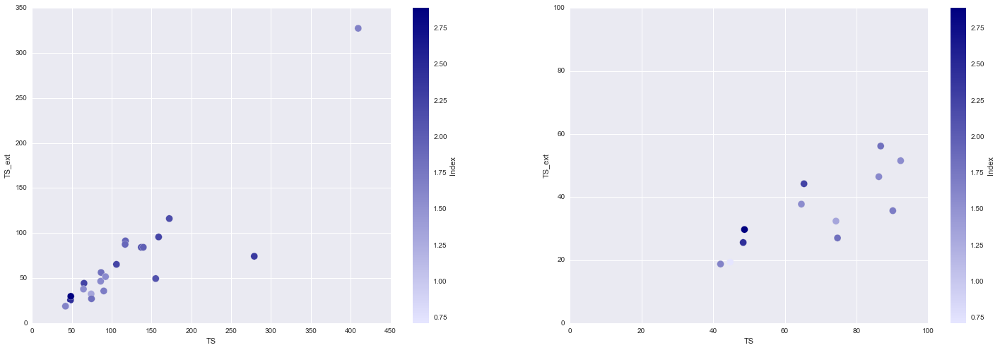

In [128]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize =(25,8))
srcDFTSgt25_ext.plot('TS','TS_ext',kind = 'scatter',s=100,ax = axes[0],c = 'Index',cmap =sns.light_palette("navy",as_cmap = True),sharex = False)
srcDFTSgt25_ext.plot('TS','TS_ext',kind = 'scatter',s=100,ax = axes[1],c = 'Index',cmap =sns.light_palette("navy",as_cmap = True),sharex = False)
plt.xlim(0,100)
plt.ylim(0,100)

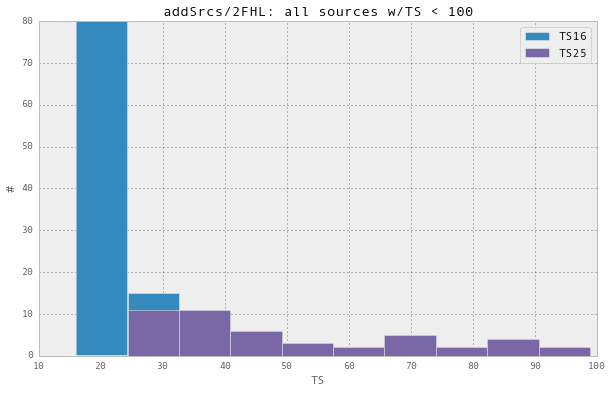

In [19]:
#I think if I want the mto have the same bins I'd have to make a new df with the TS cols and then use stacked = True?
TSdf = pd.DataFrame([srcDFTSgt16.TS,srcDFTSgt25.TS],index = ['TS16','TS25']).transpose()
# ax = srcDFTSgt16.TS[srcDFTSgt16.TS < 100].hist(label = 'TS >= 16')
# srcDFTSgt25.TS[srcDFTSgt25.TS < 100].hist(ax = ax,label = 'TS >= 25')
# plt.legend(loc = 'best')
TSdf[TSdf <100].plot(kind = 'hist',figsize = [10,6])
plt.xlabel('TS')
plt.ylabel('#')
plt.title('addSrcs/2FHL: all sources w/TS < 100')
plt.savefig('/Users/jmcohen/Desktop/TSlt100Srcs.png')

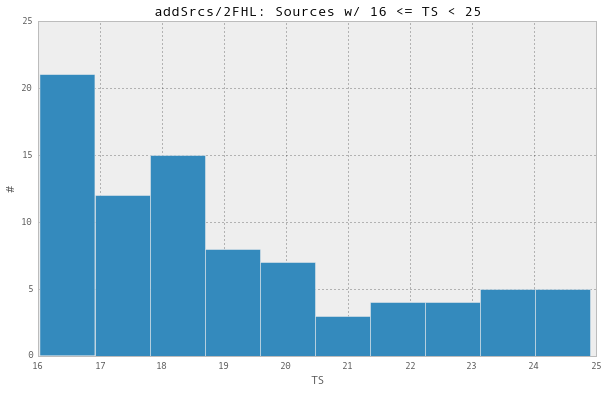

In [20]:
srcDFTSgt16.TS[srcDFTSgt16.TS < 25].hist(label = 'TS >= 16', figsize = [10,6] )
plt.xlabel('TS')
plt.ylabel('#')
plt.title('addSrcs/2FHL: Sources w/ 16 <= TS < 25')
plt.savefig('/Users/jmcohen/Desktop/TS16-25Srcs.png')


In [21]:
#srcDFTSgt25_ext.hist('Sigma')
print srcDFTSgt25_ext.columns
srcDFTSgt25_ext.TS_ext
# plt.xlabel('TS')
# plt.ylabel('#')
# plt.title('addSrcs/2FHL: all sources w/TS < 100')
# plt.savefig('/Users/jmcohen/Desktop/TSlt100Srcs.png')

# Make histograms of l,b

In [67]:
#took this from nbyMonte
def scatHist(x,y,figTitle = '', svAs = '', addSNRs = False, xlim = [180,-180], ylim = [-90,90],binwidthx = 1, binwidthy = 10):
    """Stole this from "http://matplotlib.org/examples/axes_grid/scatter_hist.html
       Only changed x,y so far
       #nicer to use gridspec probably
    """

    # the scatter plot:
    #clf()
    ncolors = plt.rcParams['axes.color_cycle'] 
    fig, axScatter = plt.subplots(figsize=(20,8))
    x[x > 180] -= 360
    axScatter.scatter(x, y,color = ncolors[0])
    #axScatter.set_aspect(1.)
    axScatter.set_xlabel('Galactic Longitude (deg)')
    axScatter.set_ylabel('Galactic Latitude (deg)')
    #axScatter.set_xlim(0,360)
    #axScatter.set_ylim(-90,90)
    axScatter.set_xlim(axScatter.get_xlim()[::-1])
    #axScatter.set_xlim(180,-180)
    #axScatter.set_ylim(-90,90)
    #axScatter.set_xlim(xlim[0],xlim[1])
    #axScatter.set_ylim(ylim[0],ylim[1])
    ticks = axScatter.get_xticks()
    ticks[ticks < 0] += 360
    axScatter.set_xticklabels([int(tick) for tick in ticks])
    if addSNRs:
        snrl=[]
        snrb=[]
        snrr=[]
        for snr in self.snrSuperData:
            snrr.append(self.snrSuperData.get(snr).get('radius'))
            snrb.append(self.snrSuperData.get(snr).get('gal')[1])
            snrl.append(self.snrSuperData.get(snr).get('gal')[0])

        circ = plt.Circle((170,0),5, fill = False, fc = 'g', lw = 3)
        axScatter.add_artist(circ)
        #plt.draw()
    # create new axes on the right and on the top of the current axes
    # The first argument of the new_vertical(new_horizontal) method is
    # the height (width) of the axes to be created in inches.
    divider = make_axes_locatable(axScatter)
    axHistx = divider.append_axes("top", 1.2, pad=0.1, sharex=axScatter)
    axHisty = divider.append_axes("right", 1.2, pad=0.1, sharey=axScatter)

    # make some labels invisible
    plt.setp(axHistx.get_xticklabels() + axHisty.get_yticklabels(),
             visible=False)

    # now determine nice limits by hand:
#     binwidthy = 5
#     binwidthx = 5
    #xymax = np.max( [np.max(np.fabs(x)), np.max(np.fabs(y))] )
    xmax = np.max(np.fabs(x))
    ymax = np.max(np.fabs(y))
    limx = ( int(xmax/binwidthx) + 1) * binwidthx
    limy = ( int(xmax/binwidthy) + 1) * binwidthy

    binsx = np.arange(-limx, limx + binwidthx, binwidthy)
    binsy = np.arange(-limy, limy + binwidthy, binwidthx)
    xnum, xbins, _ = axHistx.hist(x, bins=binsx)
    ynum, ybins, _ = axHisty.hist(y, bins=binsy, orientation='horizontal')

    # the xaxis of axHistx and yaxis of axHisty are shared with axScatter,
    # thus there is no need to manually adjust the xlim and ylim of these
    # axis.

    #axHistx.axis["bottom"].major_ticklabels.set_visible(False)
    for tl in axHistx.get_xticklabels():
        tl.set_visible(False)
    axHistx.set_yticks([0, max(xnum)/2., max(xnum)])

    #axHisty.axis["left"].major_ticklabels.set_visible(False)
    for tl in axHisty.get_yticklabels():
        tl.set_visible(False)
    axHisty.set_xticks([0, max(ynum)/2., max(ynum)])
    axHistx.set_title(figTitle)
    #set the x/ylim of the figure
    # axScatter.set_xlim(180,-180)
    # axScatter.set_ylim(-90,90)
    axScatter.set_xlim(xlim[0],xlim[1])
    axScatter.set_ylim(ylim[0],ylim[1])

    #plt.draw()
    #plt.show()
    #savefig(svAs + '_scatHist.png')
    #fig.close
    return

In [68]:
#I had this working before, what did I change that messed up glon?
l = srcDFTSgt25.l.tolist()
b = srcDFTSgt25.b.tolist()
#scatHist(x = l ,y = b,figTitle = 'addSrcs 2FHL TS > 25', svAs = 'addSrcs2FHLscatHist.png', addSNRs = False, xlim = [180,-180], ylim = [-90,90])

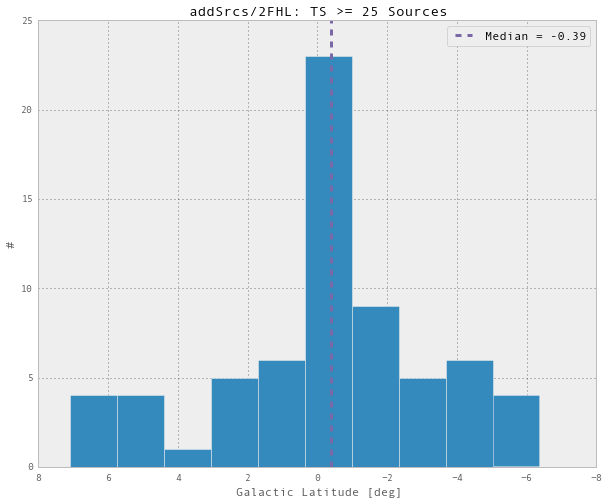

In [76]:
srcDFTSgt25.b.hist(bins = 10, figsize=[10,8])
med = np.median(srcDFTSgt25.b)
ncolors = plt.rcParams['axes.color_cycle'] 
plt.gca().invert_xaxis()
plt.axvline(med, ls ='--',lw = 3,color = ncolors[1],label = 'Median = %.2f' %med)
plt.legend(loc ='best')
plt.xlabel('Galactic Latitude [deg]')
plt.ylabel('#')
plt.title('addSrcs/2FHL: TS >= 25 Sources')
plt.savefig('/Users/jmcohen/Desktop/addSrcsTSgt25_glatHist.png')


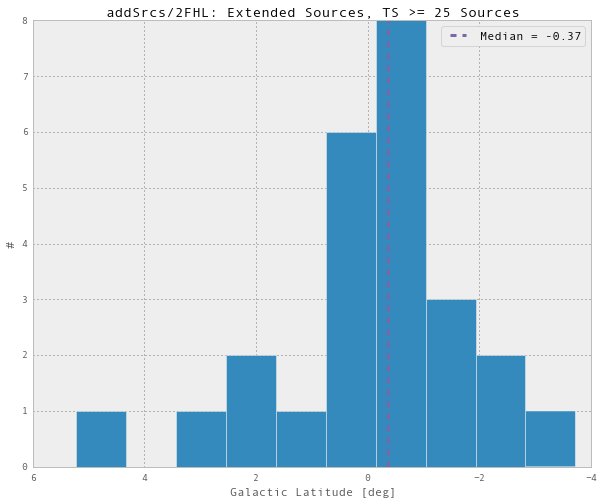

In [77]:
#just extended
srcDFTSgt25_ext.b.hist(bins = 10,figsize=[10,8])
med = np.median(srcDFTSgt25_ext.b)
ncolors = plt.rcParams['axes.color_cycle'] 
plt.gca().invert_xaxis()
plt.axvline(med, ls ='--',lw = 3,color = ncolors[1],label = 'Median = %.2f' %med)
plt.legend(loc ='best')
plt.xlabel('Galactic Latitude [deg]')
plt.ylabel('#')
plt.title('addSrcs/2FHL: Extended Sources, TS >= 25 Sources')
plt.savefig('/Users/jmcohen/Desktop/addSrcs_ES_TSgt25_glatHist.png')

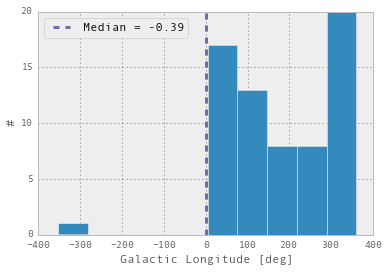

In [73]:
#same for this about being messed up, it (mostly) worked before
x = srcDFTSgt25.l.tolist()
x[x > 180] -= 360
plt.hist(x)
ax = plt.gca()
ax.set_xlim(ax.get_xlim()[::-1])
tk = ticks = ax.get_xticks()
ticks[ticks < 0] += 360
#ax.set_xlim(180,-180)
#plt.xlim(180,-180)
#srcDFTSgt25.l.hist()
med = np.median(srcDFTSgt25.b)
ncolors = plt.rcParams['axes.color_cycle'] 
plt.axvline(med, ls ='--',lw = 3,color = ncolors[1],label = 'Median = %.2f' %med)
plt.legend(loc ='best')
plt.xlabel('Galactic Longitude [deg]')
plt.ylabel('#')
plt.gca().invert_xaxis()
#ticks = np.append(np.linspace(180,0,5),np.linspace(315,180,4))
#ax.set_xticklabels(['l'+str(int(tick)) for tick in ticks])

In [222]:
# # print tk
# # print ticks
# print ax.get_xlim()[::-1]
# print ax.get_xticks()
# a = ax.get_xticks()
# a[a < 0] += 360
# print a
# print [int(i) for i in a]
# #plt.xticks( 
# int(np.append(np.linspace(180,0,5),np.linspace(315,180,4)))
#ticks
#srcDF.loc['l205_b0_PS_1']
x = srcDFTSgt25.l.tolist()
# x[x > 180] -= 360
print max(x)

359.946009981


In [27]:
checkList = ['l10_b0_PS_4','l10_b0_PS_3']
srcDFTSgt16.loc[checkList]

,DEC,DECError,RA,RAError,Sigma,SigmaError,Index,l,b,TS,TS_ext,Flux
l10_b0_PS_4,NaN,NaN,NaN,NaN,NaN,NaN,[2.27334867206],6.118278,-0.5950232,38.39715,NaN,6.127992e-11
l10_b0_PS_3,NaN,NaN,NaN,NaN,NaN,NaN,[3.06638426637],6.521739,-0.04168058,23.25005,NaN,6.13992e-11


In [34]:
###2FHL non-3FGL ES with relevant properties
#albTemp = ['l145_b0_ES_1', 'l290_b0_ES_1', 'l315_b0_ES_3', 'l30_b0_ES_2', 'l315_b0_ES_4', 'l315_b0_ES_1']
###names for freeNorm, removed W41, added new Helene SNR and source near kookaburra
#still need to add those
albTemp = ['l150_b0_ES_1', 'l290_b0_ES_1', 'l310_b0_ES_1','l315_b0_ES_3', 'l315_b0_ES_4', '']
#G150
#srcDFTSgt25.loc[albTemp]

####I should maybe tdo this above somewhere, but this just gets the last value of TS_ext if it's a list
for ind,tsext in enumerate(srcDFTSgt25.TS_ext):
    if isinstance(tsext,list):
        srcDFTSgt25.TS_ext[ind] = tsext[-1]
    else: 
        pass
    
alb2FHL = srcDFTSgt25.loc[albTemp]
alb2FHL

,DEC,DECError,RA,RAError,Sigma,SigmaError,Index,IndexError,l,b,TS,TS_ext,Flux,ModCts
l150_b0_ES_1,[55.8876401306],[0.0733778802373],[67.8215372056],[0.0510803646085],[1.2806893919],[0.0411770184397],[1.59800000753],[0.237796573507],150.3901,5.219698,86.22593,61.9691,1.311175e-10,37.50231
l290_b0_ES_1,[-61.0240006376],[0.0305352299875],[168.039754441],[0.0350322461549],[0.477865524429],[0.0241708255976],[2.24605755819],[0.336069534373],291.199,-0.4343149,65.35057,45.01037,1.252399e-10,31.52796
l315_b0_ES_3,[-62.3450766289],[0.0309077443843],[220.824328093],[0.0243930120354],[0.262595558756],[0.0226931264597],[1.83522328031],[0.320502257299],315.5132,-2.237584,74.69786,27.57742,8.045384e-11,21.18373
l315_b0_ES_4,[-60.8029089357],[0.0294189261156],[214.825871946],[0.0302256945415],[0.333159465348],[0.0245217633516],[1.71553018059],[0.233044527473],313.4463,0.2624615,90.12551,38.59358,1.758357e-10,45.36928
l310_b0_ES_1,[-64.3392142434],[0.0247574525115],[208.779774102],[0.0262143485831],[0.407137762073],[0.0210400996083],[1.32958917275],[0.279835390533],309.7599,-2.314983,74.26858,33.20062,9.853422e-11,23.69102


In [18]:
alb2FHL.to_csv('/Users/jmcohen/Desktop/2FHL_newES.csv', na_rep = 'NaN',index = True)

# Compare addSrcs/2FHL ext with 3FGL ext

In [38]:
dfES = srcDFTSgt25_ext
df3FGL = fgl3DFe #what is this supposed to be?
"""assume dfES is just extened source DF"""
#how do I find the closest extended source?
#maybe do this?
# for fgl in df3FGL.index:
#     fgll = df3FGL.loc[fgl].GLON
#     fglb = df3FGL.loc[fgl].GLAT
#     rfgl = df3FGL.loc[fgl].Model_SemiMajor #use the semi major axis as if it's radius
#     lreg =  np.round(fgll / 5.) * 5. #round to nearest 5
#     reg = 'l%s' %(int(fgll)) #then find all the start with this how to floor to +/-5 # I NEED TO KNOW THE RIGHT FORMAT FOR THIS
#     dfES = dfES.loc[reg]

#     #want to know name of nearest neighbor as well as sources that have no source within 0.2 deg
#     #so i have the right region, I have the 2FGL and addSrcs sources in that region, how to find the right source?

# #should I just try running chk sepfor the sources to see which is the closest ES? I think thay would work, then I don't need to do any of the above

#assume index of astropy is same as DF
if 'dfnearES' in locals():
    del dfnearES
#dfnearES = pd.DataFrame(columns=['3FHL_Name', 'AngSep', 'addSrcs_GLON', '3FGL_GLON', 'addSrcs_GLAT', '3FGL_GLAT','3FGL_Model_Form','addSrcs_Sigma','3FGL_Semi_Major'])
dfnearES = pd.DataFrame(columns=['3FHL_Name', 'AngSep','3FGL_Model_Form','addSrcs_Sigma','3FGL_Semi_Major'])
crdsAdd = SkyCoord(l = dfES.l ,b = dfES.b, frame = 'galactic', unit = (u.degree, u.degree))
crds3FGL = SkyCoord(l = df3FGL.GLON ,b = df3FGL.GLAT, frame = 'galactic', unit = (u.degree, u.degree))
indMin, indSep, sep = chkSep(crdsAdd, crds3FGL)
for i,j in enumerate(indSep): #i is index of crdsAdd with nearest 3FGL ES, that has index j
    srcES = dfES.iloc[i]
    src3FGL = df3FGL.iloc[j]
    #dfnearES.loc[srcES.name] = [src3FGL.name,sep[i].degree, srcES.l, src3FGL.GLON, srcES.b, src3FGL.GLAT, src3FGL.Model_Form, srcES.Sigma[0],src3FGL.Model_SemiMajor]
    dfnearES.loc[srcES.name] = [src3FGL.name,sep[i].degree, src3FGL.Model_Form, srcES.Sigma[0],src3FGL.Model_SemiMajor]


In [39]:
len(dfnearES)

22

In [42]:
#add a col for r68_addSrcs
dfnearES['addSrcs_r68'] = dfnearES.addSrcs_Sigma.apply((lambda x: dgr68.r6899(x,'Disk',r = '68')))
rat68 = dfnearES.addSrcs_r68/dfnearES['3FGL_Semi_Major']
#add colr for r68/semiMaj
dfnearES['r68/SemiMaj'] = rat68
ratSig = dfnearES.addSrcs_Sigma/dfnearES['3FGL_Semi_Major']
dfnearES['sigma/SemiMaj'] = ratSig
#when model is disk, semiMaj is sigma. For 3FGL Gaussian, compare r68
#when model is gaussian, semiMaj is r68. For 3FGL not gaussian, compare sigmas
#for r68/semiMaj, have nan for all source where model is disk ()
#for sigma/semiMaj, have nan for all source where model is gaussian ()
#first make cols, then do nan
dfnearES.loc[dfnearES['3FGL_Model_Form'] != '2D Gaussian', 'r68/SemiMaj'] = np.nan
dfnearES.loc[dfnearES['3FGL_Model_Form'] == '2D Gaussian', 'sigma/SemiMaj'] = np.nan

dfnearES.loc[albTemp].sort()

,3FHL_Name,AngSep,3FGL_Model_Form,addSrcs_Sigma,3FGL_Semi_Major,addSrcs_r68,r68/SemiMaj,sigma/SemiMaj
l150_b0_ES_1,S 147,30.574181,Map,1.280689,1.50,1.056084,NaN,0.853793
l290_b0_ES_1,HESS J1303-631,13.040912,2D Gaussian,0.477866,0.24,0.394058,1.641908,NaN
l310_b0_ES_1,HESS J1303-631,5.854166,2D Gaussian,0.407138,0.24,0.335734,1.398893,NaN
l315_b0_ES_3,MSH 15-52,4.851718,Disk,0.262596,0.25,0.216542,NaN,1.050382
l315_b0_ES_4,MSH 15-52,6.993367,Disk,0.333159,0.25,0.274730,NaN,1.332638


In [23]:
#just show the ones I sent to Alberto
#albTemp = ['l80_b0_ES_2', 'l15_b0_ES_2', 'l335_b0_ES_3', 'l145_b0_ES_1', 'l290_b0_ES_1', 'l315_b0_ES_3', 'l30_b0_ES_2', 'l315_b0_ES_4', 'l315_b0_ES_1',]
#updated list for freeNorm?
albTemp = ['l80_b0_ES_2', 'l15_b0_ES_2', 'l335_b0_ES_3', 'l145_b0_ES_1', 'l290_b0_ES_1', 'l315_b0_ES_3', 'l30_b0_ES_2', 'l315_b0_ES_4', 'l315_b0_ES_1',]
dfnearES.loc[albTemp]

,3FHL_Name,AngSep,3FGL_Model_Form,addSrcs_Sigma,3FGL_Semi_Major,addSrcs_r68,r68/SemiMaj,sigma/SemiMaj
l80_b0_ES_2,Cygnus Cocoon,0.656019,2D Gaussian,2.974641,3.00,2.452952,0.817651,NaN
l15_b0_ES_2,W30,0.255416,Disk,0.379672,0.37,0.313085,NaN,1.026139
l335_b0_ES_3,HESS J1632-478,0.038975,Disk,0.575930,0.35,0.474924,NaN,1.645515
l145_b0_ES_1,S 147,30.582515,Map,1.272487,1.50,1.049320,NaN,0.848325
l290_b0_ES_1,HESS J1303-631,13.016089,2D Gaussian,0.525155,0.24,0.433054,1.804390,NaN
l315_b0_ES_3,MSH 15-52,4.859393,Disk,0.267230,0.25,0.220363,NaN,1.068920
l30_b0_ES_2,HESS J1837-069,1.929023,Disk,0.260446,0.33,0.214769,NaN,0.789230
l315_b0_ES_4,MSH 15-52,7.008487,Disk,0.356671,0.25,0.294119,NaN,1.426686
l315_b0_ES_1,HESS J1303-631,5.883359,2D Gaussian,0.565931,0.24,0.466678,1.944493,NaN


In [24]:
#First for source that are assoc w/ 3FGL but potentially different morph
#they don't overlap at all if ang sep > 2* 3FGL sigma, no large ES
alb3FGLTmp = dfnearES.loc[(dfnearES.AngSep < 2*dfnearES['3FGL_Semi_Major']) & (dfnearES.addSrcs_Sigma < 2.99) ].sort('AngSep') #addSrcs close to inside 3FGL
#alb3FGLTmp
#next, either ang sep is big, or r68/semiMaj is big
alb3FGL_noMar = alb3FGLTmp.loc[(alb3FGLTmp.AngSep > 0.25) | ((alb3FGLTmp['r68/SemiMaj'] > 1.2) | (alb3FGLTmp['r68/SemiMaj'] < 0.8) |(alb3FGLTmp['sigma/SemiMaj'] > 1.2) | (alb3FGLTmp['sigma/SemiMaj'] < 0.8)    )] #
alb3FGL_noMar

,3FHL_Name,AngSep,3FGL_Model_Form,addSrcs_Sigma,3FGL_Semi_Major,addSrcs_r68,r68/SemiMaj,sigma/SemiMaj
l335_b0_ES_3,HESS J1632-478,0.038975,Disk,0.575930,0.35,0.474924,NaN,1.645515
l330_b0_ES_3,HESS J1616-508,0.126548,Disk,0.478697,0.32,0.394744,NaN,1.495929
l15_b0_ES_2,W30,0.255416,Disk,0.379672,0.37,0.313085,NaN,1.026139
l30_b0_ES_3,HESS J1841-055,0.273115,2D Gaussian,0.571034,0.62,0.470886,0.759494,NaN
l15_b0_ES_1,HESS J1825-137,0.428963,2D Gaussian,1.302653,0.75,1.074195,1.432260,NaN
l30_b0_ES_1,HESS J1837-069,0.469884,Disk,1.083494,0.33,0.893472,NaN,3.283314
l80_b0_ES_2,Cygnus Cocoon,0.656019,2D Gaussian,2.974641,3.00,2.452952,0.817651,NaN
l265_b0_ES_1,Vela X,0.863636,Disk,1.744355,0.91,1.438432,NaN,1.916874


In [18]:
dfPS = srcDFTSgt25_ps
df2FHL = pgw
crdsAddPS = SkyCoord(l = dfPS.l ,b = dfPS.b, frame = 'galactic', unit = (u.degree, u.degree))
#the catalog_v0 version of 2FHL has extended sources in it, I should prune these out and only compare PS with PS
df2FHL_PS = df2FHL.loc[[s for s in df2FHL.index if not s.startswith('EXT')]]
df2FHL_ES = df2FHL.loc[[s for s in df2FHL.index if  s.startswith('EXT')]]

####I think I shouldn't be comparing addSrcs PS with just the PS?
#try it both ways
#crds2FHL = SkyCoord(ra = df2FHL.RA_OBJ ,dec = df2FHL.DEC_OBJ, frame = 'icrs', unit = (u.degree, u.degree)) #for the catv5 version of 2FHL
crds2FHL = SkyCoord(l = df2FHL_PS.GLON ,b = df2FHL_PS.GLAT, frame = 'galactic', unit = (u.degree, u.degree))
if 'dfnear' in locals():
    del dfnear
dfnear = pd.DataFrame(columns=['2FHL_Name', 'AngSep', 'addSrcs_GLON', '2FHL_GLON', 'addSrcs_GLAT', '2FHL_GLAT', 'Index_addSrcs', 'Index_2FHL','TS_addSrcs','TS_2FHL'])
indMin, indSep, sep = chkSep(crdsAddPS, crds2FHL) # idk if I need indMin?
for i,j in enumerate(indSep): #i is index of crdsAdd with nearest 3FGL ES, that has index j #use indMin or indSep
    srcES = dfPS.iloc[i]
    #src2FHL = df2FHL.iloc[j]
    src2FHL = df2FHL_PS.iloc[j]
    dfnear.loc[srcES.name] = [src2FHL.name,sep[i].degree, srcES.l, crds2FHL[j].galactic.l.degree, srcES.b, crds2FHL[j].galactic.b.degree,srcES.Index[0],src2FHL.Spectral_Index,srcES.TS,src2FHL.TS]


In [27]:
###addSrcs and 2FHL PS
dfnear.sort('AngSep')
#crds2FHLgal = crds2FHL.galactic
#crds2FHLgal

,2FHL_Name,AngSep,addSrcs_GLON,2FHL_GLON,addSrcs_GLAT,2FHL_GLAT,Index_addSrcs,Index_2FHL,TS_addSrcs,TS_2FHL
l130_b0_PS_7,pgw_00236,0.001934,127.671246,127.670830,-1.169939,-1.171827,3.007650,2.48,121.438194,122.190002
l160_b0_PS_1,pgw_00078,0.002168,155.631455,155.630005,6.376243,6.374624,3.335408,2.47,37.426324,35.419998
l140_b0_PS_3,pgw_00233,0.002203,135.673022,135.675217,1.073979,1.074175,2.294034,2.27,59.831762,63.459999
l205_b0_PS_1,pgw_00061,0.002552,198.969215,198.967453,6.312803,6.310946,1.882941,1.97,140.013504,140.149994
l335_b0_PS_3,pgw_00684,0.002657,332.160505,332.161011,2.572636,2.570027,3.902433,3.27,103.898888,105.720001
l50_b0_PS_1,pgw_00600,0.003839,43.239980,43.240112,-0.164962,-0.168799,3.118311,2.88,35.685266,37.099998
l95_b0_PS_1,pgw_00239,0.004503,89.317791,89.321342,2.755648,2.758422,2.154174,2.52,68.945957,101.190002
l15_b0_PS_5,pgw_00136,0.005781,9.808495,9.814072,6.127589,6.129225,3.520995,2.90,45.620222,41.970001
l80_b0_PS_5,pgw_00635,0.005797,74.985566,74.985428,1.107682,1.113478,1.306967,1.74,33.450533,32.369999
l85_b0_PS_5,pgw_00673,0.006068,79.069619,79.065811,7.107507,7.102759,3.853018,3.98,117.511501,172.889999


In [9]:
#addSrcs PS with all 2FHL 
crds2FHL = SkyCoord(l = df2FHL.GLON ,b = df2FHL.GLAT, frame = 'galactic', unit = (u.degree, u.degree))
if 'dfnear' in locals():
    del dfnear
dfnear = pd.DataFrame(columns=['2FHL_Name', 'AngSep', 'addSrcs_GLON', '2FHL_GLON', 'addSrcs_GLAT', '2FHL_GLAT', 'Index_addSrcs', 'Index_2FHL','TS_addSrcs','TS_2FHL'])
indMin, indSep, sep = chkSep(crdsAddPS, crds2FHL) # idk if I need indMin?
for i,j in enumerate(indSep): #i is index of crdsAdd with nearest 3FGL ES, that has index j #use indMin or indSep
    srcPS = dfPS.iloc[i]
    #src2FHL = df2FHL.iloc[j]
    src2FHL = df2FHL.iloc[j]
    dfnear.loc[srcPS.name] = [src2FHL.name,sep[i].degree, srcPS.l, crds2FHL[j].galactic.l.degree, srcPS.b, crds2FHL[j].galactic.b.degree,srcPS.Index[0],src2FHL.Spectral_Index,srcPS.TS,src2FHL.TS]


NameError: name 'df2FHL' is not defined

In [29]:
#addSrcs PS with all 2FHL 
dfnear.sort('AngSep')

,2FHL_Name,AngSep,addSrcs_GLON,2FHL_GLON,addSrcs_GLAT,2FHL_GLAT,Index_addSrcs,Index_2FHL,TS_addSrcs,TS_2FHL
l130_b0_PS_7,pgw_00236,0.001934,127.671246,127.670830,-1.169939,-1.171827,3.007650,2.48,121.438194,122.190002
l160_b0_PS_1,pgw_00078,0.002168,155.631455,155.630005,6.376243,6.374624,3.335408,2.47,37.426324,35.419998
l140_b0_PS_3,pgw_00233,0.002203,135.673022,135.675217,1.073979,1.074175,2.294034,2.27,59.831762,63.459999
l205_b0_PS_1,pgw_00061,0.002552,198.969215,198.967453,6.312803,6.310946,1.882941,1.97,140.013504,140.149994
l335_b0_PS_3,pgw_00684,0.002657,332.160505,332.161011,2.572636,2.570027,3.902433,3.27,103.898888,105.720001
l50_b0_PS_1,pgw_00600,0.003839,43.239980,43.240112,-0.164962,-0.168799,3.118311,2.88,35.685266,37.099998
l95_b0_PS_1,pgw_00239,0.004503,89.317791,89.321342,2.755648,2.758422,2.154174,2.52,68.945957,101.190002
l15_b0_PS_5,pgw_00136,0.005781,9.808495,9.814072,6.127589,6.129225,3.520995,2.90,45.620222,41.970001
l80_b0_PS_5,pgw_00635,0.005797,74.985566,74.985428,1.107682,1.113478,1.306967,1.74,33.450533,32.369999
l85_b0_PS_5,pgw_00673,0.006068,79.069619,79.065811,7.107507,7.102759,3.853018,3.98,117.511501,172.889999


In [43]:
#write a reg file for 2FHL
regfilename='2FHL_catalog_v0.reg'
outdir = os.path.join('/Users/jmcohen/Desktop',regfilename)
writeReg(df2FHL,outdir)

In [405]:
#write TS gt25 to reg
regfilename='2FHL_addSrcs_TSgt25.reg'
outdir = os.path.join('/Users/jmcohen/Desktop',regfilename)
writeReg(srcDFTSgt25,outdir)

In [424]:
#save TS >16 and TS > 25 
#dfPS.dropna(axis = 1, how = 'all').to_csv('/Users/jmcohen/Desktop/addSrcs_2FHL_TSgt25_PS.csv', na_rep = 'NaN',index = True)
#dfES.to_csv('/Users/jmcohen/Desktop/addSrcs_2FHL_TSgt25_ES.csv', na_rep = 'NaN',index = True)
srcDFTSgt25.to_csv('/Users/jmcohen/Desktop/addSrcs_2FHL_TSgt25.csv', na_rep = 'NaN',index = True)
srcDFTSgt16.to_csv('/Users/jmcohen/Desktop/addSrcs_2FHL_TSgt16.csv', na_rep = 'NaN',index = True)

# Compare with Marianne

In [18]:
#Can I easily load in Marianne's results?
#mar = pd.DataFrame.from_csv('/Users/jmcohen/Dropbox/CurrentWork/2FHL/finalsrcsinroi2_2FHL_Region_New_50000_1000000.dat',sep = ' ')
dfMar = pd.DataFrame.from_csv('/Users/jmcohen/Dropbox/CurrentWork/2FHL/finalsrcsinroi2_2FHL_Region_3bands_50000.0_3500000.0.dat',sep = ' ')
#a = mar['SkyDir(266.418,-29.008)']
dfMar.set_index('srcName',inplace = True)
dfMarTSgt25 = dfMar[dfMar.TS >= 25]
dfMarTSgt25

,TS,ra,dec,specType,norm,Index,tsext
srcName,,,,,,,
PS_2FHL_Region_3bands_l0.0_b0.0_1,43.970469,266.418,-29.008,PowerLaw,9.694200e-11,2.660818,0.000000
EXTW28,60.650025,270.181,-23.691,PowerLaw,5.442365e-10,2.843014,59.490438
PS_2FHL_Region_3bands_l5.0_b0.0_3,154.942177,271.178,-21.758,PowerLaw,2.919523e-11,2.117552,98.448298
PS_2FHL_Region_3bands_l5.0_b-5.0_4,29.420679,275.208,-23.318,PowerLaw,3.274212e-13,1.749169,0.000000
P7R42714,44.213941,266.235,-17.388,PowerLaw,1.849159e-09,3.519401,0.000000
PS_2FHL_Region_3bands_l15.0_b0.0_2,46.645262,276.584,-14.839,PowerLaw,2.207284e-10,2.924291,0.000000
EXTHESSJ1825-137,166.913443,276.306,-14.243,PowerLaw,1.305431e-10,2.315544,158.209237
P7R42933,25.417650,282.310,-16.792,PowerLaw,1.221030e-10,3.078888,0.000000
EXTHESSJ1837-069,164.247422,279.105,-6.873,PowerLaw,8.707207e-11,2.241573,108.334087


In [19]:
print len(dfMarTSgt25)
print len(dfMar)
print len(dfMarTSgt25[dfMarTSgt25.tsext !=0])
print len(dfMar[dfMar.tsext !=0])

77
130
27
27


In [166]:
#do nearest neighbor for mine and Marianne's 
#just comparing TS >=25
crdsMar = SkyCoord(ra = dfMarTSgt25.ra ,dec = dfMarTSgt25.dec, frame = 'icrs', unit = (u.degree, u.degree))
crdsAdd = SkyCoord(l = srcDFTSgt25.l ,b = srcDFTSgt25.b, frame = 'galactic', unit = (u.degree, u.degree))
if 'dfnear' in locals():
    del dfnear
dfnear = pd.DataFrame(columns=['mar_Name', 'AngSep', 'addSrcs_GLON', 'mar_GLON', 'mar_GLAT', 'mar_GLAT', 'Index_addSrcs', 'Index_mar','TS_addSrcs','TS_mar','TSext_addSrcs','TSext_mar'])
indMin, indSep, sep = chkSep(crdsAdd, crdsMar) # idk if I need indMin?
for i,j in enumerate(indSep): #i is index of crdsAdd with nearest 3FGL ES, that has index j #use indMin or indSep
    srcAdd = srcDFTSgt25.iloc[i]
    srcMar = dfMarTSgt25.iloc[j]
    if isinstance(srcAdd.TS_ext,list):
        tsextAdd = srcAdd.TS_ext[0]
    else:
        tsextAdd = srcAdd.TS_ext
    dfnear.loc[srcAdd.name] = [srcMar.name,sep[i].degree, srcAdd.l, crdsMar[j].galactic.l.degree, srcAdd.b, crdsMar[j].galactic.b.degree,srcAdd.Index,srcMar.Index,srcAdd.TS,srcMar.TS,tsextAdd,srcMar.tsext]


In [218]:
####THESE ARE THE 3 3FGL SOURCES SENT TO ALBERTO
#don't just show all addSrcs mar nn
#show the ones I sent templates to albeerto 
albMar3FGL = dfnear[(dfnear.AngSep < 0.35)  | (dfnear.AngSep > 0.7)].loc[alb3FGL_noMar.index].dropna()
albMar3FGL
#dfnear.loc[(alb3FGL_noMar.index)][].sort('AngSep') #the > 0.7 is just to show cynus

,mar_Name,AngSep,addSrcs_GLON,mar_GLON,mar_GLAT,mar_GLAT,Index_addSrcs,Index_mar,TS_addSrcs,TS_mar,TSext_addSrcs,TSext_mar
l335_b0_ES_3,EXTHESSJ1632-478,0.016008,336.535087,336.551087,0.155932,0.156404,[1.97389453957],1.950551,182.984138,142.652575,183.138268,137.777824
l15_b0_ES_2,PS_2FHL_Region_3bands_l5.0_b0.0_3,0.005378,8.376562,8.371432,-0.093978,-0.095592,[2.12183228868],2.117552,168.340075,154.942177,106.694731,98.448298
l30_b0_ES_3,EXTHESSJ1841-055,0.264624,27.059735,26.818062,-0.284441,-0.176641,[1.82740421806],1.842138,84.612532,98.906844,54.014302,95.711304
l15_b0_ES_1,EXTHESSJ1825-137,0.345234,17.634636,17.301247,-0.876798,-0.787006,[2.16003388806],2.315544,239.080879,166.913443,270.615625,158.209237
l80_b0_ES_2,PS2_2FHL_Region_3bands_l75.0_b0.0_3,0.890837,79.237934,78.348055,1.947159,1.896208,[2.34675042546],1.924031,121.226703,100.714296,199.686890,96.275919


In [217]:
#Next get the non-3FGL sources
#so similar criteria, but no alb3FGL_noMar, and also both extended
#angSep < 0.25 (not > 0.7 tha was just to show cocoon, not 3FGLext, is extended)
dfnear[(dfnear.AngSep < 0.35) & (~dfnear.mar_Name.str.contains('EXT')) & (~np.isnan(dfnear.TSext_addSrcs))].sort('AngSep')

,mar_Name,AngSep,addSrcs_GLON,mar_GLON,mar_GLAT,mar_GLAT,Index_addSrcs,Index_mar,TS_addSrcs,TS_mar,TSext_addSrcs,TSext_mar
l15_b0_ES_2,PS_2FHL_Region_3bands_l5.0_b0.0_3,0.005378,8.376562,8.371432,-0.093978,-0.095592,[2.12183228868],2.117552,168.340075,154.942177,106.694731,98.448298
l315_b0_ES_3,PS_2FHL_Region_3bands_l315.0_b0.0_2,0.012502,315.506020,315.514790,-2.240623,-2.231705,[1.86106849358],1.826762,84.900007,72.644079,29.889157,26.979980
l315_b0_ES_4,PS_2FHL_Region_3bands_l315.0_b0.0_1,0.012552,313.431448,313.443967,0.265121,0.264202,[1.75548274546],1.698815,112.152254,80.183350,51.064657,33.650406
l30_b0_ES_2,PS_2FHL_Region_3bands_l25.0_b0.0_2,0.021895,23.217811,23.231933,-0.373409,-0.390141,[2.46097796703],2.438163,69.273789,53.997992,37.296845,28.847889
l315_b0_ES_1,PS_2FHL_Region_3bands_l310.0_b0.0_4,0.170156,309.728938,309.758483,-2.483057,-2.315480,[1.31219163337],1.321842,81.222414,72.856173,31.798020,31.528342
l290_b0_ES_1,PS_2FHL_Region_3bands_l295.0_b0.0_1,0.184402,291.223651,291.406415,-0.387097,-0.411653,[2.30396103659],2.247439,102.127192,66.206857,64.815324,64.812481
l145_b0_ES_1,PS_2FHL_Region_3bands_l150.0_b5.0_10,0.307067,150.381840,150.450543,5.221292,4.921948,[1.56834489331],1.667914,83.364043,90.752842,65.097454,87.035516


In [199]:
dfnear.loc['l145_b0_ES_1']

mar_Name         PS_2FHL_Region_3bands_l150.0_b5.0_10
AngSep                                      0.3070666
addSrcs_GLON                                 150.3818
mar_GLON                                     150.4505
mar_GLAT                                     5.221292
mar_GLAT                                     4.921948
Index_addSrcs                         [1.56834489331]
Index_mar                                    1.667914
TS_addSrcs                                   83.36404
TS_mar                                       90.75284
TSext_addSrcs                                65.09745
TSext_mar                                    87.03552
Name: l145_b0_ES_1, dtype: object

In [34]:
#find places where the nearest neighbor of a PS is an ES and vice versa
#I want TSext_add = Nan and TSext_Mar not 0, or  TSext_add = notNan and TSext_Mar = 0 
#nnMax = np.max(noNNTS[(noNNTS.AngSep <=0.3) & (np.abs(noNNTS.TSdiff) <= 10)].TSdiff)
psAdd_esMar = dfnear[(np.isnan(dfnear.TSext_addSrcs)) & (dfnear.TSext_mar != 0)]
esAdd_psMar = dfnear[(~np.isnan(dfnear.TSext_addSrcs)) & (dfnear.TSext_mar == 0)]


In [35]:
esAdd_psMar.sort('AngSep')

,mar_Name,AngSep,addSrcs_GLON,mar_GLON,mar_GLAT,mar_GLAT,Index_addSrcs,Index_mar,TS_addSrcs,TS_mar,TSext_addSrcs,TSext_mar
l290_b0_ES_2,PS_2FHL_Region_3bands_l280.0_b0.0_1,1.590680,285.677160,284.086870,-0.495592,-0.533585,[2.23411944432],1.242305,340.223063,44.131686,361.562981,0
l325_b0_ES_3,PS_2FHL_Region_3bands_l325.0_b0.0_1,2.556480,323.768837,326.249618,-1.089090,-1.709614,[0.845047207666],3.637622,51.857008,63.877435,51.840705,0
l55_b0_ES_1,PS_2FHL_Region_3bands_l55.0_b0.0_1,3.507701,60.631206,57.787143,0.720920,-1.332460,[2.42197256194],2.483516,41.174214,29.206449,41.178832,0
l280_b0_ES_1,PS_2FHL_Region_3bands_l280.0_b0.0_1,6.089783,278.376013,284.086870,1.582549,-0.533585,[1.60216389145],1.242305,47.659304,44.131686,47.668440,0


In [36]:
psAdd_esMar.sort('AngSep')

,mar_Name,AngSep,addSrcs_GLON,mar_GLON,mar_GLAT,mar_GLAT,Index_addSrcs,Index_mar,TS_addSrcs,TS_mar,TSext_addSrcs,TSext_mar
l10_b0_PS_4,EXTW28,0.365744,6.118278,6.236347,-0.595023,-0.248859,[2.27334867206],2.843014,38.397151,60.650025,NaN,59.490438
l15_b0_PS_2,EXTHESSJ1825-137,0.376787,17.676191,17.301247,-0.824605,-0.787006,[1.46588539887],2.315544,28.516091,166.913443,NaN,158.209237
l305_b0_PS_3,EXTHESSJ1303-631,0.448816,304.178097,304.403931,-0.202026,-0.589889,[1.74838132052],2.010671,46.703644,46.555491,NaN,45.297697
l305_b0_PS_5,EXTHESSJ1303-631,1.340035,305.282676,304.403931,0.421804,-0.589889,[1.56222350445],2.010671,25.363251,46.555491,NaN,45.297697
l305_b0_PS_2,EXTHESSJ1303-631,5.815455,298.593190,304.403931,-0.350864,-0.589889,[1.21671319467],2.010671,28.788361,46.555491,NaN,45.297697


In [38]:
# addSrcs source that don't have a Mar source within 0.5 deg
addWnoAssoc = dfnear[~(dfnear.AngSep <=0.5)]
#esAdd_psMar = dfnear[(~np.isnan(dfnear.TSext_addSrcs)) & (dfnear.TSext_mar == 0)]
addWnoAssoc.sort('AngSep')

,mar_Name,AngSep,addSrcs_GLON,mar_GLON,mar_GLAT,mar_GLAT,Index_addSrcs,Index_mar,TS_addSrcs,TS_mar,TSext_addSrcs,TSext_mar
l350_b0_ES_1,EXTRXJ1713.7-3946,0.542230,346.852408,347.365802,-0.690810,-0.516254,[2.55480299742],1.960127,70.265152,124.046927,124.174237,122.001256
l335_b0_ES_2,P7R42537H,0.555183,339.371980,339.686216,-0.948165,-1.405904,[2.76739342932],1.687534,65.918689,47.613101,63.930572,21.483227
l265_b0_ES_1,EXTVelaX,0.619174,263.937366,263.560374,-3.723201,-3.231493,[1.61038937162],2.994692,122.446676,75.684642,120.342473,64.131187
l80_b0_ES_2,PS2_2FHL_Region_3bands_l75.0_b0.0_3,0.890837,79.237934,78.348055,1.947159,1.896208,[2.34675042546],1.924031,121.226703,100.714296,199.686890,96.275919
l315_b0_ES_5,PS_2FHL_Region_3bands_l315.0_b0.0_1,1.246184,312.210165,313.443967,0.088923,0.264202,[2.6564074413],1.698815,88.386288,80.183350,88.265028,33.650406
l305_b0_PS_5,EXTHESSJ1303-631,1.340035,305.282676,304.403931,0.421804,-0.589889,[1.56222350445],2.010671,25.363251,46.555491,NaN,45.297697
l290_b0_ES_2,PS_2FHL_Region_3bands_l280.0_b0.0_1,1.590680,285.677160,284.086870,-0.495592,-0.533585,[2.23411944432],1.242305,340.223063,44.131686,361.562981,0.000000
l325_b0_ES_3,PS_2FHL_Region_3bands_l325.0_b0.0_1,2.556480,323.768837,326.249618,-1.089090,-1.709614,[0.845047207666],3.637622,51.857008,63.877435,51.840705,0.000000
l55_b0_ES_1,PS_2FHL_Region_3bands_l55.0_b0.0_1,3.507701,60.631206,57.787143,0.720920,-1.332460,[2.42197256194],2.483516,41.174214,29.206449,41.178832,0.000000
l305_b0_PS_2,EXTHESSJ1303-631,5.815455,298.593190,304.403931,-0.350864,-0.589889,[1.21671319467],2.010671,28.788361,46.555491,NaN,45.297697


# I think around here is where I started playing with comparing sources in all RoI with their nearest neighbors?

In [11]:
#galPlaneDir = "/Users/jmcohen/Desktop/2FHLRuns/galPlane_lowNorm/"
#galPlaneDir = "/Users/jmcohen/Desktop/2FHLRuns/galPlane_lowNorm_5degAdd/"
galPlaneDir = "/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree/"
os.chdir(galPlaneDir)
wfinyaml = set(regResDictsFin.keys())
wresyaml = set(regResDictsAll.keys())
allRegions = set([i for i in os.listdir('./') if  i.startswith('Reg')])
notFinRegions =  list(allRegions.difference(wfinyaml))
regResDictNotFin = {i:regResDictsAll.get(i) for i in regResDictsAll.keys() if i in notFinRegions}


#allRegions.difference(wresyaml)
#####Region_l185.0_b0.0 has no reults yamlfor galPlane_lowNorm, 
#####None missing for galPlane_lowNorm_5deg
####following have no final yaml for galPlane_lowNorm
#[Region_l185.0_b0.0','Region_l310.0_b0.0','Region_l330.0_b0.0','Region_l340.0_b0.0','Region_l345.0_b0.0']
#####and these for 5deg
#['Region_l100.0_b0.0','Region_l135.0_b0.0','Region_l170.0_b0.0','Region_l180.0_b0.0', 'Region_l185.0_b0.0', 'Region_l200.0_b0.0', 'Region_l215.0_b0.0', 'Region_l255.0_b0.0', 'Region_l275.0_b0.0', 'Region_l285.0_b0.0', 'Region_l70.0_b0.0', 'Region_l95.0_b0.0'}

In [12]:
regResDictNotFin

{'Region_l0.0_b0.0': '/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree/Region_l0.0_b0.0/50gevTo3500gev/addSrcs/results_.yaml'}

In [7]:
#want just the last element of each key
if 'resPanNo' in locals():
    del resPanNo
if os.path.exists('./galPlane2FHLResPanelNoFin.dat'):
    print 'addSrcs panel already exists, load pickled file'
    resPanNo = pd.io.pickle.read_pickle('./galPlane2FHLResPanelNoFin.dat')
else:
    for reg, yam in regResDictNotFin.items():
        resYaml = yaml.load(open(yam))
        PSind = 1
        ESind = 1
        glon,glat = os.path.basename(reg).strip('Region_l').replace('b','').split('_')
        regStr = 'l%s_b%s_' %(str(int(float(glon))), str(int(float(glat))))
        for i,j in resYaml.items():
            if isinstance(j,list):
                idx = ['it'+str(x) for x,_ in enumerate(j)]
                resYaml[i] = pd.Series(j,name = i,index = idx)
            if isinstance(j,dict):
                for k in j:
                    if isinstance(j.get(k),list):
                        resYaml[i][k] = j.get(k)[-1]
            if i.startswith('ES') and j.has_key('Sigma'):#resYaml.get(k).has_key('Sigma'):
                resYaml[regStr+'ES_'+str(ESind)] = resYaml.pop(i)
                ESind = ESind + 1
            elif i.startswith('ES') and not j.has_key('Sigma'):
                resYaml[regStr+'PS_'+str(PSind)] = resYaml.pop(i)
                PSind = PSind + 1
        df = pd.DataFrame(resYaml)
        #for the first source, I make a new panel, for every other, I concat the previous panel with the new
        #I need a name for the pane
        #print df
        if not 'resPanNo' in locals():
            resPanNo = pd.Panel.from_dict({reg: df})
        else:
            resPanNo = pd.concat([resPanNo,pd.Panel.from_dict({reg: df})]) #does this mean concat the resPan in memoery with the file? #if I want to save the panel so I don't have to re make it everything time 

    #print resPanNo
    resPanNo.to_pickle('./galPlane2FHLResPanelNoFin.dat') #save the panel in case I want to use it again.

    
#####add this above
#loop up here too
# PSind = 1
# ESind = 1
# reg,yam = regResDictsFin.items()[18]
# l,b = os.path.basename(reg).strip('Region_l').replace('b','').split('_')
# regStr = 'l%s_b%s_' %(str(int(float(l))), str(int(float(b))))
# resYaml = yaml.load(open(yam))
# for i,j in resYaml.items():
#     if i.startswith('ES') and j.has_key('Sigma'):#resYaml.get(k).has_key('Sigma'):
#         resYaml[regStr+'ES_'+str(PSind)] = resYaml.pop(i)
#         ESind = ESind + 1
#     elif i.startswith('ES') and not j.has_key('Sigma'):
#         resYaml[regStr+'PS_'+str(PSind)] = resYaml.pop(i)
#         PSind = PSind + 1
# print resYaml.get('l5_b0_ES_1')

addSrcs panel already exists, load pickled file


In [100]:
# for i,j in resYaml.items():
#     if isinstance(j,dict):
#         for k in j:
#             print j
#             #if isinstance(j.get(k),list):
#                  #print resYaml[i][j]#print j.get(k)[-1]

In [8]:
dropList = [s for s in resPanNo.minor_axis if not s.startswith('l')]
keepList = [s for s in resPanNo.minor_axis if s.startswith('l')]
paramList = ['DEC','DECError','RA','RAError','Sigma','SigmaError','Index','l','b','TS','TS_ext','Flux'] #I don't need index if I have l,b
if 'srcPanNo' in locals(): del srcPanNo
srcPanNo = resPanNo.ix[:, paramList,keepList]#.ix[:,:-3,:] #this only works be cause I know the order of the sources and because they're consecutive 

if 'srcDFNo' in locals(): del srcDFNo
for f in srcPanNo.items:
    if not 'srcDFNo' in locals():
        srcDFNo = srcPanNo[f].transpose().dropna(how = 'all')
    else:
        srcDFNo = pd.concat([srcDFNo,srcPanNo[f].transpose().dropna(how = 'all')])

In [16]:
if 'srcDFNoTSgt16'in locals(): del srcDFNoTSgt16
if 'srcDFwNoFin'in locals(): del srcDFwNoFin
srcDFNoTSgt16 = srcDFNo[srcDFNo.TS >= 16]
srcDFwNoFin = pd.concat([srcDF,srcDFNoTSgt16])
srcDFwNoFin = pd.DataFrame(srcDFwNoFin, index=sorted(srcDFwNoFin.index, key=natural_keys)) #I like having sources sorted
#### i need to not manually put in the two sourceS!
#srcDFwNoFin
    

In [17]:
#check that all the sources have their o
uni = []
for i in srcDFwNoFin.index:
    if i in uni:
        print i
    else:
        uni.append(i)

In [18]:
maxl = len(srcDFwNoFin.index)
print maxl
pd.set_option('display.max_columns', maxl)
pd.set_option('display.max_rows', maxl) #I will transpose the frame later

387


In [59]:
srcDFwNoFin
#for lowNorm_5degAdd: no sources in Regionl70 Regionl95 Regionl100 Regionl170 Regionl200 Regionl215 Regionl255 Regionl275
#for lowNorm_10degAdd: no sources in Regionl185 Regionl275 

,DEC,DECError,RA,RAError,Sigma,SigmaError,Index,l,b,TS,TS_ext,Flux
l0_b0_PS_1,NaN,NaN,NaN,NaN,NaN,NaN,[4.28106916096],353.5754,-0.5698175,17.42413,NaN,3.590053e-11
l0_b0_PS_2,NaN,NaN,NaN,NaN,NaN,NaN,[1.35614753276],358.5475,-0.7816891,24.96577,NaN,5.104131e-11
l0_b0_PS_3,NaN,NaN,NaN,NaN,NaN,NaN,[2.63466262664],359.946,-0.04748144,49.86344,NaN,9.436324e-11
l0_b0_PS_4,NaN,NaN,NaN,NaN,NaN,NaN,[2.98544839863],6.520697,-0.04187821,23.30958,NaN,6.094307e-11
l0_b0_PS_5,NaN,NaN,NaN,NaN,NaN,NaN,[2.26953438695],6.118358,-0.5950069,38.3842,NaN,6.118942e-11
l5_b0_ES_1,[-21.7538011537],[0.0312191658787],[271.17920838],[0.0233019926975],[0.37792651351],[0.022236942927],[2.12122009547],8.376084,-0.09475596,168.2198,"[105.417504951, 106.682096583]",3.362497e-10
l5_b0_PS_1,NaN,NaN,NaN,NaN,NaN,NaN,[3.06832118365],6.52142,-0.04176337,23.27537,NaN,6.137243e-11
l5_b0_PS_2,NaN,NaN,NaN,NaN,NaN,NaN,[2.27346368756],6.118263,-0.5950242,38.39671,NaN,6.124567e-11
l5_b0_PS_3,NaN,NaN,NaN,NaN,NaN,NaN,[1.35519986047],358.5475,-0.7818262,25.00727,NaN,5.105399e-11
l5_b0_PS_4,NaN,NaN,NaN,NaN,NaN,NaN,[1.76485292672],8.783851,-4.11042,30.13093,NaN,2.289773e-11


In [21]:
####now that i have all RoI for reals
srcDFwNoFin.loc['l330_b0_ES_2']

DEC             -51.93582
DECError       0.03420187
Flux          2.74335e-10
Index            2.295781
ModCts                NaN
RA               243.6141
RAError        0.02667889
Sigma           0.4371967
SigmaError     0.02607138
TS               133.1166
TS_ext           84.88903
b              -0.6799271
l                331.4554
Name: l330_b0_ES_2, dtype: object

In [26]:
#plot TS of nearest neighbor, make table with sep as well?
#only plot the TS if the sep is within 0.2 deg
#i also want to know l to see which is the most central source
#I should only compare PS/PS, ES/ES
# del srcDFPS
# del dfOverlapPS
srcDFPS = srcDFwNoFin[srcDFwNoFin.Sigma.isnull()] #ts > 16 PS
crdsAllSrcsPS = SkyCoord(l = srcDFPS.l ,b = srcDFPS.b, frame = 'galactic', unit = (u.degree, u.degree))
dfOverlapPS = pd.DataFrame(columns=['NearestNeighbor', 'AngSep', 'Primary_l', 'NN_b', 'Primary_b', 'NN_b','Primary_TS','NN_TS'])#,'Primary_Sigma','NN_Sigma']) #include sigma just to make it easy to cut out ES
indMin, indSep, sep = chkSep(crdsAllSrcsPS,crdsAllSrcsPS,n = 2)
for i,j in enumerate(indSep):
    srci = srcDFPS.iloc[i]
    srcj = srcDFPS.iloc[j]
#     if isinstance(srci.Sigma,list) or isinstance(srci.Sigma,np.ndarray):
#         sigi = srci.Sigma[0]
#     else:
#         sigi = srci.Sigma
#     if isinstance(srcj.Sigma,list) or isinstance(srcj.Sigma,np.ndarray):
#         sigj = srcj.Sigma[0]
#     else:
#         sigj = srcj.Sigma
    dfOverlapPS.loc[srci.name] = [srcj.name,sep[i].degree, srci.l, srcj.l, srci.b, srcj.b,srci.TS,srcj.TS]#,sigi,sigj]


In [27]:
#same as above but for ES

#plot TS of nearest neighbor, make table with sep as well?
#only plot the TS if the sep is within 0.2 deg
#i also want to know l to see which is the most central source
#I should only compare PS/PS, ES/ES
# del srcDFES
# del dfOverlapES
srcDFES = srcDFwNoFin[~srcDFwNoFin.Sigma.isnull()] #ts > 16 ES
crdsAllSrcsES = SkyCoord(l = srcDFES.l ,b = srcDFES.b, frame = 'galactic', unit = (u.degree, u.degree))
dfOverlapES = pd.DataFrame(columns=['NearestNeighbor', 'AngSep', 'Primary_l', 'NN_b', 'Primary_b', 'NN_b','Primary_TS','NN_TS','Primary_TSext','NN_TSext','Primary_Sigma','NN_Sigma'])#,'Primary_Sigma','NN_Sigma']) #include sigma just to make it easy to cut out ES
indMin, indSep, sep = chkSep(crdsAllSrcsES,crdsAllSrcsES,n = 2)
for i,j in enumerate(indSep):
    srci = srcDFES.iloc[i]
    srcj = srcDFES.iloc[j]
#     if isinstance(srci.Sigma,list) or isinstance(srci.Sigma,np.ndarray):
#         sigi = srci.Sigma[0]
#     else:
#         sigi = srci.Sigma
#     if isinstance(srcj.Sigma,list) or isinstance(srcj.Sigma,np.ndarray):
#         sigj = srcj.Sigma[0]
#     else:
#         sigj = srcj.Sigma
    sigmai = srci.Sigma
    sigmaj = srcj.Sigma
    tsexti = srci.TS_ext
    tsextj = srcj.TS_ext
    if isinstance(sigmai,list):sigmai = sigmai[0]
    if isinstance(sigmaj,list):sigmaj = sigmaj[0]
    if isinstance(tsexti,list):tsexti = tsexti[0]
    if isinstance(tsextj,list):tsextj = tsextj[0]
    dfOverlapES.loc[srci.name] = [srcj.name,sep[i].degree, srci.l, srcj.l, srci.b, srcj.b,srci.TS,srcj.TS,tsexti,tsextj,sigmai,sigmaj]


In [29]:
srcDFES

,DEC,DECError,RA,RAError,Sigma,SigmaError,Index,l,b,TS,TS_ext,Flux
l5_b0_ES_1,[-21.7538011537],[0.0312191658787],[271.17920838],[0.0233019926975],[0.37792651351],[0.022236942927],[2.12122009547],8.376084,-0.09475596,168.2198,"[105.417504951, 106.682096583]",3.362497e-10
l10_b0_ES_1,[-21.7527481105],[0.0299963275941],[271.180484255],[0.0224089343051],[0.379164037654],[0.022434071672],[2.12256457272],8.377582,-0.09527249,168.2977,"[104.479337471, 106.739474999]",3.360966e-10
l15_b0_ES_1,[-13.9903244063],[0.045126136268],[276.54783032],[0.0404629999688],[1.30265262259],[0.0187476700304],[2.16003388806],17.63464,-0.8767976,239.0809,"[270.615625063, 270.706847935, 297.973589835]",8.56071e-10
l15_b0_ES_2,[-21.7530026477],[0.0274689929101],[271.178730899],[0.0245911828727],[0.379671610048],[0.0211992971153],[2.12183228868],8.376562,-0.09397795,168.3401,"[106.694730505, 106.738324935]",3.377998e-10
l20_b0_ES_1,[-5.49344628523],[0.0549766314593],[280.281887404],[0.0258352551668],[0.587185246199],[0.0257665404945],[1.81672569729],26.86986,-0.2186195,89.2515,"[53.7640365929, 54.1569454561]",3.0587e-10
l20_b0_ES_2,[-6.49631167289],[0.0305785741229],[279.405109389],[0.0369264921426],[1.05826130251],[0.0295823009652],[2.37704404584],25.57885,0.09663501,159.208,"[271.89106484, 263.11159188, 1109.95231048, 18...",7.149189e-10
l20_b0_ES_3,[-8.80921203093],[0.0213304779969],[278.737110218],[0.0246041401671],[0.255231084805],[0.0191090172056],[2.45148969096],23.22052,-0.3788535,69.29819,"[32.7417964154, 32.7472526613, 32.7445516177]",1.788889e-10
l20_b0_ES_4,[-13.9882372885],[0.0430335853366],[276.549081254],[0.0407233203498],[1.30183294908],[0.0190239966987],[2.15978774458],17.63705,-0.8768986,239.0549,"[270.315155302, 270.717036093, 270.731187936, ...",8.55127e-10
l25_b0_ES_1,[-6.49431600562],[0.0296285372466],[279.433370219],[0.0427760631957],[1.0830043934],[0.0285939801209],[2.26302984418],25.59351,0.07260587,271.7401,"[271.925482935, 1313.36161237, 336.448408488]",9.405937e-10
l25_b0_ES_2,[-8.8067087709],[0.0207493339742],[278.743418103],[0.0236304996321],[0.251128789634],[0.0188453469899],[2.40372595013],23.22561,-0.3832345,69.2993,"[37.0681977944, 37.0944728008]",1.771732e-10


In [62]:
#addd column for which is closer to
#get rid of ES for now
#dfOverlapPS
dfOverlapPS

,NearestNeighbor,AngSep,Primary_l,NN_b,Primary_b,NN_b,Primary_TS,NN_TS
l0_b0_PS_1,l355_b0_PS_4,3.632585,353.575425,351.217872,-0.569817,-3.334804,17.424133,19.627929
l0_b0_PS_2,l5_b0_PS_3,0.000138,358.547474,358.547486,-0.781689,-0.781826,24.965771,25.007274
l0_b0_PS_3,l355_b0_PS_3,0.000035,359.946029,359.946010,-0.047481,-0.047452,49.863440,49.879229
l0_b0_PS_4,l5_b0_PS_1,0.000732,6.520697,6.521420,-0.041878,-0.041763,23.309579,23.275366
l0_b0_PS_5,l10_b0_PS_4,0.000082,6.118358,6.118278,-0.595007,-0.595023,38.384199,38.397151
l5_b0_PS_1,l10_b0_PS_3,0.000330,6.521420,6.521739,-0.041763,-0.041681,23.275366,23.250051
l5_b0_PS_2,l10_b0_PS_4,0.000015,6.118263,6.118278,-0.595024,-0.595023,38.396712,38.397151
l5_b0_PS_3,l0_b0_PS_2,0.000138,358.547486,358.547474,-0.781826,-0.781689,25.007274,24.965771
l5_b0_PS_4,l10_b0_PS_6,0.000265,8.783851,8.784106,-4.110420,-4.110344,30.130925,30.133817
l5_b0_PS_5,l15_b0_PS_5,0.000091,9.808413,9.808495,6.127630,6.127589,45.620147,45.620222


In [43]:
# one plot is Primary TS vs NN_TS. Only for sources with a source withing 0.2 deg?
#try not to double plot TS vs TS for NN and prim
#only plot values in prim that are also in nn once, also plot cols that have a 
#355 and 340 are NN, plt 355,340 but not 340,355
#nn = dfOverlapPS.NearestNeighbor
# blist = []
# for i in dfOverlapPS.index:
#     if not i in blist:
#         blist.append(i)
#     if not dfOverlapPS.loc(i).NearestNeighbor:
#         blist.append(dfOverlapPS.loc(i).NearestNeighbor)
#sometimes a srcs nearest neighbor isn't the nn's nn
#need to keep track of pairs
#it's the pair that's important. if pair is reversed don't use it
keepDrop = {}
if 'noNNTS' in locals(): del noNNTS
for ind,src in enumerate(dfOverlapPS.index):
    if ind == 0:
        srci = dfOverlapPS.loc[src]
        srcnn = srci.NearestNeighbor
        noNNTS = dfOverlapPS.drop(srcnn)
        keepDrop[src] = srcnn
        #print src,'dropped', srcnn
    else:
        if not src in keepDrop.values(): #first check that it hasn't been dropped   then check that it's pair hasn't been used
            srci = noNNTS.loc[src]
            srcnn = srci.NearestNeighbor
            if not srcnn in keepDrop.keys() and not srcnn in keepDrop.values() : # if srcnn is in values it has been dropped, if it's in keys it's been done
                noNNTS.drop(srcnn,inplace = True)
                keepDrop[src] = srcnn
                #print src,'dropped', srcnn
            #else:print src, ind,'b'


#dfOverlapPS.iloc[nn]
#dfOverlapPS[dfOverlapPS.AngSep <=0.3].plot(x = 'Primary_TS',y = 'NN_TS',kind = 'scatter',figsize = [8,8])
# x = [0,350]
# y = [0,350]
# plt.plot(x, y, '-')
# plt.xlim(0,350)
# plt.ylim(0,350)


#is this all right???

In [44]:
#same but for ES

# one plot is Primary TS vs NN_TS. Only for sources with a source withing 0.2 deg?
#try not to double plot TS vs TS for NN and prim
#only plot values in prim that are also in nn once, also plot cols that have a 
#355 and 340 are NN, plt 355,340 but not 340,355
#nn = dfOverlapPS.NearestNeighbor
# blist = []
# for i in dfOverlapPS.index:
#     if not i in blist:
#         blist.append(i)
#     if not dfOverlapPS.loc(i).NearestNeighbor:
#         blist.append(dfOverlapPS.loc(i).NearestNeighbor)
#sometimes a srcs nearest neighbor isn't the nn's nn
#need to keep track of pairs
#it's the pair that's important. if pair is reversed don't use it
keepDrop = {}
if 'noNNTS_ES' in locals(): del noNNTS_ES
for ind,src in enumerate(dfOverlapES.index):
    if ind == 0:
        srci = dfOverlapES.loc[src]
        srcnn = srci.NearestNeighbor
        noNNTS_ES = dfOverlapES.drop(srcnn)
        keepDrop[src] = srcnn
        #print src,'dropped', srcnn
    else:
        if not src in keepDrop.values(): #first check that it hasn't been dropped   then check that it's pair hasn't been used
            srci = noNNTS_ES.loc[src]
            srcnn = srci.NearestNeighbor
            if not srcnn in keepDrop.keys() and not srcnn in keepDrop.values() : # if srcnn is in values it has been dropped, if it's in keys it's been done
                noNNTS_ES.drop(srcnn,inplace = True)
                keepDrop[src] = srcnn
                #print src,'dropped', srcnn
            #else:print src, ind,'b'


#dfOverlapPS.iloc[nn]
#dfOverlapPS[dfOverlapPS.AngSep <=0.3].plot(x = 'Primary_TS',y = 'NN_TS',kind = 'scatter',figsize = [8,8])
# x = [0,350]
# y = [0,350]
# plt.plot(x, y, '-')
# plt.xlim(0,350)
# plt.ylim(0,350)


#is this all right???

In [45]:
noNNTS['TSdiff'] = noNNTS.Primary_TS-noNNTS.NN_TS
noNNTS['|TSdiff|'] = np.abs(noNNTS.TSdiff)

In [66]:
noNNTS.sort('|TSdiff|')

,NearestNeighbor,AngSep,Primary_l,NN_b,Primary_b,NN_b,Primary_TS,NN_TS,TSdiff,|TSdiff|
l145_b0_PS_1,l150_b0_PS_1,0.000138,143.340895,143.340975,1.877809,1.877922,17.490926,17.490863,0.000063,0.000063
l5_b0_PS_5,l15_b0_PS_5,0.000091,9.808413,9.808495,6.127630,6.127589,45.620147,45.620222,-0.000075,0.000075
l195_b0_PS_4,l205_b0_PS_1,0.000031,198.969200,198.969215,6.312830,6.312803,140.013385,140.013504,-0.000119,0.000119
l5_b0_PS_7,l10_b0_PS_5,0.000018,8.741863,8.741845,-6.217377,-6.217374,19.572952,19.573189,-0.000237,0.000237
l155_b0_PS_1,l160_b0_PS_2,0.000060,161.303841,161.303901,1.662962,1.662954,25.605155,25.605410,-0.000255,0.000255
l140_b0_PS_2,l150_b0_PS_1,0.000093,143.341067,143.340975,1.877933,1.877922,17.491158,17.490863,0.000295,0.000295
l235_b0_PS_2,l230_b0_PS_1,0.000192,229.643455,229.643635,5.301839,5.301771,18.073846,18.074263,-0.000417,0.000417
l5_b0_PS_2,l10_b0_PS_4,0.000015,6.118263,6.118278,-0.595024,-0.595023,38.396712,38.397151,-0.000439,0.000439
l40_b0_PS_3,l35_b0_PS_1,0.000021,35.924906,35.924925,-0.017066,-0.017057,21.196040,21.196499,-0.000459,0.000459
l90_b0_PS_2,l95_b0_PS_1,0.000024,89.317772,89.317791,2.755663,2.755648,68.945426,68.945957,-0.000531,0.000531


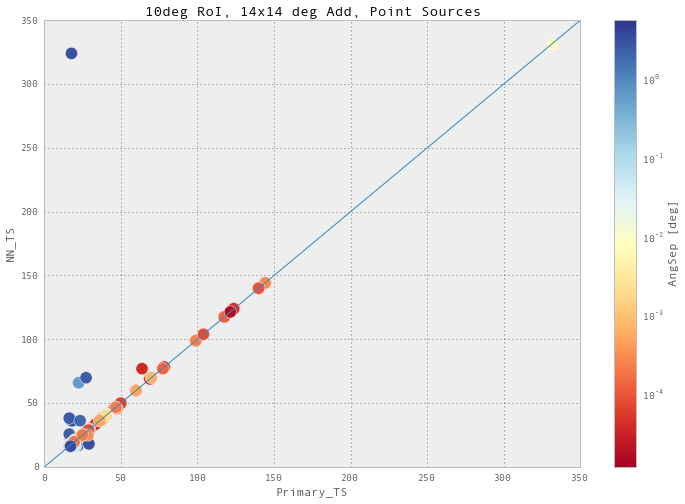

In [67]:
# one plot is Primary TS vs NN_TS. Only for sources with a source withing 0.2 deg?
#dfOverlapPS.plot(x = 'Primary_TS',y = 'NN_TS',kind = 'scatter',figsize = [8,8])
#dfOverlapPS[dfOverlapPS.AngSep <=0.3].plot(x = 'Primary_TS',y = 'NN_TS',kind = 'scatter',figsize = [8,8])

#plot with pairs removed to not double count,  is only for PS
# noNNTS[(noNNTS.AngSep <=0.3) & (np.abs(noNNTS.TSdiff) <= 10)].plot(x = 'Primary_TS',y = 'NN_TS',kind = 'scatter',figsize = [10,10], s = 150,title = '10deg RoI, 14x14 deg Add, Point Sources: AngSep <= 0.3deg, |TSdiff| <= 10')
# x = [0,350]
# y = [0,350]
# plt.plot(x, y, '-')
# plt.xlim(0,150)
# plt.ylim(0,150)
# plt.savefig('10degRoI_10degAdd_seplt03_TSdifflt10.png')

#same as above, but including the outliers

# noNNTS.plot(x = 'Primary_TS',y = 'NN_TS',kind = 'scatter',figsize = [10,10], s = 150,title = '10deg RoI, 14x14 deg Add, Point Sources')
# x = [0,350]
# y = [0,350]
# plt.plot(x, y, '-')
# plt.xlim(0,350)
# plt.ylim(0,350)
# plt.savefig('10degRoI_10degAdd_PS_TS.png')

fig = plt.figure(figsize=[12,8])
cm = plt.cm.get_cmap('RdYlBu')
sc = plt.scatter(noNNTS.Primary_TS, noNNTS.NN_TS ,s = 150, c=noNNTS.AngSep.tolist(),cmap =cm,norm=mpl.colors.LogNorm())
plt.colorbar(sc,label = 'AngSep [deg]')
x = [0,500]
y = [0,500]
plt.plot(x, y, '-')
plt.xlim(0,350)
plt.ylim(0,350)
plt.xlabel('Primary_TS')
plt.ylabel('NN_TS')
plt.title('10deg RoI, 14x14 deg Add, Point Sources')
plt.savefig('10degRoI_10degAdd_PS_TSscatAngSep.png')
#do the same for ES using...TS? TS ext? ext?
#give mean,min,max, std of difference in TS

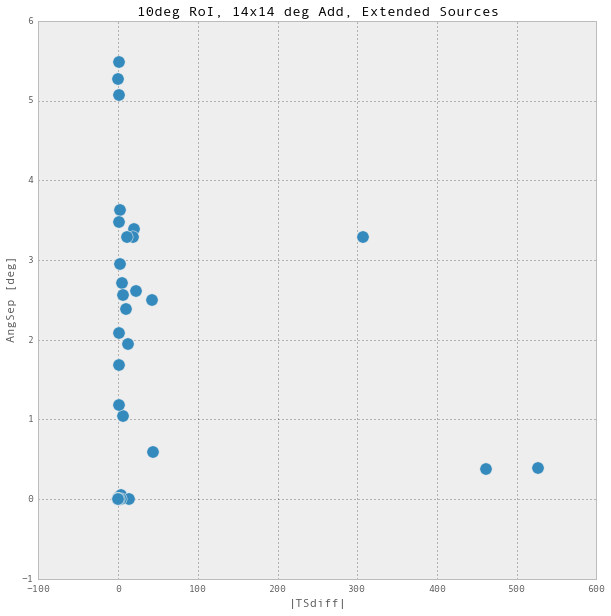

In [54]:
#plot angular sep vs |TSdiff| for ES
ax = noNNTS.plot(y = 'AngSep',x = '|TSdiff|',s = 150,kind = 'scatter',figsize = [10,10], title = '10deg RoI, 14x14 deg Add, Extended Sources')
plt.ylabel('AngSep [deg]')
plt.savefig('10degRoI_10degAdd_PS_angSep_magTSdiff.png')

In [55]:
noNNTS[noNNTS.AngSep <=0.3].sort('TSdiff')

,NearestNeighbor,AngSep,Primary_l,NN_b,Primary_b,NN_b,Primary_TS,NN_TS,TSdiff,|TSdiff|
l335_b0_PS_4,l340_b0_PS_8,3.764887e-05,338.2737,338.2736,-0.03980105,-0.03979325,63.76841,76.92485,-13.15643,13.15643
l170_b0_PS_1,l175_b0_PS_1,0.02642746,172.7647,172.7381,-6.751949,-6.752597,17.59703,19.53318,-1.936149,1.936149
l155_b0_PS_4,l150_b0_PS_3,0.008520325,151.9447,151.9532,3.749338,3.750125,22.98696,24.8068,-1.819841,1.819841
l290_b0_PS_4,l285_b0_PS_4,0.008573531,284.7418,284.7497,3.247016,3.250428,19.78247,21.08951,-1.307039,1.307039
l260_b0_PS_3,l265_b0_PS_2,0.01694441,258.9473,258.9315,-4.751161,-4.744708,17.51455,18.63863,-1.12408,1.12408
l175_b0_PS_2,l180_b0_PS_1,0.001980552,180.0519,180.05,0.6493719,0.6500034,19.01717,19.46299,-0.4458146,0.4458146
l55_b0_PS_2,l60_b0_PS_4,0.0007363916,60.98884,60.98826,-0.701906,-0.7023677,16.30478,16.70237,-0.3975915,0.3975915
l280_b0_PS_4,l285_b0_PS_3,6.453241e-05,284.0856,284.0857,-0.5334651,-0.5334213,36.34793,36.71887,-0.3709392,0.3709392
l345_b0_PS_2,l355_b0_PS_1,0.001496753,349.7958,349.7972,-5.24491,-5.24438,19.84455,20.19078,-0.3462311,0.3462311
l140_b0_PS_1,l135_b0_PS_3,0.003348808,136.544,136.5473,-3.546421,-3.545893,24.70057,25.0266,-0.3260274,0.3260274


In [56]:
#Max including high TSdfiff sources
nnMax = np.max(np.abs(dfOverlapPS[dfOverlapPS.AngSep <=0.3].Primary_TS-dfOverlapPS[dfOverlapPS.AngSep <=0.3].NN_TS))
nnMin = np.min(np.abs(dfOverlapPS[dfOverlapPS.AngSep <=0.3].Primary_TS-dfOverlapPS[dfOverlapPS.AngSep <=0.3].NN_TS))
#nnVar = np.var(np.abs(dfOverlapPS[dfOverlapPS.AngSep <=0.3].Primary_TS-dfOverlapPS[dfOverlapPS.AngSep <=0.3].NN_TS))
nnMean = np.mean(np.abs(dfOverlapPS[dfOverlapPS.AngSep <=0.3].Primary_TS-dfOverlapPS[dfOverlapPS.AngSep <=0.3].NN_TS))
nnStd = np.std(np.abs(dfOverlapPS[dfOverlapPS.AngSep <=0.3].Primary_TS-dfOverlapPS[dfOverlapPS.AngSep <=0.3].NN_TS))
print 'Max = %s, Min = %s, Mean = %s, std = %s' %(nnMax, nnMin, nnMean, nnStd)

Max = 13.1564325193, Min = 6.288565055e-05, Mean = 0.375658981359, std = 1.34830512883


In [57]:
#again without outliers
nnMax = np.max(noNNTS[(noNNTS.AngSep <=0.3) & (np.abs(noNNTS.TSdiff) <= 10)].TSdiff)
nnMin = np.min(noNNTS[(noNNTS.AngSep <=0.3) & (np.abs(noNNTS.TSdiff) <= 10)].TSdiff)
#nnVar = np.var(noNNTS[(noNNTS.AngSep <=0.3) & (np.abs(noNNTS.TSdiff) <= 10)].TSdiff)
nnMean = np.mean(noNNTS[(noNNTS.AngSep <=0.3) & (np.abs(noNNTS.TSdiff) <= 10)].TSdiff)
nnStd = np.std(noNNTS[(noNNTS.AngSep <=0.3) & (np.abs(noNNTS.TSdiff) <= 10)].TSdiff)
print 'Max = %s, Min = %s, Mean = %s, std = %s' %(nnMax, nnMin, nnMean, nnStd)

Max = 4.09342846013, Min = -1.93614877014, Mean = 0.089885905526, std = 0.617853411141


In [123]:
#onnes that are verry different are where there's an extended source?

In [130]:
#write region with all sources, TS >=16, including RoI that didn't finish
regfilename='2FHL_addSrcs_TSgt16.reg'
outdir = os.path.join('/Users/jmcohen/Desktop',regfilename)
writeReg(srcDFwNoFin,outdir)

In [58]:
noNNTS_ES['TSdiff'] = noNNTS_ES.Primary_TS-noNNTS_ES.NN_TS
noNNTS_ES['TSdiff_mag'] = np.abs(noNNTS_ES.TSdiff)

In [111]:
noNNTS_ES

,NearestNeighbor,AngSep,Primary_l,NN_b,Primary_b,NN_b,Primary_TS,NN_TS,Primary_TSext,NN_TSext,Primary_Sigma,NN_Sigma,TSdiff,TSdiff_mag
l5_b0_ES_1,l15_b0_ES_2,0.000913392,8.376084,8.376562,-0.09475596,-0.09397795,168.2198,168.3401,105.4175,106.6947,0.3779265,0.3796716,-0.1202507,0.1202507
l10_b0_ES_1,l5_b0_ES_1,0.001585297,8.377582,8.376084,-0.09527249,-0.09475596,168.2977,168.2198,104.4793,105.4175,0.379164,0.3779265,0.07789913,0.07789913
l15_b0_ES_1,l20_b0_ES_4,0.002414425,17.63464,17.63705,-0.8767976,-0.8768986,239.0809,239.0549,270.6156,270.3152,1.302653,1.301833,0.02599371,0.02599371
l20_b0_ES_1,l30_b0_ES_3,0.2009626,26.86986,27.05973,-0.2186195,-0.2844409,89.2515,84.61253,53.76404,54.0143,0.5871852,0.5710336,4.638972,4.638972
l20_b0_ES_2,l25_b0_ES_1,0.02815026,25.57885,25.59351,0.09663501,0.07260587,159.208,271.7401,271.8911,271.9255,1.058261,1.083004,-112.532,112.532
l20_b0_ES_3,l30_b0_ES_2,0.006080294,23.22052,23.21781,-0.3788535,-0.3734091,69.29819,69.27379,32.7418,37.29684,0.2552311,0.2604461,0.02440202,0.02440202
l25_b0_ES_2,l20_b0_ES_3,0.006717351,23.22561,23.22052,-0.3832345,-0.3788535,69.2993,69.29819,37.0682,32.7418,0.2511288,0.2552311,0.001108502,0.001108502
l30_b0_ES_1,l20_b0_ES_2,0.03133313,25.54819,25.57885,0.09016139,0.09663501,183.2517,159.208,272.2422,271.8911,1.083494,1.058261,24.04364,24.04364
l55_b0_ES_1,l80_b0_ES_1,17.59276,60.63121,78.16755,0.7209205,2.204598,41.17421,91.41387,41.17883,57.15058,1.069658,0.5573184,-50.23966,50.23966
l75_b0_ES_2,l80_b0_ES_2,0.03098255,79.20719,79.23793,1.951112,1.947159,121.2079,121.2267,200.3562,199.6869,2.952826,2.974641,-0.0187945,0.0187945


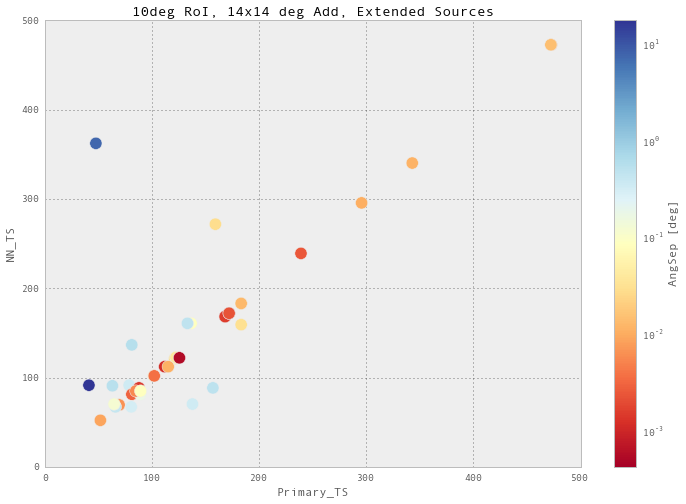

In [62]:
#for ES maybe AngSep <= 0.3 isn't so good

#plot with pairs removed to not double count,  is only for PS ###& (np.abs(noNNTS_ES.TSdiff) <= 10)
####idk why none of this works, but plt.scatter does see  https://stackoverflow.com/questions/6063876/matplotlib-colorbar-for-scatter
# noNNTS_ES[(noNNTS_ES.AngSep <=0.3)].plot(x = 'Primary_TS',y = 'NN_TS',kind = 'scatter',figsize = [8,8], title = '10deg RoI, 5 deg Add, Extended Sources: AngSep <= 0.3deg, |TSdiff| <= 10')
asep = noNNTS_ES.AngSep.tolist() #doesn't work if I just put 'AngSep' into pandas
# ax = noNNTS_ES.plot(kind = 'scatter',x = 'Primary_TS',y = 'NN_TS', c= asep, colormap = 'heat', figsize = [8,8], title = '10deg RoI, 5 deg Add, Extended Sources: AngSep <= 0.3deg, |TSdiff| <= 10')
# cb = plt.colorbar()
# cb.set_label('Cbar Label Here')
fig = plt.figure(figsize=[12,8])
cm = plt.cm.get_cmap('RdYlBu')
sc = plt.scatter(noNNTS_ES.Primary_TS, noNNTS_ES.NN_TS ,s = 150, c=noNNTS_ES.AngSep.tolist(),cmap =cm,norm=mpl.colors.LogNorm())
plt.colorbar(sc,label = 'AngSep [deg]')
# x = [0,500]
# y = [0,500]
# plt.plot(x, y, '-')
# plt.xlim(0,500)
# plt.ylim(0,500)
plt.xlabel('Primary_TS')
plt.ylabel('NN_TS')
plt.title('10deg RoI, 14x14 deg Add, Extended Sources')
plt.savefig('10degRoI_10degAdd_ES_TSscatAngSep.png')


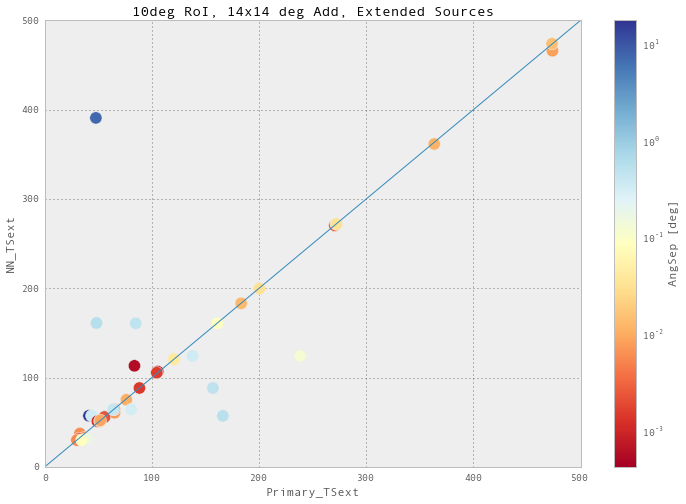

In [67]:
####same as above but for TS_ext
fig = plt.figure(figsize=[12,8])
cm = plt.cm.get_cmap('RdYlBu')
sc = plt.scatter(noNNTS_ES.Primary_TSext, noNNTS_ES.NN_TSext ,s = 150, c=noNNTS_ES.AngSep.tolist(),cmap =cm,norm=mpl.colors.LogNorm())
plt.colorbar(sc,label = 'AngSep [deg]')
x = [0,500]
y = [0,500]
plt.plot(x, y, '-')
plt.xlim(0,500)
plt.ylim(0,500)
plt.xlabel('Primary_TSext')
plt.ylabel('NN_TSext')
plt.title('10deg RoI, 14x14 deg Add, Extended Sources')
plt.savefig('10degRoI_10degAdd_ES_TSextscatAngSep.png')


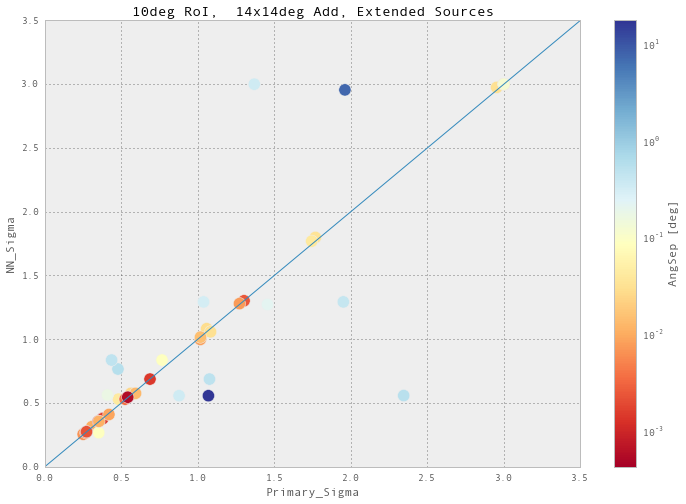

In [68]:
####same as above but for extension
fig = plt.figure(figsize=[12,8])
cm = plt.cm.get_cmap('RdYlBu')
sc = plt.scatter(noNNTS_ES.Primary_Sigma, noNNTS_ES.NN_Sigma ,s = 150, c=noNNTS_ES.AngSep.tolist(),cmap =cm,norm=mpl.colors.LogNorm())
plt.colorbar(sc,label = 'AngSep [deg]')
x = [0,3.5]
y = [0,3.5]
plt.plot(x, y, '-')
plt.xlim(0,3.5)
plt.ylim(0,3.5)
plt.xlabel('Primary_Sigma')
plt.ylabel('NN_Sigma')
plt.title('10deg RoI,  14x14deg Add, Extended Sources')
plt.savefig('10degRoI_10degAdd_ES_SigmascatAngSep.png')


In [84]:
####same as above but comparing extension of AngSep w/tsdiff cbar?
fig = plt.figure(figsize=[12,8])
cm = plt.cm.get_cmap('RdYlBu')
sc = plt.scatter(noNNTS_ES.Primary_Sigma, noNNTS_ES.NN_Sigma ,s = 150, c=np.abs(noNNTS_ES.TSdiff.tolist()), cmap = cm,norm=mpl.colors.LogNorm())
plt.colorbar(sc,label = '|TSdiff|')
x = [0,3.5]
y = [0,3.5]
plt.plot(x, y, '-')
plt.xlim(0,3.5)
plt.ylim(0,3.5)
plt.xlabel('Primary_TSext')
plt.ylabel('NN_TSext')
plt.title('10deg RoI, 14x14 deg Add, Extended Sources')
plt.savefig('10degRoI_10degAdd_ES_SigmascatTSdiff.png')


AttributeError: 'DataFrame' object has no attribute 'TSdiff'

(-10, 150)

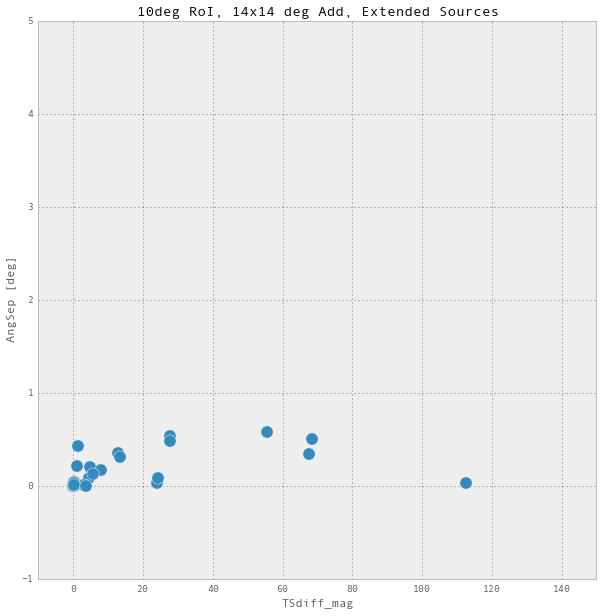

In [81]:
#plot angular sep vs |TSdiff| for ES
noNNTS_ES.plot(y = 'AngSep',x = 'TSdiff_mag',s = 150,kind = 'scatter',figsize = [10,10], title = '10deg RoI, 14x14 deg Add, Extended Sources')
plt.ylabel('AngSep [deg]')
plt.ylim(-1,5)
plt.xlim(-10,150)
#plt.savefig('10degRoI_10degAdd_ES_angSep_magTSdiff.png')

In [139]:
regfilename='2FHL_addSrcs_testESnn.reg'
outdir = os.path.join('/Users/jmcohen/Desktop',regfilename)
writeRegPrim(noNNTS_ES,outdir)

# Make NN sigma maps for 3FGL extended vs addSrcs

In [14]:
import mpld3
"""Stole this from Fabio, who I think took it from the mpld3 examples page"""


#Define some CSS to control our custom labels
css = """
table
{
  border-collapse: collapse;
}
th
{
  color: #ffffff;
  background-color: #000000;
}
td
{
  background-color: #cccccc;
}
table, th, td
{
  font-family:Arial, Helvetica, sans-serif;
  border: 1px solid black;
  text-align: right;
}
"""
def makeLabels(df):
    """Stole this from Fabio too
       Does it do what I want it to do?
    """
    labels=[]
    for i in range(len(df)):
        label = df.ix[[i], :].T
        #label.columns = ['{0}'.format(  newname[i]  )]
    #    # .to_html() is unicode; so make leading 'u' go away with str()
        labels.append(str(label.to_html()))
    return labels

In [15]:
lab = makeLabels(dfnearES)
#print lab

In [16]:
def plotScatter(df, figsz, cmap, tit,xlab,ylab,x,y,c,clab,xmin,xmax,ymin,ymax,s=150, oneone = True):
    fig = plt.figure(figsize = figsz)
    cm = plt.cm.get_cmap(cmap)
    sc = plt.scatter(dfnearES[x], dfnearES[y] ,s = s, c=np.abs(dfnearES[c].tolist()), cmap = cm,norm=mpl.colors.LogNorm())
    cbar = plt.colorbar(sc,label = 'Angular Separation of Centers [deg]')#,drawedges=False)
    cbar.solids.set_edgecolor("face")
    plt.draw()
    if oneone:
        x = [xmin,xmax]
        y = [ymin,ymax]
        plt.plot(x, y, '-')
        plt.xlim(xmin,xmax)
        plt.ylim(ymin,ymax)
    plt.xlabel(xlab)
    plt.ylabel(ylab)
    #plt.title(tit)
    #sc = plt.gca() # not sure I need this
    return sc

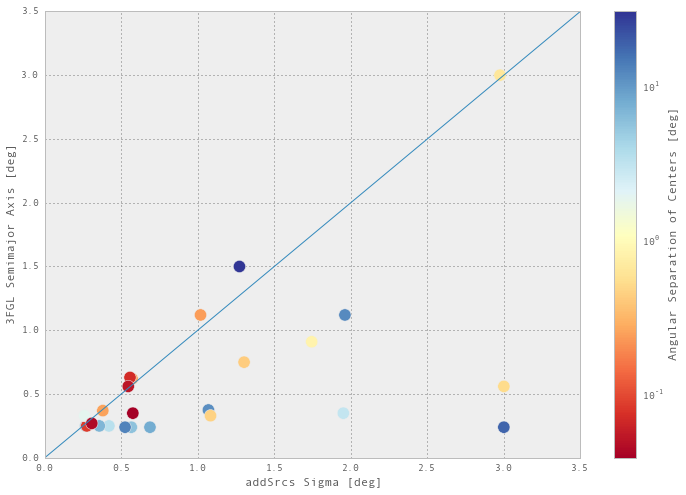

In [17]:
#known bug with the colorbar not outputting right when using mpld3 (might be fixed now?)
mpld3.enable_notebook() #only if I want every cell to act like this!
maPlot = plotScatter(df = dfnearES, figsz = [12,8], cmap = 'RdYlBu', 
          tit ='addSrcs Exteneded Sources and Nearest Neighbor',
          xlab = 'addSrcs Sigma [deg]',ylab = '3FGL Semimajor Axis [deg]',
          x = 'addSrcs_Sigma',y = '3FGL_Semi_Major',c = 'AngSep',clab = 'Angular Separation of Centers [deg]',
          xmin = 0.,xmax = 3.5, ymin = 0,ymax = 3.5,s=150)
fig = plt.figure(figsize=(12, 8))
tooltip = mpld3.plugins.PointHTMLTooltip(maPlot,lab,voffset=10, hoffset=10, css=css)
mpld3.plugins.connect(fig, tooltip)
#plt.savefig('sigmaNN_angSep.png')
#mpld3.disable_notebook()
# mpld3.display()
#mpld3.save_html(fig,'/Users/jmcohen/Desktop/sigmaNN_angSep.html')
#mpld3.save_json(fig,'/Users/jmcohen/Desktop/sigmaNN_angSep.json')

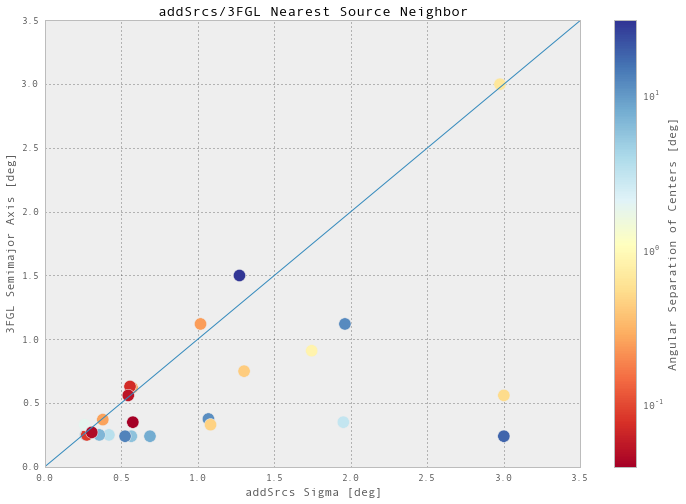

In [90]:
#I think the above plot won't show up on github notebook?
#tried saving out html but it didn't work,
#not sure how to do it right
mpld3.disable_notebook() #only if I want every cell to act like this!
maPlot = plotScatter(df = dfnearES, figsz = [12,8], cmap = 'RdYlBu', 
          tit ='addSrcs Exteneded Sources and Nearest Neighbor',
          xlab = 'addSrcs Sigma [deg]',ylab = '3FGL Semimajor Axis [deg]',
          x = 'addSrcs_Sigma',y = '3FGL_Semi_Major',c = 'AngSep',clab = 'Angular Separation of Centers [deg]',
          xmin = 0.,xmax = 3.5, ymin = 0,ymax = 3.5,s=150)
#fig = plt.figure(figsize=(12, 8))
#tooltip = mpld3.plugins.PointHTMLTooltip(maPlot,lab,voffset=10, hoffset=10, css=css)
#mpld3.plugins.connect(fig, tooltip)
plt.title('addSrcs/3FGL Nearest Source Neighbor')
plt.savefig('/Users/jmcohen/Desktop/sigmaNN_addSrcs3FGL.png')


# Make plots for addSrcs ES overlaying  TeV/GeV

In [26]:
#Should I do it for all addSrcs wih 3FGL withing 1 deg?
#or maybe just inside 3FGL 
#albMar3FGL for just the 3
angSep3FGL_lt1deg = dfnearES[dfnearES.AngSep < 1.]#.loc[albTemp].dropna(how='all')
angSep3FGL_lt1deg.sort('AngSep')

,3FHL_Name,AngSep,3FGL_Model_Form,addSrcs_Sigma,3FGL_Semi_Major,addSrcs_r68,r68/SemiMaj,sigma/SemiMaj
l335_b0_ES_3,HESS J1632-478,0.038975,Disk,0.575930,0.35,0.474924,NaN,1.645515
l190_b0_ES_1,IC443,0.044614,2D Gaussian,0.307757,0.27,0.253783,0.939937,NaN
l350_b0_ES_2,RX J1713.7-3946,0.052940,Map,0.545859,0.56,0.450127,NaN,0.974748
l80_b0_ES_1,gamma Cygni,0.072545,Disk,0.557318,0.63,0.459577,NaN,0.884632
l325_b0_ES_1,MSH 15-52,0.086123,Disk,0.274907,0.25,0.226694,NaN,1.099628
l330_b0_ES_3,HESS J1616-508,0.126548,Disk,0.478697,0.32,0.394744,NaN,1.495929
l330_b0_ES_2,HESS J1614-518,0.205558,Disk,0.437196,0.42,0.360521,NaN,1.040943
l265_b0_ES_2,Vela Jr,0.245081,Disk,1.018017,1.12,0.839478,NaN,0.908944
l15_b0_ES_2,W30,0.255416,Disk,0.379672,0.37,0.313085,NaN,1.026139
l30_b0_ES_3,HESS J1841-055,0.273115,2D Gaussian,0.571034,0.62,0.470886,0.759494,NaN


In [19]:
len(dfnearES)

25

# Check nearest neighbor for 2FGL outside the plane

Curious if there are any clustered extragalactic PS

In [25]:
#This will only check for single nearest neighbor, but I think that's good enough
#It's different than checking for nearest neighbor for addSrcs because there, I was looking for overlapping sources in neighboring RoI
#These exist already
#df2FHL
#df2FHL_PS
#df2FHL_ES
#crds2FHL
crds2FHL_PS = SkyCoord(l = df2FHL_PS.GLON ,b = df2FHL_PS.GLAT, frame = 'galactic', unit = (u.degree, u.degree))
if 'dfnearPGW' in locals():
    del dfnearPGW
dfnearPGW = pd.DataFrame(columns=['NearestNeighbor', 'AngSep', 'Primary_l', 'NN_l', 'Primary_b','NN_b','Primary_index','NN_index'])#,'Primary_Sigma','NN_Sigma']) #include sigma just to make it easy to cut out ES
indMin, indSep, sep = chkSep(crds2FHL_PS, crds2FHL_PS,n = 2) # idk if I need indMin?
for i,j in enumerate(indSep): #i is index of crdsAdd with nearest 3FGL ES, that has index j #use indMin or indSep
    srci = df2FHL.iloc[i]
    srcj = df2FHL.iloc[j]
    dfnearPGW.loc[srci.name] = [srcj.name,sep[i].degree, srci.GLON, srcj.GLON, srci.GLAT, srcj.GLAT,srci.Spectral_Index, srcj.Spectral_Index]#,sigi,sigj]

In [29]:
# only show shources outside the plane 10 > |b|
#doesn't matter that there are pairs here, I can see what the closest neighbors are anyway
dfnearPGW[np.abs(dfnearPGW.Primary_b) >= 10].sort('AngSep')


,NearestNeighbor,AngSep,Primary_l,NN_l,Primary_b,NN_b,Primary_index,NN_index
2FHL J0319.8+4131,2FHL J0316.6+4120,0.624249,150.579773,150.172791,-13.245687,-13.728453,2.92,1.33
2FHL J0316.6+4120,2FHL J0319.8+4131,0.624249,150.172791,150.579773,-13.728453,-13.245687,1.33,2.92
2FHL J1443.9-3909,2FHL J1440.7-3847,0.721151,325.638153,325.218689,18.699337,19.301634,2.83,2.78
2FHL J1440.7-3847,2FHL J1443.9-3909,0.721151,325.218689,325.638153,19.301634,18.699337,2.78,2.83
2FHL J1221.3+3009,2FHL J1217.9+3006,0.746567,186.515747,188.944427,82.737816,82.063705,2.13,2.60
2FHL J1217.9+3006,2FHL J1221.3+3009,0.746567,188.944427,186.515747,82.063705,82.737816,2.60,2.13
2FHL J0811.6+0146,2FHL J0811.9+0238,0.875015,220.742630,219.960495,18.610353,19.076977,15.00,1.61
2FHL J0811.9+0238,2FHL J0811.6+0146,0.875015,219.960495,220.742630,19.076977,18.610353,1.61,15.00
2FHL J2146.6-1342,2FHL J2150.3-1411,1.005645,40.702183,40.598591,-44.964752,-45.967770,4.11,3.12
2FHL J2150.3-1411,2FHL J2146.6-1342,1.005645,40.598591,40.702183,-45.967770,-44.964752,3.12,4.11


In [30]:
#this is to not double count src1/src2 src2/src1
keepDrop = {}
if 'noNNTS_pgw' in locals(): del noNNTS_pgw
for ind,src in enumerate(dfnearPGW.index):
    if ind == 0:
        srci = dfnearPGW.loc[src]
        srcnn = srci.NearestNeighbor
        noNNTS_pgw = dfnearPGW.drop(srcnn)
        keepDrop[src] = srcnn
        #print src,'dropped', srcnn
    else:
        if not src in keepDrop.values(): #first check that it hasn't been dropped   then check that it's pair hasn't been used
            srci = noNNTS_pgw.loc[src]
            srcnn = srci.NearestNeighbor
            if not srcnn in keepDrop.keys() and not srcnn in keepDrop.values() : # if srcnn is in values it has been dropped, if it's in keys it's been done
                noNNTS_pgw.drop(srcnn,inplace = True)
                keepDrop[src] = srcnn
                #print src,'dropped', srcnn
            #else:print src, ind,'b'


#dfOverlapPS.iloc[nn]
#dfOverlapPS[dfOverlapPS.AngSep <=0.3].plot(x = 'Primary_TS',y = 'NN_TS',kind = 'scatter',figsize = [8,8])
# x = [0,350]
# y = [0,350]
# plt.plot(x, y, '-')
# plt.xlim(0,350)
# plt.ylim(0,350)


#is this all right???

In [38]:
#is this wrong? looks like it got rid of 2FHL J0319.8+4131	2FHL J0316.6+4120	0.624249
noNNTS_pgw[np.abs(noNNTS_pgw.Primary_b) >= 10].sort('AngSep')

,NearestNeighbor,AngSep,Primary_l,NN_l,Primary_b,NN_b,Primary_index,NN_index
2FHL J1440.7-3847,2FHL J1443.9-3909,0.721151,325.218689,325.638153,19.301634,18.699337,2.78,2.83
2FHL J1217.9+3006,2FHL J1221.3+3009,0.746567,188.944427,186.515747,82.063705,82.737816,2.60,2.13
2FHL J0811.9+0238,2FHL J0811.6+0146,0.875015,219.960495,220.742630,19.076977,18.610353,1.61,15.00
2FHL J2146.6-1342,2FHL J2150.3-1411,1.005645,40.702183,40.598591,-44.964752,-45.967770,4.11,3.12
2FHL J1304.5-4353,2FHL J1307.6-4259,1.065712,305.423584,306.075928,18.915548,19.785561,4.50,3.79
2FHL J0526.6-6825e,2FHL J0537.4-6908,1.221846,278.843048,279.529846,-32.850349,-31.775167,2.15,1.15
2FHL J0805.8+7534,2FHL J0744.2+7435,1.693665,138.890991,140.226898,30.816959,29.577818,2.42,2.01
2FHL J0230.9-5755,2FHL J0244.9-5820,1.883801,280.239777,278.430359,-54.596035,-53.044163,2.84,2.93
2FHL J0157.0-5301,2FHL J0209.3-5228,1.945597,282.180695,278.359100,-61.376591,-60.768581,3.08,3.27
2FHL J1325.6-4301,2FHL J1315.0-4238,1.981775,309.559296,307.557770,19.403845,20.017948,2.62,2.04


In [66]:
pgw[pgw.Spectral_Index > 5].Spectral_Index

Source_Name
2FHL J0008.1+4709     6.25
2FHL J0009.3+5031     5.07
2FHL J0241.4+6544     5.31
2FHL J0515.5+1530     6.41
2FHL J0525.8-6012     6.25
2FHL J0601.9+5317     5.34
2FHL J0604.3-4817     6.83
2FHL J0811.6+0146    15.00
2FHL J0814.8+6424     8.42
2FHL J0823.5-4246     5.23
2FHL J0853.1-3657     7.31
2FHL J1150.5+4153     7.19
2FHL J1231.7+2848     5.35
2FHL J1312.6+4828    10.02
2FHL J1404.9+6555     7.35
2FHL J1406.2-2507     5.50
2FHL J1427.3-4204    11.74
2FHL J1447.0-2658     9.24
2FHL J1542.9+6129     9.13
2FHL J1637.8-3448     5.54
2FHL J1736.1+2033     5.26
2FHL J1811.3+0342     5.33
2FHL J2112.8+0819     5.07
2FHL J2124.0+3931     7.86
2FHL J2236.4-1433     6.67
2FHL J2245.8+1543     6.98
2FHL J2254.0+1613     6.26
Name: Spectral_Index, dtype: float64

# Residual TS maps for all 2FHL regions with Galactic diffuse contours overlaid
##  I should redo these plots for my latest 2FHL (freeGalNorm) fits
##Or maybe not since I'd have to select out overlapping sources?

Contour levels for all regions are  
[  1.51109323e-14   4.43390203e-13   8.71669474e-13   1.29994875e-12
           1.72822802e-12   2.15650729e-12   2.58478656e-12   3.01306583e-12
           3.44134510e-12]

Maybe they should be logscale?

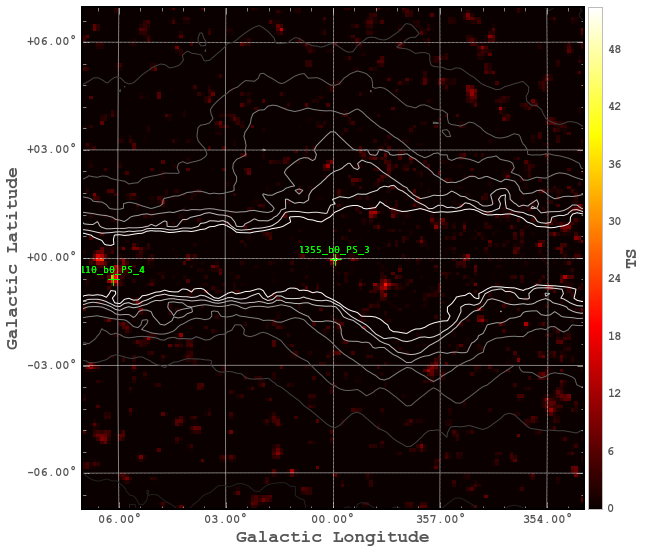

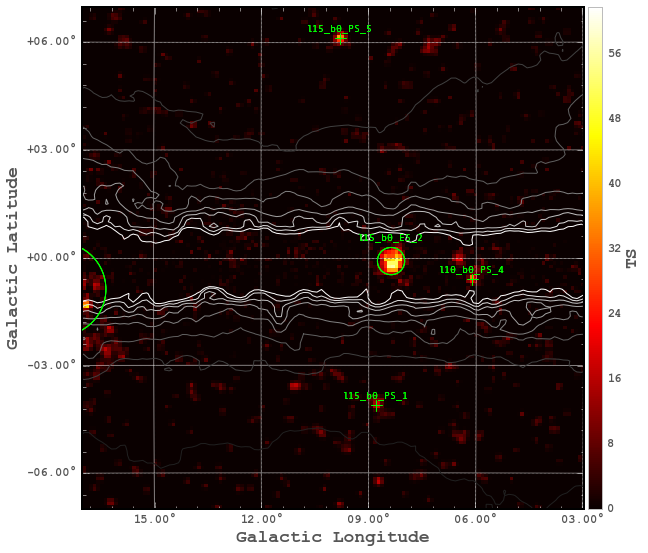

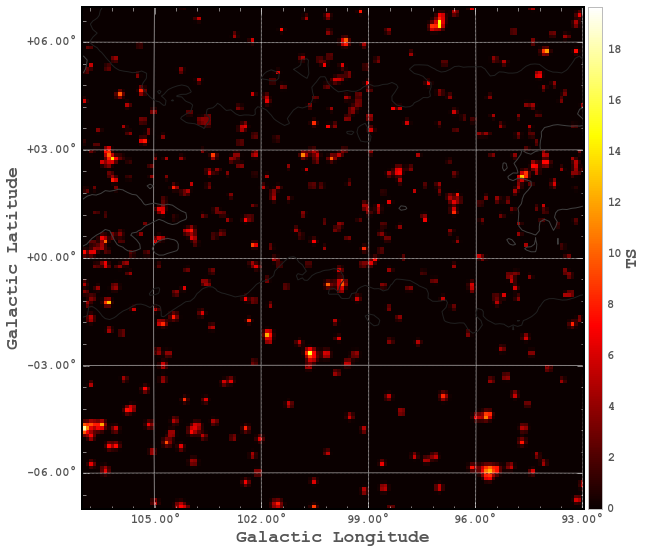

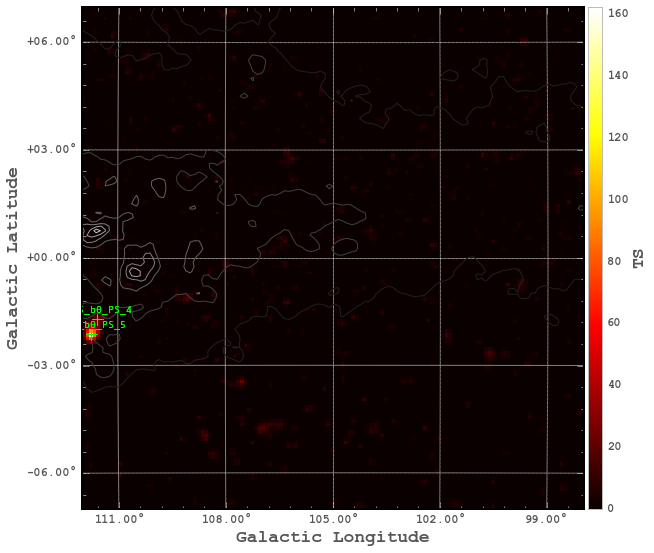

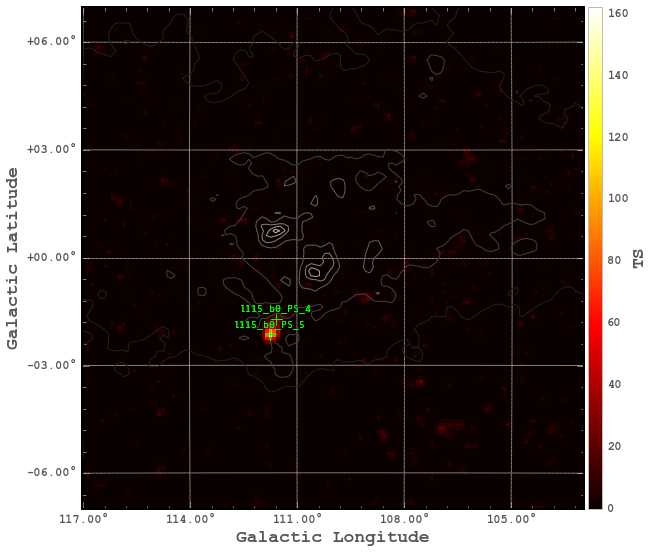

...

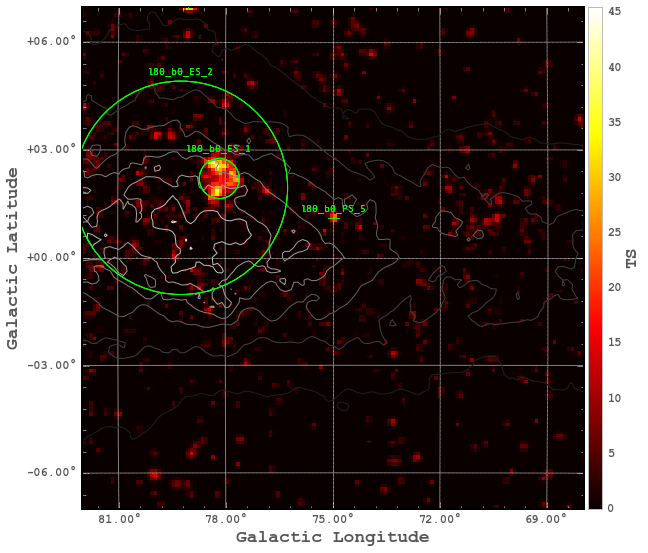

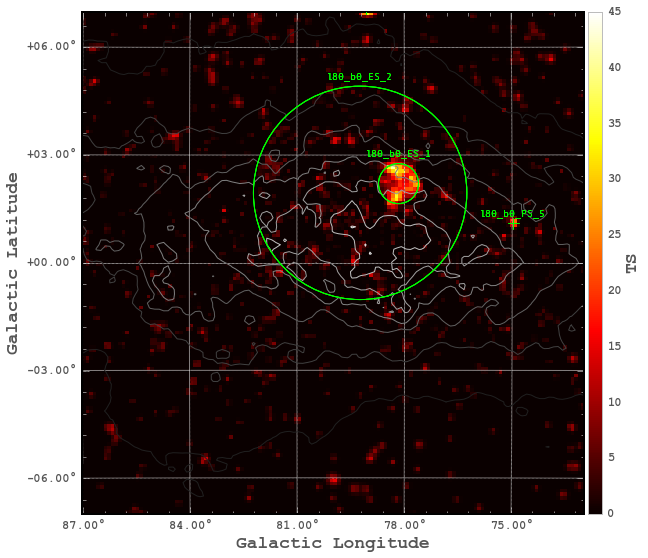

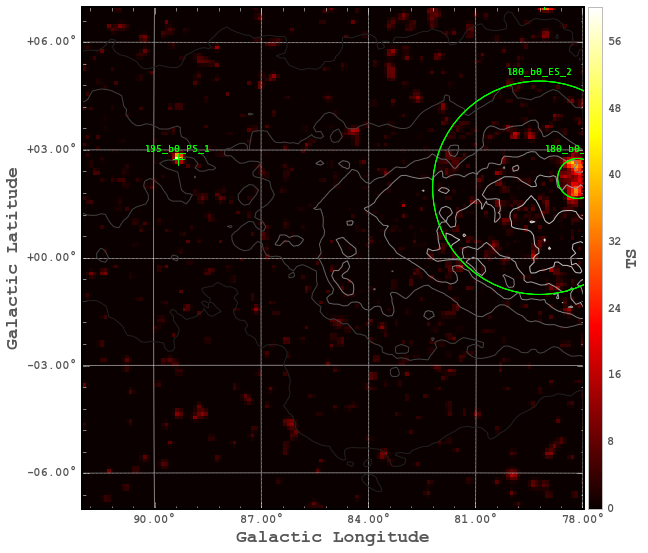

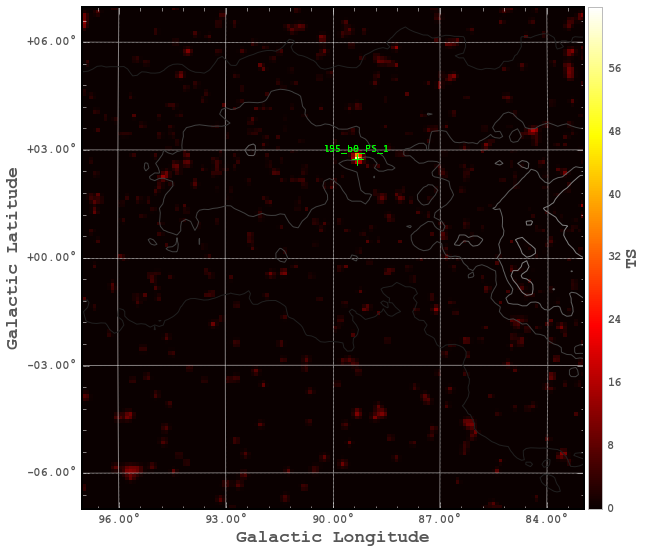

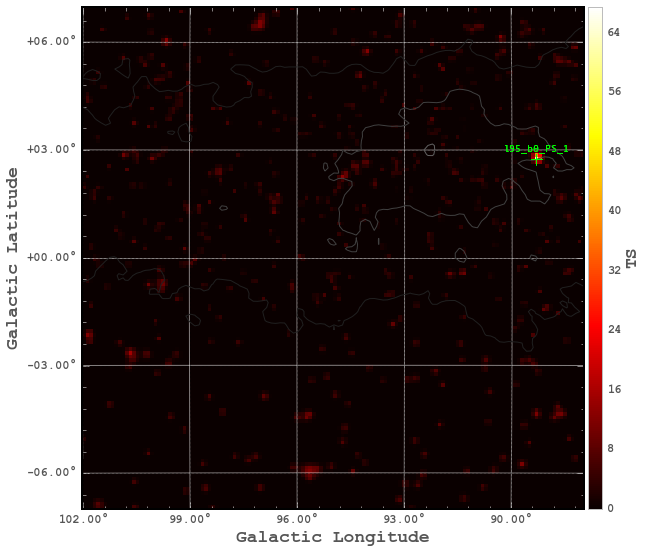

In [101]:
#
images = [f for f in glob('/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/galDiffCont/*')]
for im in images: display(Image(filename=im))
#Image(filename='/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/W28_W44_HB3_SED/makePlots_snrs3/radio_vs_gamma_flux_ULs.png', height = 700,width =700)


## Map is Galactic diffuse, TS map contours starting from TS = 16, increasing in steps of nsigma = sqrt(TS) up to np.ceil(np.sqrt(TS)) +1

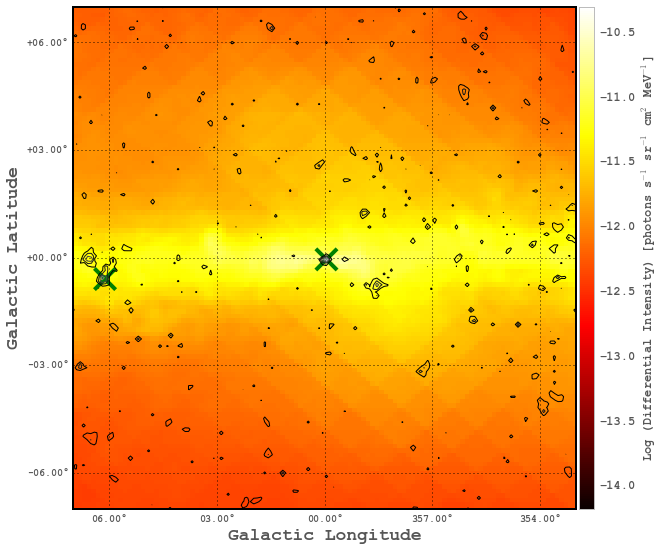

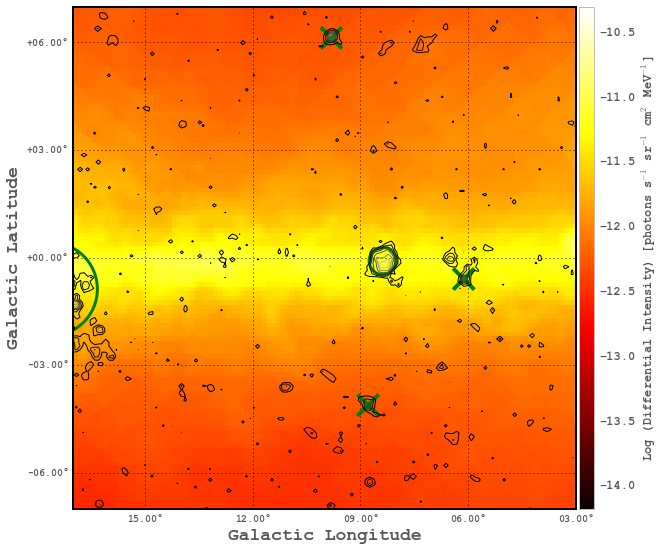

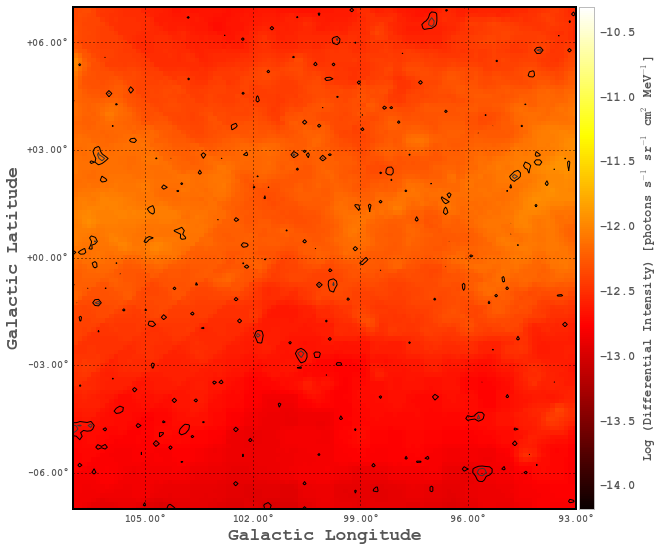

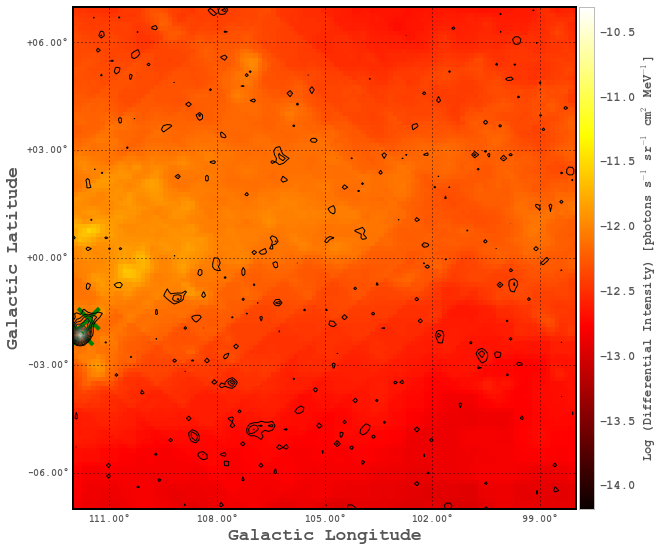

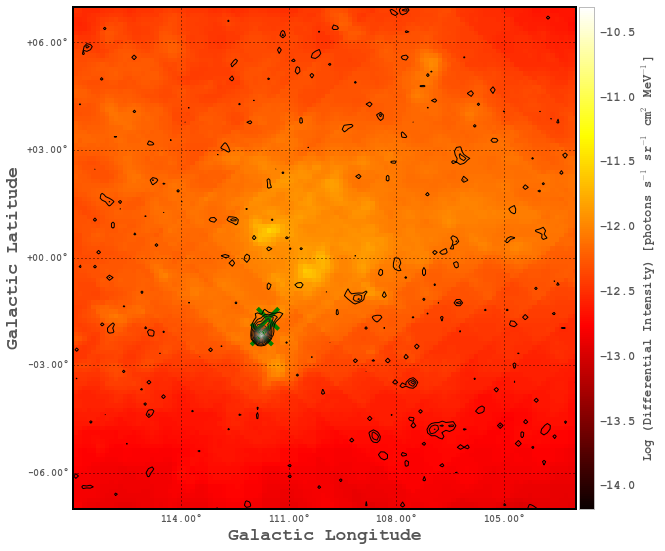

...

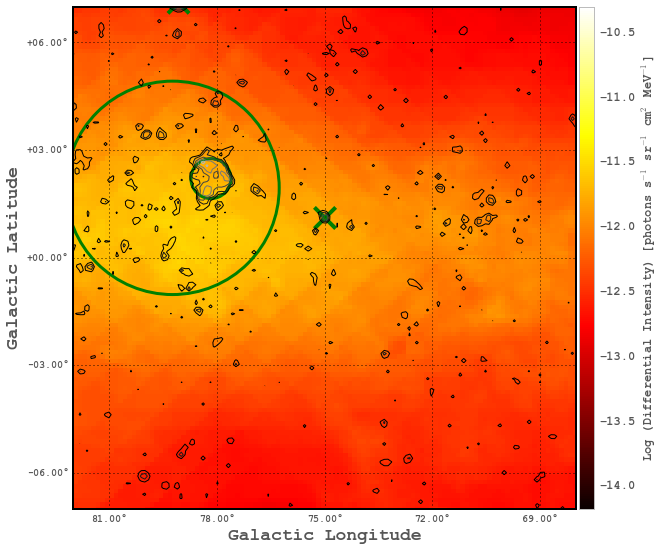

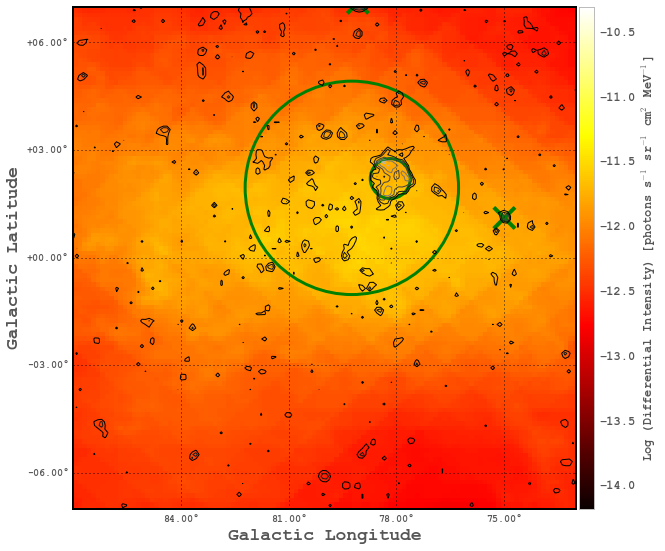

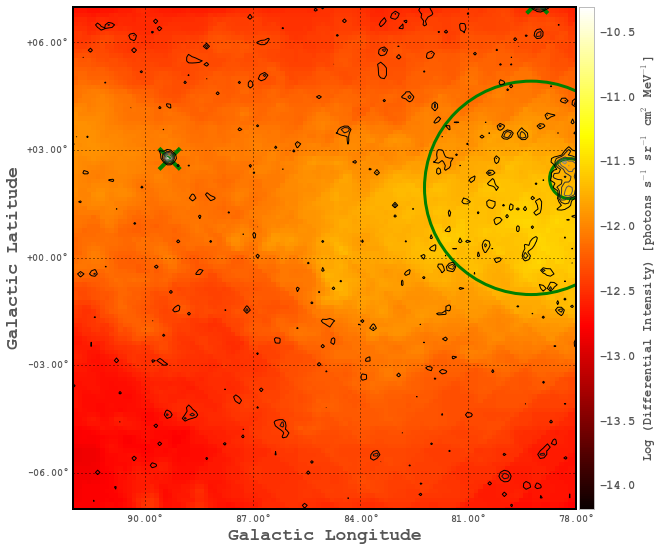

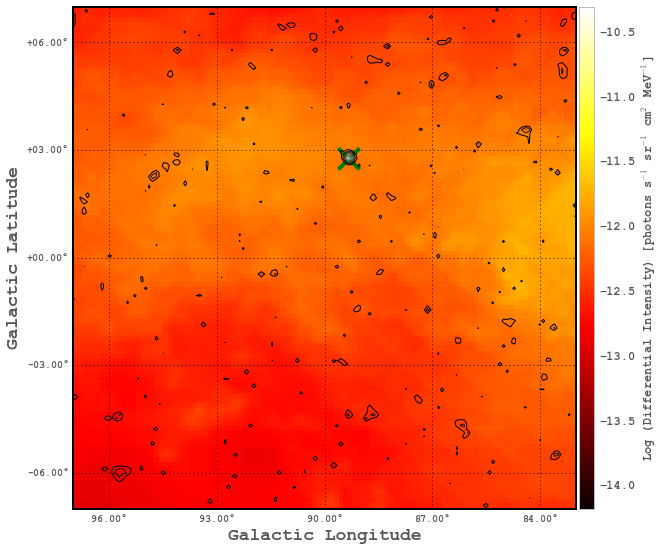

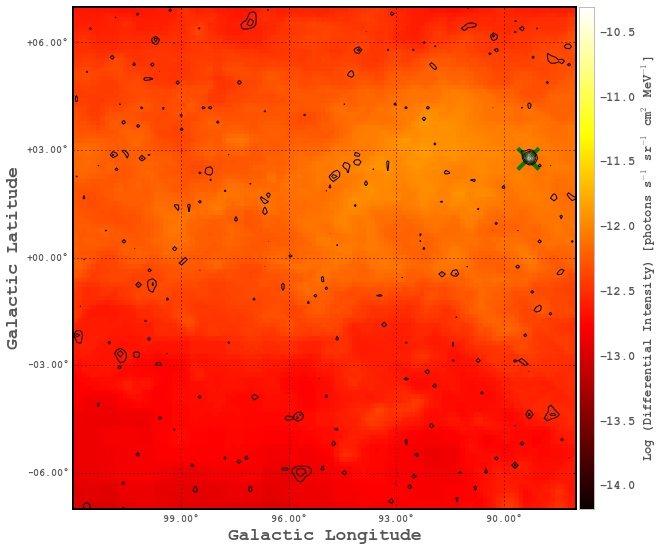

In [5]:
images = [f for f in glob('/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_lowNorm/galDiffTScont/*')]
for im in images: display(Image(filename=im))
#Image(filename='/Users/jmcohen/Dropbox/CurrentWork/SNR_MC/W28_W44_HB3_SED/makePlots_snrs3/radio_vs_gamma_flux_ULs.png', height = 700,width =700)


#For runs where I fit the gal diffuse

In [7]:
#I want to make a single DF with all the ES/PS sources and (why not) all their source params (really just want postion, pos err, sigma, sigma  err)
#Do I want a single DF or keep as panel?
dropList = [s for s in resPan.minor_axis if not s.startswith('Galactic')]
keepList = [s for s in resPan.minor_axis if s.startswith('Galactic')]
paramList = ['Index','IndexError','ModCts','Norm','NormError']
srcPan = resPan.ix[:, paramList,keepList]#.ix[:,:-3,:] #this only works be cause I know the order of the sources and because they're consecutive 

if 'galDF' in locals():
    del galDF
for f in srcPan.items:
    if not 'galDF' in locals():
        galDF = srcPan[f].transpose().dropna(how = 'all')
        #galDF.set_index(f)
    else:
        galDF = pd.concat([galDF,srcPan[f].transpose().dropna(how = 'all')])
        #galDF.set_index(f)        
galDF.set_index(srcPan.items,inplace = True) #I think this sets the index right
galDF.to_pickle('galDiff.dat')

In [8]:
galDF[['Norm','NormError']].sort()

,Norm,NormError
Region_l0.0_b0.0,[1.58712770484],[0.271873559564]
Region_l100.0_b0.0,[0.857177936921],[0.29081477122]
Region_l105.0_b0.0,[0.803718736459],[0.269526214521]
Region_l110.0_b0.0,[0.809526925959],[0.270863597401]
Region_l115.0_b0.0,[1.73905532242],[0.604021866138]
Region_l120.0_b0.0,[2.50098341166],[0.901913928237]
Region_l125.0_b0.0,[2.40825361595],[0.936162930736]
Region_l130.0_b0.0,[1.79838505567],[0.629964617876]
Region_l135.0_b0.0,[1.49390003982],[0.529014595202]
Region_l140.0_b0.0,[1.01718577093],[0.382653453316]


In [31]:
os.getcwd()

'/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree'

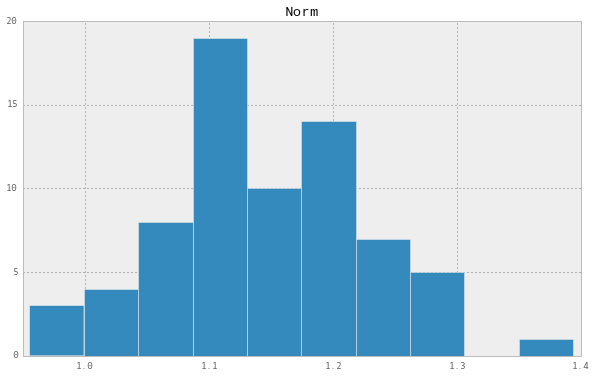

In [109]:
galDF['Norm'] = galDF.Norm.apply((lambda x: x[0])) ###all the values are lists, this makes them floats
galDF.hist('Norm',figsize = [10,6])
plt.savefig('galNorm.png')



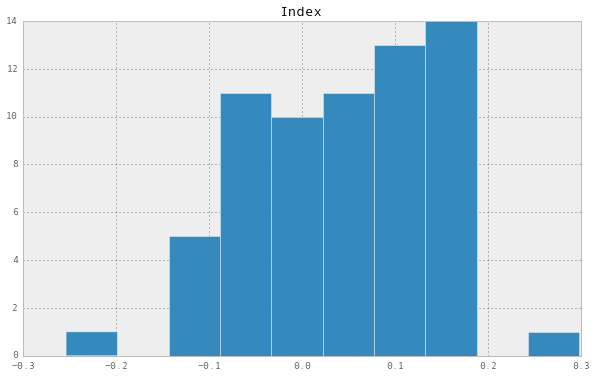

In [9]:
#for 2FHL, why is the index always so close to 0? is this what it should be?
#In the ARGO diffuse emission paper they're close to 3.
#I thought Marco said something about the value to, stating that it's soft
galDF['Index'] = galDF.Index.apply((lambda x: x[0])) ###all the values are lists, this makes them floats
galDF.hist('Index',figsize = [10,6])
plt.savefig('galIndex.png')

#Get Total counts in all RoI for comparing with > 10gev


In [20]:
#get total observed counts in all RoI for comparing with 2FHL
#This is not really the total because the RoI are not unique
#Try modeled instead
dropList = [s for s in resPan.minor_axis if not s.startswith('TotalObsCts')]
keepList = [s for s in resPan.minor_axis if s.startswith('TotalObsCts')]
paramList = ['Index']
srcPan = resPan.ix[:, paramList,keepList]#.ix[:,:-3,:] #this only works be cause I know the order of the sources and because they're consecutive 

if 'ctsDF' in locals():
    del ctsDF
for f in srcPan.items:
    if not 'ctsDF' in locals():
        ctsDF = srcPan[f].transpose().dropna(how = 'all')
        #galDF.set_index(f)
    else:
        ctsDF = pd.concat([ctsDF,srcPan[f].transpose().dropna(how = 'all')])
        #galDF.set_index(f)        
ctsDF.set_index(srcPan.items,inplace = True) #I think this sets the index right
ctsDF.to_pickle('cts.dat')
ctsDF.columns = ['TotalObsCts']

In [22]:
ctsDF.sum()

TotalObsCts    82677
dtype: float64

In [35]:
#get total observed counts in all RoI for comparing with 2FHL
#This is not really the total because the RoI are not unique
#Try modeled instead
#this doesn't help either because the total is across all RoI and not unique
#I could try getting cts for individual sources and summing thouse, but then the diffuse is still not unique in each RoI
#just make a cmap
dropList = [s for s in resPan.minor_axis if not s.startswith('TotalModCts')]
keepList = [s for s in resPan.minor_axis if s.startswith('TotalModCts')]
paramList = ['Index']
srcPan = resPan.ix[:, paramList,keepList]#.ix[:,:-3,:] #this only works be cause I know the order of the sources and because they're consecutive 

if 'modctsDF' in locals():
    del modctsDF
for f in srcPan.items:
    if not 'modctsDF' in locals():
        modctsDF = srcPan[f].transpose().dropna(how = 'all')
        #galDF.set_index(f)
    else:
        modctsDF = pd.concat([modctsDF,srcPan[f].transpose().dropna(how = 'all')])
        #galDF.set_index(f)        
modctsDF.set_index(srcPan.items,inplace = True) #I think this sets the index right
modctsDF.to_pickle('cts.dat')
modctsDF.columns = ['TotalModCts']


In [36]:
modctsDF.sum()

TotalModCts    82713.085334
dtype: float64

#Try to remove overlapping sources

In [39]:
###make a new DF with the pruned sources
#crds = SkyCoord(l= l, b = b, frame = 'galactic', unit=(u.degree, u.degree)) #preserves order in sorted(snrSuperData)
srcDF_pruned = pd.DataFrame()
for i in sorted(srcDF.index):    
    #center = i.strip('Region_l').replace('b','').split('_') 
    #center = SkyCoord(l= float(center[0]), b = float(center[1]), frame = 'galactic', unit=(u.degree, u.degree))
    #crds = SkyCoord(l= srcDF.loc[i].l, b = srcDF.loc[i].b, frame = 'galactic', unit=(u.degree, u.degree))
    #dist = crds.separation(center).degree
    #I don't care about actual distance, just whether it's in the strip of glon
    lroi = float(i.strip('Region_l').replace('b','').split('_')[0])
    lsrc = srcDF.loc[i].l
    dist = np.abs(lroi-lsrc)
    if dist < 2.5:
        #print "%s added to pruned, dist = %s " %(i,dist)
        #srcDF_pruned[i].append(srcDF.loc[i])
        srcDF_pruned[i] = srcDF.loc[i]
    elif dist == 2.5:
        #what to do with these? add to pruned but flag somehow
        #print "%s added to pruned, but not sure which overlapping source to keep, dist = %s " %(i,dist)
        srcDF_pruned[i+'_f'] = srcDF.loc[i]
        #srcDF_pruned[i + 'f'].append(srcDF.loc[i])
        
#     else:
#         #print "%s not added to pruned, dist = %s " %(i,dist)
         
srcDF_pruned = srcDF_pruned.T

In [40]:
numUniq = len(srcDF_pruned.index)
print numUniq

115


In [41]:
srcDF_pruned.columns

Index([u'DEC', u'DECError', u'RA', u'RAError', u'Sigma', u'SigmaError', u'Index', u'l', u'b', u'TS', u'TS_ext', u'Flux', u'ModCts'], dtype='object')

In [114]:
outdir = os.path.join(galPlaneDir,'prunedTSlt16Srcs.reg')
writeReg(srcDF_pruned,outdir)

In [46]:
#same but get rid of TS < 16
#len(srcDF_pruned[srcDF_pruned.TS >= 25])
os.chdir(galPlaneDir)
print os.getcwd()
outdir = os.path.join(galPlaneDir,'prunedTSlt25Srcs.reg')
writeReg(srcDF_pruned[srcDF_pruned.TS >= 25],outdir) 

/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree


In [14]:
pgw.columns

Index([u'1FHL_Name', u'3FGL_Name', u'ASSOC', u'ASSOC_PROB_BAY',
       u'ASSOC_PROB_LR', u'CLASS', u'DEJ2000', u'Energy_Flux50',
       u'Flux171_585GeV', u'Flux50', u'Flux50_171GeV', u'Flux585_2000GeV',
       u'GLAT', u'GLON', u'HEP_Energy', u'HEP_Prob', u'Npred', u'NuPeak_obs',
       u'Pos_err_68', u'RAJ2000', u'ROI', u'Redshift', u'Spectral_Index',
       u'Sqrt_TS171_585GeV', u'Sqrt_TS50_171GeV', u'Sqrt_TS585_2000GeV', u'TS',
       u'TeVCat_Name', u'Unc_Energy_Flux50', u'Unc_Flux171_585GeV',
       u'Unc_Flux50', u'Unc_Flux50_171GeV', u'Unc_Flux585_2000GeV',
       u'Unc_Spectral_Index'],
      dtype='object')

#Search for hard index unID'd 2FHL sources in the plane
## Nothing good came of this, no good candidates (|b| < 10deg, within 50pc of SNR).  100pc doesn't add much
##One hope was that even though we don't see many sources, perhaps seeing candidates > 50 GeV could give list of good CTA candidates. Not sure that not seeing good cand sources > 50 gev is so bad
##Not sure how many in the original 3FGL unid'd list had hard indices


In [10]:
## make an astropy crds obj for each of the 2FHL unknown
#crds2FHL =  SkyCoord(l= pgwUnkPlane.GLON.values, b = pgwUnkPlane.GLAT.values, frame = 'galactic', unit=(u.degree, u.degree)) #preserves order in sorted(snrSuperData)
crds2FHL =  SkyCoord(l= pgwUnk.GLON.values, b = pgwUnk.GLAT.values, frame = 'galactic', unit=(u.degree, u.degree)) #preserves order in sorted(snrSuperData)

In [13]:
#pgw.CLASS

In [136]:
# crds #astropy Gal crds for all superfile SNRs
# i want to compare each of the unknown sources with each SNR
# Calculate the angSep corresponding to 50pc for each SNR
# see if the angSep of the 2FHL source is within 50pc of the shell of and SNR
# and outside the 
# then compare dist for each of the sources with each of the SNRs
# if dist is <= aSz50pc
# make note of the 2FHL source and the SNR 
aSz50pc = angSize(100.0, distAll) # in deg not rad
aSz50pc = aSz50pc + np.asarray(radSNR) #angSize + radius of the SNR
#snr2FHLunkSep = crds2FHL.separation(crds) #I think this only works to calc 1-1 distances
###idk why I have to use crds[0]
#find closest SNR (center) to each of the unk 2FHL sources
indSep,sep,_ = crds2FHL.match_to_catalog_sky(crds[0],nthneighbor=1) #2 to not check source against itself (but only if it's the same catalog?). indSep is an array with indices for closest neighbor, indSep[1] = 138 means source 1's closest neighbor is source 138 (and vive versa)
#indMin = np.where(sep.degree < minSep) ###This only works if I'm using a single minSep. I want to loop over each SNR and check if the sep is within aSz50pc
#indSep is the index of 2FHL sources nearest neighbor
quiet = True
for unk,snr in enumerate(indSep):
    if np.isnan(distAll[snr]): #distAll is in the same order as crds
        if not quiet: print "Closest SNR to %s is %s (nick = %s), which has no distance measurment." %(pgwUnk.iloc[unk].name,snrs[snr],nickSNR[snr])
    else:
        if sep[unk].degree <= aSz50pc[snr]:
            print "YES! Closest SNR to %s is %s (nick = %s), which has distance measurment %s kpc, and angsep = %s deg, index = %s, psep = %s pc, aSz50pc = %s deg, GLAT = %s \n" %(pgwUnk.iloc[unk].name,snrs[snr],nickSNR[snr], distAll[snr],sep[unk].degree, pgwUnk.iloc[unk].Spectral_Index,physSep(sep[unk].degree,distAll[snr]),aSz50pc[snr], pgwUnk.iloc[unk].GLAT)
        else:
            if not quiet: print "NO! Closest SNR to %s is %s (nick = %s), which has distance measurment %s kpc, angsep = %s deg, psep = %s pc , aSz50pc = %s deg \n" %(pgwUnk.iloc[unk].name,snrs[snr],nickSNR[snr], distAll[snr],sep[unk].degree, physSep(sep[unk].degree,distAll[snr]), aSz50pc[snr])

YES! Closest SNR to 2FHL J0431.2+5342 is SNR156.2+05.7 (nick = None), which has distance measurment 1.1 kpc, and angsep = 4.54576745371 deg, index = 3.09999990463, psep = 87.2724700269 pc, aSz50pc = 6.12870722727 deg, GLAT = 3.72962379456 

YES! Closest SNR to 2FHL J0826.1-4500 is SNR263.9-03.3 (nick = Vela(XYZ)), which has distance measurment 0.287 kpc, and angsep = 1.61496140278 deg, index = 1.59000003338, psep = 8.08949501417 pc, aSz50pc = 22.0836862369 deg, GLAT = -4.0019159317 

YES! Closest SNR to 2FHL J1022.0-5750 is SNR284.3-01.8 (nick = MSH 10-53), which has distance measurment 3.0 kpc, and angsep = 1.26133700228 deg, index = 1.45000004768, psep = 66.043451016 pc, aSz50pc = 2.10985931667 deg, GLAT = -0.537537932396 

YES! Closest SNR to 2FHL J1714.1-4012 is SNR347.3-00.5 (nick = RX J1713.7-3946), which has distance measurment 1.0 kpc, and angsep = 0.459036425782 deg, index = 1.62999999523, psep = 8.01169701831 pc, aSz50pc = 6.22957795 deg, GLAT = -0.82007086277 

YES! Closest 

In [17]:
#maybe I should only consider ones that have index+/- unc < 2.5?
pgwUnk = pgw[pgw.CLASS == 'unk']
pgwUnkPlane = pgwUnk[np.abs(pgwUnk.GLAT) <= 10] #23
pgwUnkPlane
#pgwUnkPlane = pgw.Unk[pgwUnk.GLAT.apply((lambda x: np.abs(x))) >= 10]
#pgwUnkPlane.sort('Spectral_Index').Unc_Spectral_Index

####These are the 2FHL sources that are listed as unk but coincident with a TeV source
#so the TeV source is of unknown origin
#4 of them have not been detected as of 3FGL

#pgwUnk[pgwUnk.TeVCat_Name !=""]#pgwUnk.GLAT.apply((lambda x: np.abs(x)) <)
#then see if they're close to SNRs

,1FHL_Name,3FGL_Name,ASSOC,ASSOC_PROB_BAY,ASSOC_PROB_LR,CLASS,DEJ2000,Energy_Flux50,Flux171_585GeV,Flux50,Flux50_171GeV,Flux585_2000GeV,GLAT,GLON,HEP_Energy,HEP_Prob,Npred,NuPeak_obs,Pos_err_68,RAJ2000,ROI,Redshift,Spectral_Index,Sqrt_TS171_585GeV,Sqrt_TS50_171GeV,Sqrt_TS585_2000GeV,TS,TeVCat_Name,Unc_Energy_Flux50,Unc_Flux171_585GeV,Unc_Flux50,Unc_Flux50_171GeV,Unc_Flux585_2000GeV,Unc_Spectral_Index
Source_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2FHL J0245.6+6605,,,,NaN,NaN,unk,66.094902,4.840000e-12,4.802278e-12,1.820000e-11,1.267176e-11,5.279145e-16,5.743320,134.154877,240.440002,0.86,7.200000,NaN,0.102344,41.406700,8,NaN,2.15,3.392538,3.957426,0.000000,26.709999,,2.980000e-12,"[-2.79989e-12, 4.47177e-12]",8.030000e-12,"[-5.93646e-12, 7.90109e-12]","[nan, 4.38194e-12]",0.57
2FHL J0431.2+5342,,,,NaN,NaN,unk,53.704399,2.010000e-12,2.355766e-12,1.340000e-11,9.835763e-12,7.894370e-17,3.729624,151.990402,95.320000,1.00,4.800000,NaN,0.041611,67.821404,16,NaN,3.10,0.853275,5.155829,0.000000,26.940001,,1.470000e-12,"[nan, 6.83407e-12]",6.830000e-12,"[-4.23913e-12, 5.90674e-12]","[nan, 4.74297e-12]",1.23
2FHL J0705.9+0245,,,,NaN,NaN,unk,2.752600,5.680000e-12,3.954135e-12,1.500000e-11,1.123731e-11,9.930697e-16,4.480885,212.131302,470.160004,1.00,3.900000,NaN,0.036592,106.486000,24,NaN,1.77,3.500188,4.461211,0.000000,31.480000,,4.680000e-12,"[-3.95677e-12, 3.95677e-12]",7.810000e-12,"[-5.55532e-12, 8.16757e-12]","[nan, 6.96547e-12]",0.61
2FHL J0826.1-4500,,,,NaN,NaN,unk,-45.000500,7.440000e-12,7.639862e-12,1.620000e-11,8.867845e-12,1.472422e-15,-4.001916,262.450714,412.019989,1.00,4.600000,NaN,0.040651,126.528999,33,NaN,1.59,4.452416,2.885559,0.000000,26.600000,,6.340000e-12,"[-4.23935e-12, 6.80226e-12]",7.770000e-12,"[-5.31662e-12, 8.01675e-12]","[nan, 6.232e-12]",0.66
2FHL J0845.7-5550,,,,NaN,NaN,unk,-55.841400,3.540000e-12,3.280638e-12,1.020000e-11,6.892605e-12,8.453672e-16,-7.944150,273.076721,294.480011,1.00,3.200000,NaN,0.036408,131.447006,38,NaN,1.86,3.559610,3.755147,0.000000,26.129999,,3.210000e-12,"[-2.28959e-12, 4.47945e-12]",6.120000e-12,"[-4.00169e-12, 6.45781e-12]","[nan, 5.66273e-12]",0.73
2FHL J1022.0-5750,,,,NaN,NaN,unk,-57.838299,1.720000e-11,1.935335e-11,3.210000e-11,6.702694e-12,4.405318e-12,-0.537538,284.092560,784.510010,0.98,9.800000,NaN,0.035631,155.514999,46,NaN,1.45,5.255478,2.276515,2.387678,36.680000,TeV J1023-5747,1.020000e-11,"[-7.82846e-12, 1.03117e-11]",1.220000e-11,"[-6.61225e-12, 6.61225e-12]","[-3.13831e-12, 6.10639e-12]",0.45
2FHL J1505.1-5808,,,,NaN,NaN,unk,-58.137402,1.410000e-11,9.332662e-12,3.260000e-11,2.106328e-11,3.572048e-12,0.275144,319.839996,780.789978,0.95,10.600000,NaN,0.051624,226.291000,73,NaN,1.65,2.411038,4.333529,1.966332,28.200001,TeV J1503-5813,9.380000e-12,"[-5.28521e-12, 7.69517e-12]",1.230000e-11,"[-8.6975e-12, 1.13307e-11]","[-2.63818e-12, 5.18809e-12]",0.54
2FHL J1507.4-6213,1FHL J1507.0-6223,3FGL J1506.6-6219,,NaN,NaN,unk,-62.229698,8.190000e-12,1.309226e-11,3.170000e-11,1.617741e-11,4.504256e-16,-3.421139,318.060516,222.259995,0.92,10.600000,NaN,0.043604,226.856003,77,NaN,2.18,5.531985,3.085300,0.000000,36.869999,TeV J1506-6221,4.360000e-12,"[-5.62072e-12, 7.69723e-12]",1.170000e-11,"[-7.70469e-12, 1.02463e-11]","[nan, 5.36821e-12]",0.51
2FHL J1545.0-6641,1FHL J1545.2-6640,3FGL J1545.0-6641,,NaN,NaN,unk,-66.699699,4.840000e-12,5.706094e-12,2.160000e-11,1.461591e-11,3.032731e-16,-9.383425,318.923309,219.059998,1.00,7.300000,NaN,0.036165,236.264999,77,NaN,2.35,5.056114,6.456286,0.000000,66.099998,,2.750000e-12,"[-3.14827e-12, 5.03627e-12]",8.190000e-12,"[-6.60174e-12, 6.60174e-12]","[nan, 5.09965e-12]",0.57


In [15]:
#ingest Green's catalog?
#the radio index for all SNRs should be in the super file

#quick check of the TS of extended sources
min(srcDF[srcDF.TS_ext >=16].TS)

40.45845139845187

# FOR >10 GeV
## Make some plots of the properties
## Look at plots similar to 2FHL/1FHL LAT TeV PWN
## Write something to read in Marianne's files (have already?) and parse?
## Ingest the 3FGL TeVCat file?




In [3]:
#delete me?
#trying to check if sigma is different across iterations
#galPlaneDir = "/Users/jmcohen/Desktop/cur/2FHLRuns/galPlane_freeGalNorm_maxSig6_noGrad_allFree/"
#galPlaneDir = "/Users/jmcohen/Desktop/cur/gt10gevRuns/10gev/"
galPlaneDir = "/Users/elunejava/Desktop/gt10gev/free_galInd_iso/"
os.chdir(galPlaneDir)
regResDictsAll = {[p for p in os.path.abspath(dirpath).split('/') if p.startswith('Region')][0]:os.path.join(dirpath, f) for dirpath, dirnames, files in os.walk(galPlaneDir) for f in fnmatch.filter(files, 'results_.yaml' %locals())} #this only works if I'm in 2FHL dir

#dict with old name in roi and new name
oldNewDict = {} #this doesn't get set if I'm loading in pickled file, I should maybe save out 

if 'resPanAll' in locals():
    del resPanAll
if os.path.exists('./galPlane2FHLResPanelAll.dat'):
    print 'addSrcs panel already exists, load pickled file'
    resPanAll = pd.io.pickle.read_pickle('./galPlane2FHLResPanelAll.dat')
else:
    for reg, yam in regResDictsAll.items():
        resYaml = yaml.load(open(yam))
        PSind = 1
        ESind = 1
        glon,glat = os.path.basename(reg).strip('Region_l').replace('b','').split('_')
        regStr = 'l%s_b%s_' %(str(int(float(glon))), str(int(float(glat))))
        for i,j in resYaml.items():
            if type(j) is list:
                idx = ['it'+str(x) for x,_ in enumerate(j)]
                resYaml[i] = pd.Series(j,name = i,index = idx)
            if i.startswith('ES') and j.has_key('Sigma'):#resYaml.get(k).has_key('Sigma'):
                resYaml[regStr+'ES_'+str(ESind)] = resYaml.pop(i)
                oldNewDict[regStr+'ES_'+str(ESind)] = i
                ESind = ESind + 1
            elif i.startswith('ES') and not j.has_key('Sigma'):
                resYaml[regStr+'PS_'+str(PSind)] = resYaml.pop(i)
                oldNewDict[regStr+'PS_'+str(PSind)] = i
                PSind = PSind + 1
        dfAll = pd.DataFrame(resYaml)
        #for the first source, I make a new panel, for every other, I concat the previous panel with the new
        #I need a name for the pane
        #print df
        if not 'resPanAll' in locals():
            resPanAll = pd.Panel.from_dict({reg: dfAll})
        else:
            resPanAll = pd.concat([resPanAll,pd.Panel.from_dict({reg: dfAll})]) #does this mean concat the resPan in memoery with the file? #if I want to save the panel so I don't have to re make it everything time 

    #print resPan
    resPanAll.to_pickle('./galPlane2FHLResPanelAll.dat') #save the panel in case I want to use it again.

    

In [4]:
dropList = [s for s in resPanAll.minor_axis if not s.startswith('l')]
keepList = [s for s in resPanAll.minor_axis if s.startswith('l')]
paramList = ['DEC','DECError','RA','RAError','Sigma','SigmaError','Index','IndexError','l','b','TS','TS_ext','Flux','ModCts'] #I don't need index if I have l,b
srcPanAll = resPanAll.ix[:, paramList,keepList]#.ix[:,:-3,:] #this only works be cause I know the order of the sources and because they're consecutive 

if 'srcDFAll' in locals():
    del srcDFAll
for f in srcPanAll.items:
    if not 'srcDFAll' in locals():
        srcDFAll = srcPanAll[f].transpose().dropna(how = 'all')
    else:
        srcDFAll = pd.concat([srcDFAll,srcPanAll[f].transpose().dropna(how = 'all')])

In [6]:
for src in sorted(srcDFAll.index):
    if  isinstance(srcDFAll.loc[src].Sigma,list):
        print src, np.unique(np.asarray(srcDFAll.loc[src].Sigma)),'\n'
       # print src, np.asarray(srcDFAll.loc[src].Sigma),'\n'

l0_b0_ES_1 [ 0.07504301] 

l0_b0_ES_2 [ 0.61235533] 

l105_b0_ES_1 [ 0.24697542] 

l10_b0_ES_1 [ 0.61218242] 

l10_b0_ES_2 [ 0.36284597  0.36503375] 

l110_b0_ES_1 [ 0.24622054] 

l115_b0_ES_1 [ 0.24697267] 

l145_b0_ES_1 [ 1.69648078] 

l150_b0_ES_1 [ 1.50964302] 

l155_b0_ES_1 [ 1.66157828] 

l15_b0_ES_1 [ 1.11550185] 

l15_b0_ES_2 [ 0.35765346] 

l15_b0_ES_3 [ 0.59653144] 

l175_b0_ES_1 [ 0.27581028] 

l180_b0_ES_1 [ 0.035172] 

l185_b0_ES_1 [ 0.03475796] 

l185_b0_ES_2 [ 0.32709101] 

l185_b0_ES_3 [ 0.51262115] 

l190_b0_ES_1 [ 0.32753007] 

l190_b0_ES_2 [ 0.80389393] 

l190_b0_ES_3 [ 0.03598321] 

l195_b0_ES_1 [ 0.32768648] 

l195_b0_ES_2 [ 0.46464182] 

l20_b0_ES_1 [ 0.89462231] 

l20_b0_ES_2 [ 0.51938513] 

l20_b0_ES_3 [ 0.89919155] 

l20_b0_ES_4 [ 0.65023762] 

l20_b0_ES_5 [ 0.28602985] 

l20_b0_ES_6 [ 1.30075807] 

l255_b0_ES_1 [ 0.44077091] 

l25_b0_ES_1 [ 0.60266184  0.62938827  0.64013635  0.64483924] 

l25_b0_ES_2 [ 0.28593841] 

l25_b0_ES_3 [ 0.52421779] 

l25_b0_ES_4 [ 0

In [ ]:
np.unique